In [1]:
import os

In [2]:
!pip3 install ultralytics

!pip3 install 'git+https://github.com/facebookresearch/segment-anything.git'

!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

  Cloning https://github.com/facebookresearch/segment-anything.git to /private/var/folders/j_/v4nn89250pv7gkfnx12cl4tm0000gn/T/pip-req-build-hg4c46x_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /private/var/folders/j_/v4nn89250pv7gkfnx12cl4tm0000gn/T/pip-req-build-hg4c46x_
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
--2024-08-26 16:49:54--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 2600:9000:2576:5200:13:6e38:acc0:93a1, 2600:9000:2576:c200:13:6e38:acc0:93a1, 2600:9000:2576:7000:13:6e38:acc0:93a1, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|2600:9000:2576:5200:13:6e38:acc0:93a1|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving t

In [3]:
import ultralytics
from ultralytics import YOLO
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
from IPython.display import display, Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
ultralytics.checks()

Ultralytics YOLOv8.1.31 🚀 Python-3.10.13 torch-2.0.1 CPU (Apple M1 Pro)
Setup complete ✅ (10 CPUs, 32.0 GB RAM, 533.1/926.4 GB disk)


In [4]:
!yolo predict model=yolov8n.pt source='/Users/utkarshsingh/Downloads/last.pt'

Ultralytics YOLOv8.1.31 🚀 Python-3.10.13 torch-2.0.1 CPU (Apple M1 Pro)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

Traceback (most recent call last):
  File "/Users/utkarshsingh/anaconda3/envs/AI4S/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/Users/utkarshsingh/anaconda3/envs/AI4S/lib/python3.10/site-packages/ultralytics/cfg/__init__.py", line 581, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
  File "/Users/utkarshsingh/anaconda3/envs/AI4S/lib/python3.10/site-packages/ultralytics/engine/model.py", line 439, in predict
    return self.predictor.predict_cli(source=source) if is_cli else self.predictor(source=source, stream=stream)
  File "/Users/utkarshsingh/anaconda3/envs/AI4S/lib/python3.10/site-packages/ultralytics/engine/predictor.py", line 177, in predict_cli
    for _ in gen:  # noqa, running CLI inference without accumulating any outputs (do not modify)
  File "/Users/utkarshsingh/anacon

In [16]:
model = YOLO('/Users/utkarshsingh/Downloads/last.pt')

In [18]:
model = YOLO('/Users/utkarshsingh/Downloads/last.pt')
results = model.predict(source='/Users/utkarshsingh/Downloads/GrapesNet/Dataset 3/RGB/Image(122).png', conf=0.25)


image 1/1 /Users/utkarshsingh/Downloads/GrapesNet/Dataset 3/RGB/Image(122).png: 512x512 21 grapess, 98.7ms
Speed: 3.6ms preprocess, 98.7ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 512)


In [19]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'grapes'}
 obb: None
 orig_img: array([[[197, 188, 172],
         [175, 169, 158],
         [175, 173, 162],
         ...,
         [ 46,  58,  63],
         [ 43,  55,  59],
         [ 45,  59,  60]],
 
        [[176, 162, 149],
         [158, 151, 140],
         [150, 157, 147],
         ...,
         [ 36,  48,  53],
         [ 40,  52,  56],
         [ 43,  59,  59]],
 
        [[160, 146, 133],
         [141, 134, 124],
         [121, 132, 124],
         ...,
         [ 34,  45,  50],
         [ 40,  50,  54],
         [ 42,  54,  56]],
 
        ...,
 
        [[255, 255, 251],
         [231, 230, 224],
         [223, 211, 201],
         ...,
         [ 62,  70,  78],
         [ 57,  66,  72],
         [ 47,  57,  62]],
 
        [[255, 255, 246],
         [194, 189, 182],
         [200, 189, 175],
         ...,
         [ 56,  65

In [20]:
for result in results:
    boxes = result.boxes

bbox=boxes.xyxy.tolist()

bbox

[[129.5027618408203, 41.19446563720703, 200.2073974609375, 308.45245361328125],
 [207.69595336914062, 65.38496398925781, 267.0676574707031, 233.9690399169922],
 [414.3838195800781,
  1.9194482564926147,
  493.84014892578125,
  218.34361267089844],
 [388.3016052246094, 372.9051818847656, 436.2261047363281, 459.7700500488281],
 [19.82894515991211,
  1.220017671585083,
  107.89611053466797,
  251.20811462402344],
 [339.5205078125, 387.59246826171875, 384.5751647949219, 459.572998046875],
 [314.4870910644531, 5.414098262786865, 374.671142578125, 250.57965087890625],
 [303.19403076171875,
  385.4207763671875,
  338.61187744140625,
  434.7770080566406],
 [0.0, 189.79917907714844, 39.780555725097656, 378.21368408203125],
 [270.2878723144531, 384.06817626953125, 293.3382873535156, 434.7646484375],
 [85.23211669921875, 353.7119140625, 141.37303161621094, 451.96533203125],
 [25.463443756103516, 371.7397766113281, 72.35273742675781, 456.8787536621094],
 [305.8708801269531, 4.493623733520508, 377.

In [21]:
sam_checkpoint = "/Users/utkarshsingh/Documents/Grape_Project/sam_vit_h_4b8939.pth"
model_type = "vit_h"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)

In [22]:
image = cv2.cvtColor(cv2.imread('/Users/utkarshsingh/Downloads/GrapesNet/Dataset 3/RGB/Image(122).png'), cv2.COLOR_BGR2RGB)
predictor.set_image(image)

In [23]:
def show_mask(mask, ax, random_color=False):
    color = np.array([0, 0, 0, 0.6])  # Black color
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

mask =====  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
pred_mask ==  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
len pred mask =  500
mask =====  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
pred_mask ==  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 

mask =====  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
pred_mask ==  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
len pred mask =  500
mask =====  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
pred_mask ==  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 

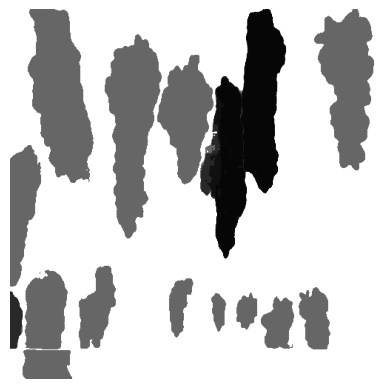

In [24]:
save_dir = '/Users/utkarshsingh/Documents/Grape_Project/Masks/'
os.makedirs(save_dir, exist_ok=True)
image_name = 'masked_image'

# iterate over each bound. box & mask
for boxes in bbox:
    input_boxes = np.array(boxes)
    masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_boxes[None, :],
        multimask_output=False,
    )
    # on top of image, overlay mask & bounding bx
    for mask, box in zip(masks, input_boxes):
        show_mask(mask, plt.gca())
        print("mask ===== ",mask)
        pred_mask = mask.astype(bool)
        print("pred_mask == ",pred_mask)
        print("len pred mask = ",len(pred_mask))
        #show_box(box, plt.gca())

plt.axis('off')
plt.savefig(os.path.join(save_dir, f'{image_name}.jpg'), bbox_inches='tight')
plt.show()

In [25]:
mask_generator = SamAutomaticMaskGenerator(sam)

In [26]:
image

array([[[172, 188, 197],
        [158, 169, 175],
        [162, 173, 175],
        ...,
        [ 63,  58,  46],
        [ 59,  55,  43],
        [ 60,  59,  45]],

       [[149, 162, 176],
        [140, 151, 158],
        [147, 157, 150],
        ...,
        [ 53,  48,  36],
        [ 56,  52,  40],
        [ 59,  59,  43]],

       [[133, 146, 160],
        [124, 134, 141],
        [124, 132, 121],
        ...,
        [ 50,  45,  34],
        [ 54,  50,  40],
        [ 56,  54,  42]],

       ...,

       [[251, 255, 255],
        [224, 230, 231],
        [201, 211, 223],
        ...,
        [ 78,  70,  62],
        [ 72,  66,  57],
        [ 62,  57,  47]],

       [[246, 255, 255],
        [182, 189, 194],
        [175, 189, 200],
        ...,
        [ 73,  65,  56],
        [ 70,  63,  54],
        [ 63,  57,  47]],

       [[216, 232, 234],
        [173, 183, 188],
        [168, 182, 188],
        ...,
        [ 67,  63,  52],
        [ 66,  61,  50],
        [ 62,  58,  47]]

In [27]:
# mask
output_mask = mask_generator.generate(image)
print(output_mask)

[{'segmentation': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), 'area': 7905, 'bbox': [198, 60, 77, 175], 'predicted_iou': 1.0318336486816406, 'point_coords': [[257.8125, 148.4375]], 'stability_score': 0.9759669303894043, 'crop_box': [0, 0, 500, 500]}, {'segmentation': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), 'area': 12297, 'bbox': [128, 35, 76, 273], 'predicted_iou': 1.00755858421325

In [28]:
# fn to i/p the o/p & plots img & mask
def show_output(result_dict,axes=None):
    
    if axes:
        ax = axes
    else:
        ax = plt.gca()
        ax.set_autoscale_on(False)
    sorted_result = sorted(result_dict, key=(lambda x: x['area']),      reverse=True)
    # plt per segment area
    for val in sorted_result:
        
        mask = val['segmentation']
        img = np.ones((mask.shape[0], mask.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
            ax.imshow(np.dstack((img, mask*0.5)))

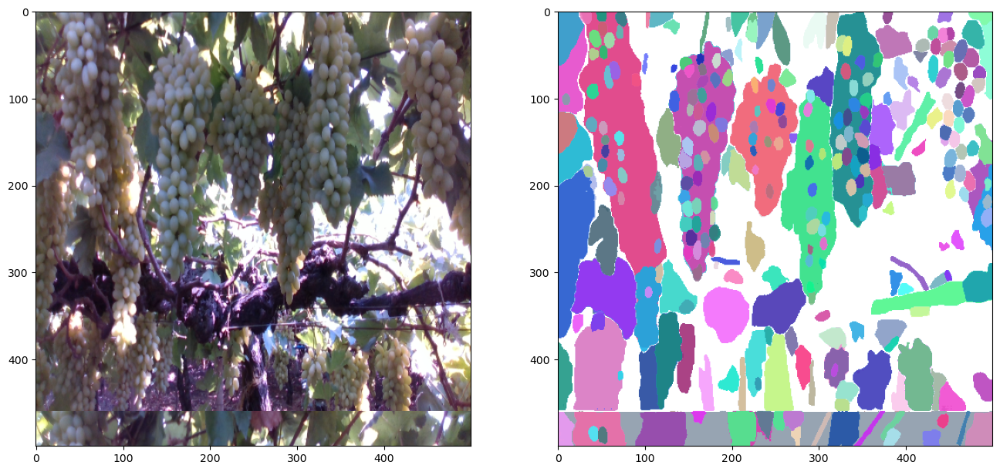

In [29]:
_,axes = plt.subplots(1,2, figsize=(16,16))
axes[0].imshow(image)
show_output(output_mask, axes[1])

### Getting Masks for 500 images of Dataset2

In [4]:
folder_path = "/Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/"

image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

In [32]:
save_dir = '/Users/utkarshsingh/Documents/Grape_Project/Masks_Dataset2'
os.makedirs(save_dir, exist_ok=True)

In [34]:
len(image_files)

501


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1838).jpg: 512x512 6 grapess, 77.4ms
Speed: 2.1ms preprocess, 77.4ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


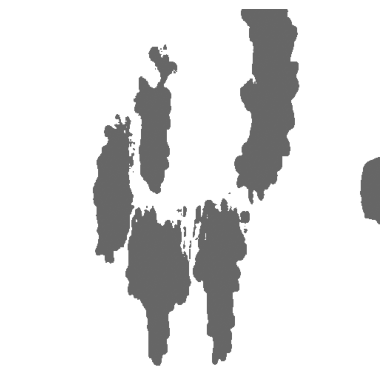


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1992).jpg: 512x512 5 grapess, 73.3ms
Speed: 7.2ms preprocess, 73.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


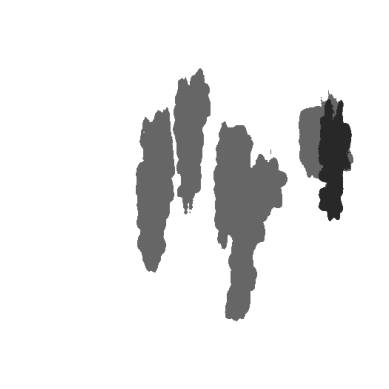


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1584).jpg: 512x512 9 grapess, 77.8ms
Speed: 1.3ms preprocess, 77.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


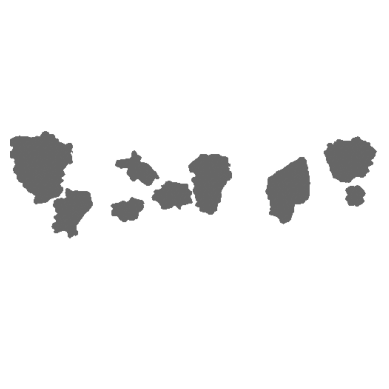


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1707).jpg: 512x512 7 grapess, 68.5ms
Speed: 1.3ms preprocess, 68.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


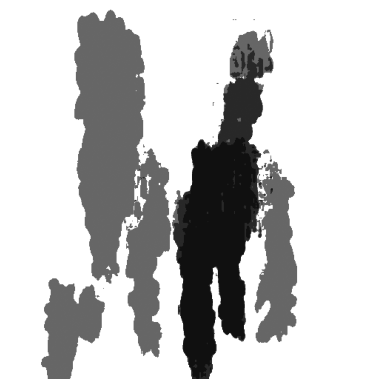


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1642).jpg: 512x512 15 grapess, 68.0ms
Speed: 1.3ms preprocess, 68.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


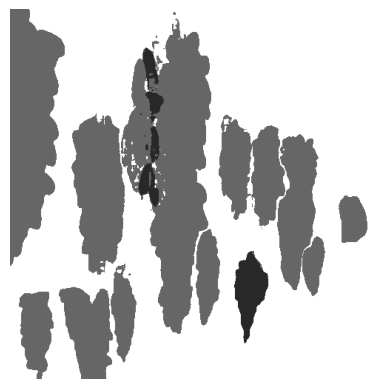


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1880).jpg: 512x512 10 grapess, 60.9ms
Speed: 1.1ms preprocess, 60.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


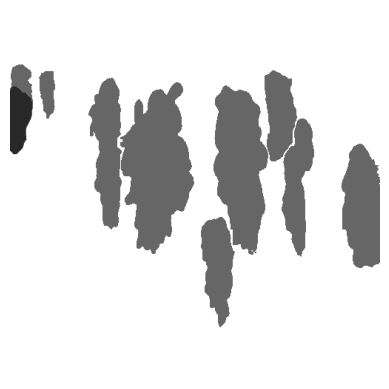


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1750).jpg: 512x512 13 grapess, 66.9ms
Speed: 1.1ms preprocess, 66.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


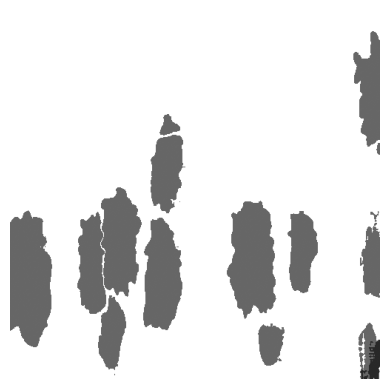


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1615).jpg: 512x512 5 grapess, 64.9ms
Speed: 1.2ms preprocess, 64.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


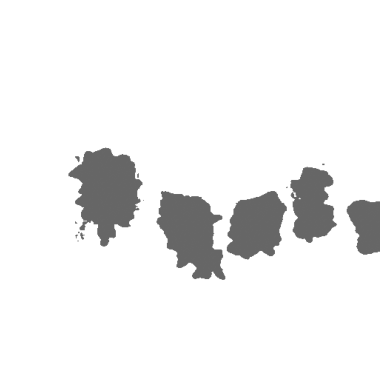


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1879).jpg: 512x512 13 grapess, 70.3ms
Speed: 1.2ms preprocess, 70.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


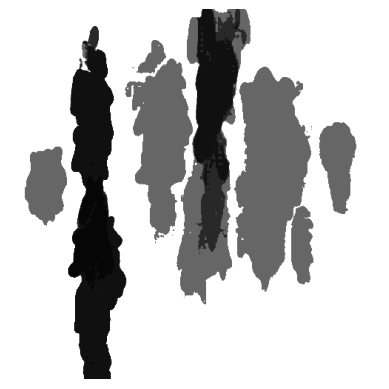


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1896).jpg: 512x512 16 grapess, 63.7ms
Speed: 1.0ms preprocess, 63.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


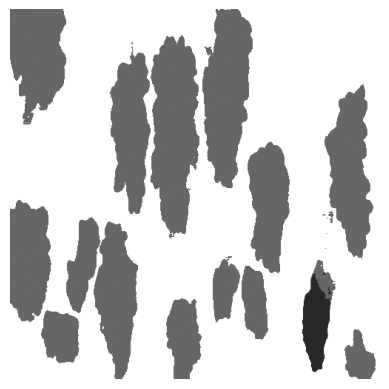


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1746).jpg: 512x512 5 grapess, 61.6ms
Speed: 1.2ms preprocess, 61.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


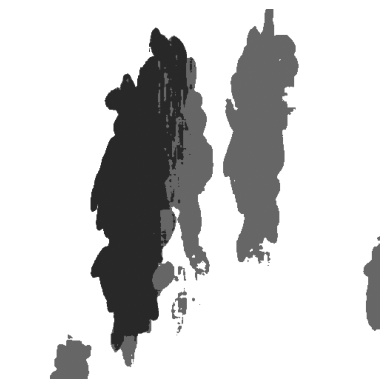


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1603).jpg: 512x512 5 grapess, 62.7ms
Speed: 1.2ms preprocess, 62.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


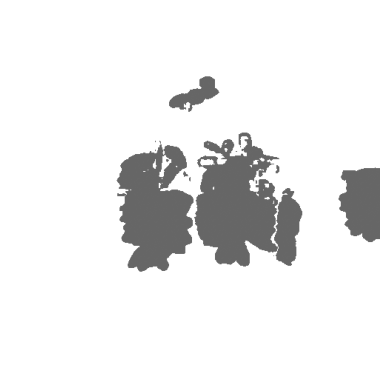


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1984).jpg: 512x512 6 grapess, 66.6ms
Speed: 1.1ms preprocess, 66.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


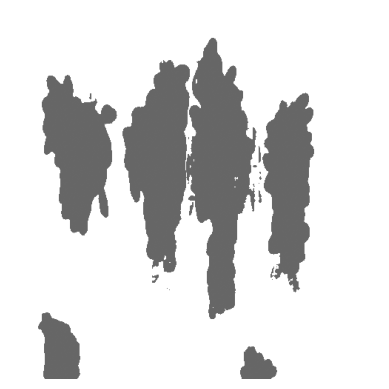


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1592).jpg: 512x512 10 grapess, 63.5ms
Speed: 1.0ms preprocess, 63.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


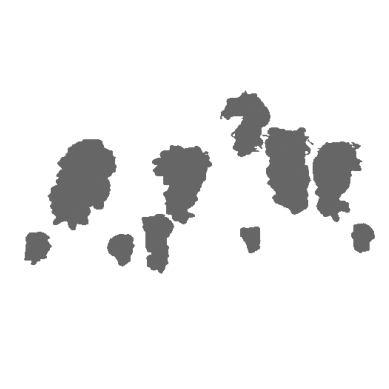


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1711).jpg: 512x512 12 grapess, 59.7ms
Speed: 1.2ms preprocess, 59.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


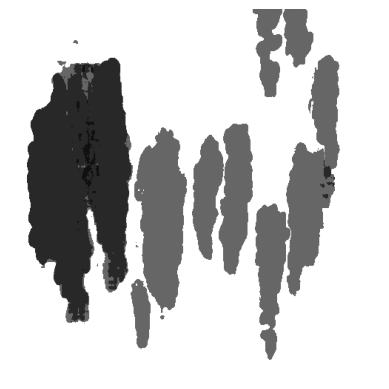


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1654).jpg: 512x512 11 grapess, 60.7ms
Speed: 1.0ms preprocess, 60.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


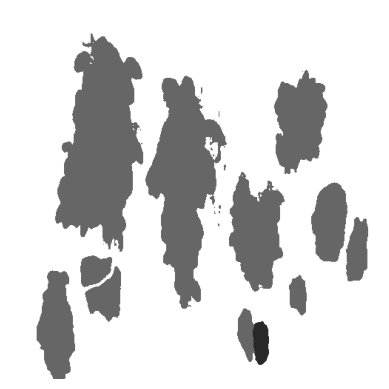


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1910).jpg: 512x512 9 grapess, 60.8ms
Speed: 1.0ms preprocess, 60.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


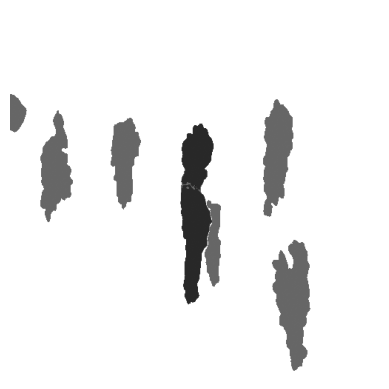


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1855).jpg: 512x512 9 grapess, 60.7ms
Speed: 1.1ms preprocess, 60.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


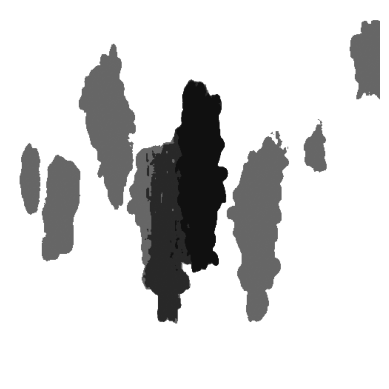


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1506).jpg: 512x512 2 grapess, 71.8ms
Speed: 1.2ms preprocess, 71.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


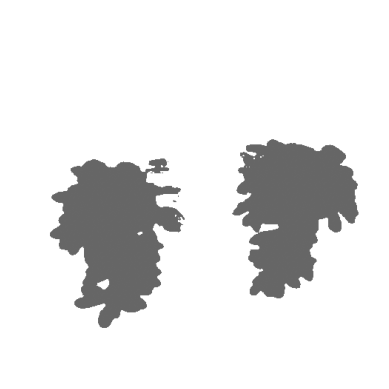


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1785).jpg: 512x512 7 grapess, 63.2ms
Speed: 1.2ms preprocess, 63.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


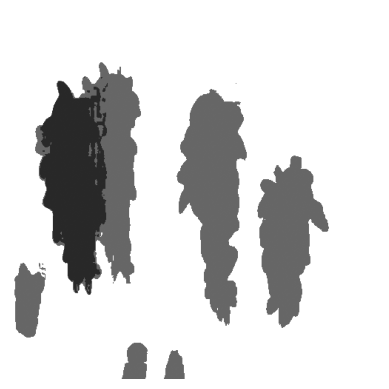


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1947).jpg: 512x512 6 grapess, 59.6ms
Speed: 1.1ms preprocess, 59.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


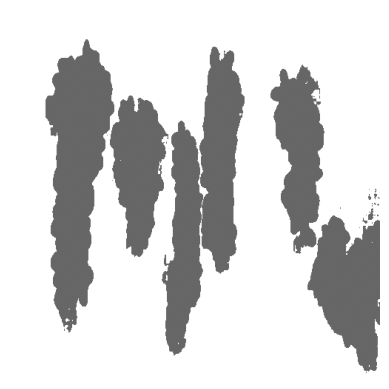


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1551).jpg: 512x512 7 grapess, 61.2ms
Speed: 1.2ms preprocess, 61.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


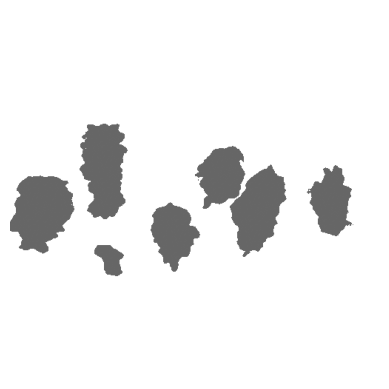


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1802).jpg: 512x512 4 grapess, 63.3ms
Speed: 1.3ms preprocess, 63.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


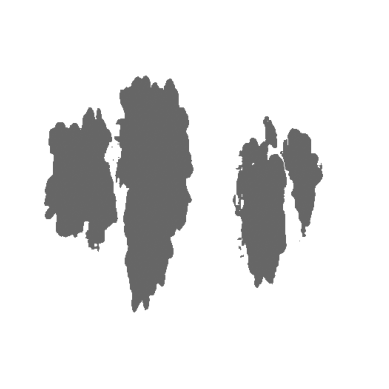


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1678).jpg: 512x512 6 grapess, 61.0ms
Speed: 1.2ms preprocess, 61.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


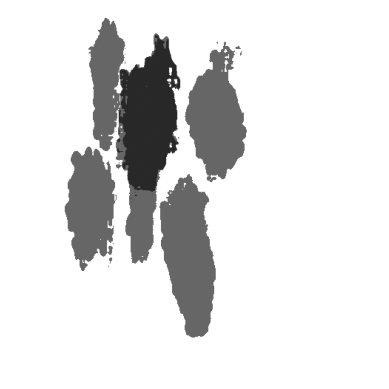


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1697).jpg: 512x512 5 grapess, 59.0ms
Speed: 1.1ms preprocess, 59.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


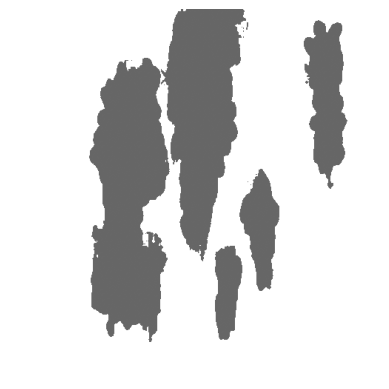


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1951).jpg: 512x512 7 grapess, 64.1ms
Speed: 1.2ms preprocess, 64.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


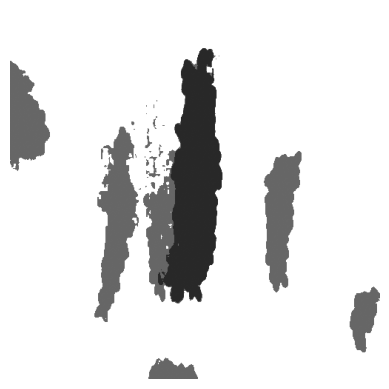


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1814).jpg: 512x512 9 grapess, 65.7ms
Speed: 1.2ms preprocess, 65.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


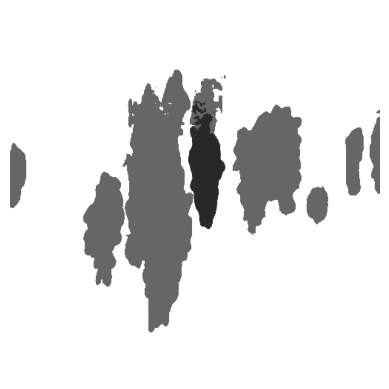


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1547).jpg: 512x512 3 grapess, 61.8ms
Speed: 1.0ms preprocess, 61.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


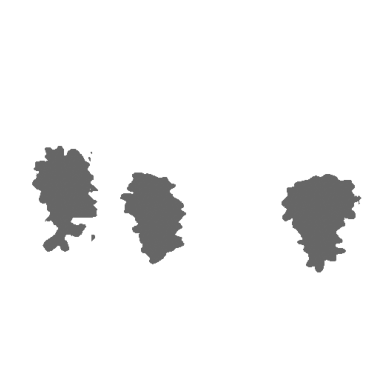


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1681).jpg: 512x512 10 grapess, 65.9ms
Speed: 1.2ms preprocess, 65.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


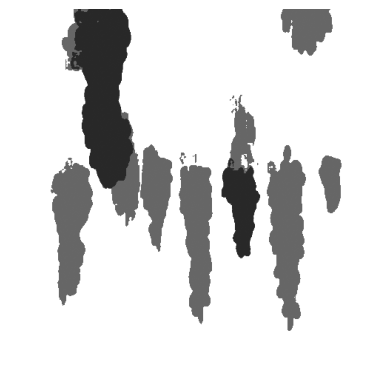


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1906).jpg: 512x512 17 grapess, 60.5ms
Speed: 1.1ms preprocess, 60.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


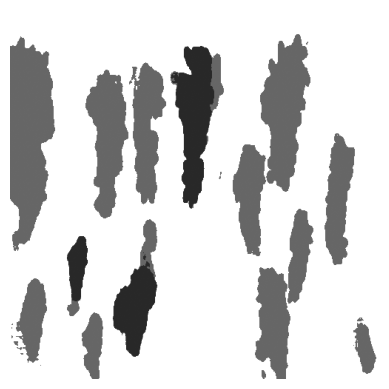


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1510).jpg: 512x512 5 grapess, 62.7ms
Speed: 1.2ms preprocess, 62.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


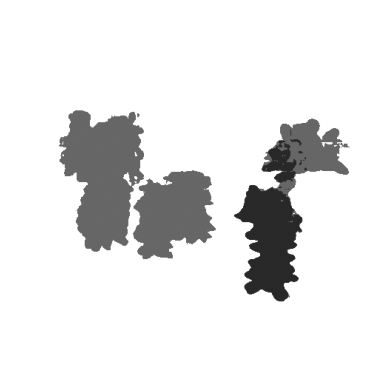


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1843).jpg: 512x512 7 grapess, 71.6ms
Speed: 1.2ms preprocess, 71.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


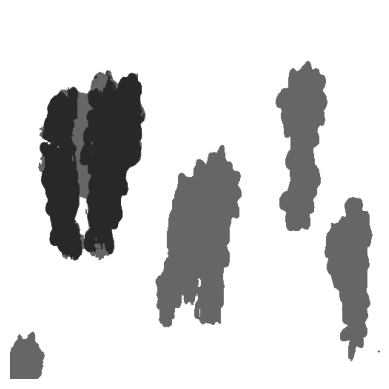


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1639).jpg: 512x512 14 grapess, 61.0ms
Speed: 1.2ms preprocess, 61.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


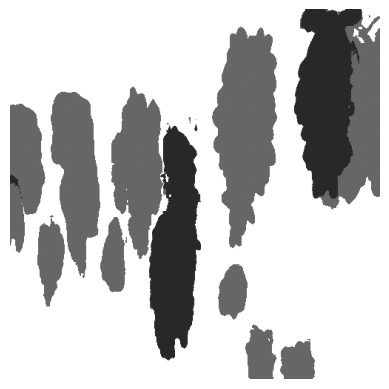


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1793).jpg: 512x512 13 grapess, 59.5ms
Speed: 1.2ms preprocess, 59.5ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


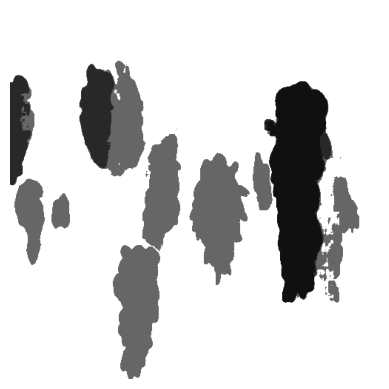


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1834).jpg: 512x512 10 grapess, 71.5ms
Speed: 1.1ms preprocess, 71.5ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


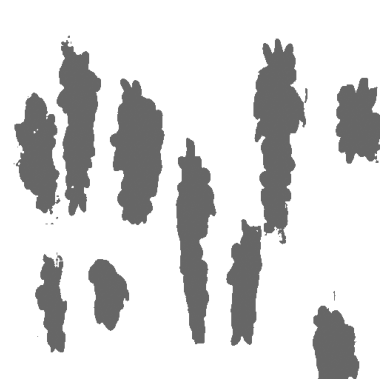


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1567).jpg: 512x512 2 grapess, 63.3ms
Speed: 1.1ms preprocess, 63.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


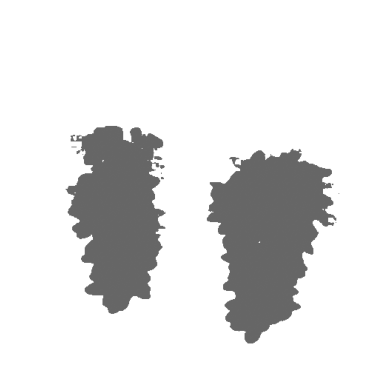


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1588).jpg: 512x512 6 grapess, 67.2ms
Speed: 1.1ms preprocess, 67.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


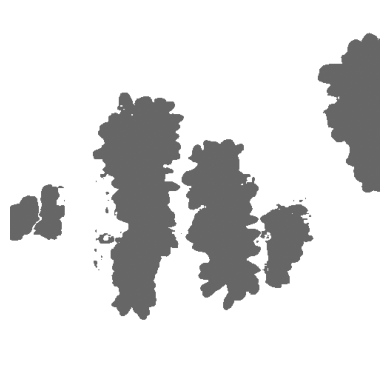


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1971).jpg: 512x512 6 grapess, 69.3ms
Speed: 1.3ms preprocess, 69.3ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


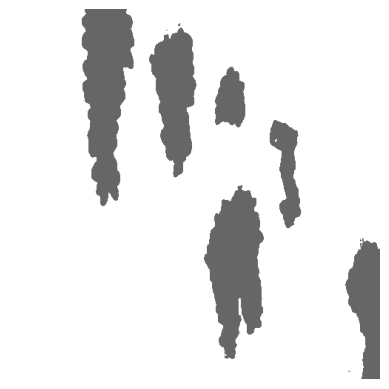


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1619).jpg: 512x512 7 grapess, 63.9ms
Speed: 1.2ms preprocess, 63.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


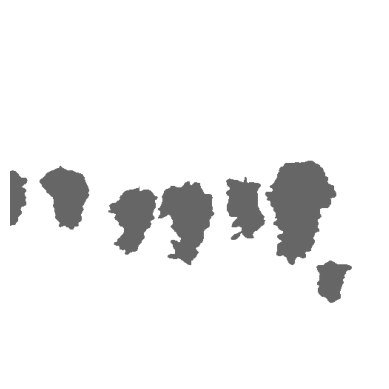


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1530).jpg: 512x512 8 grapess, 62.5ms
Speed: 1.1ms preprocess, 62.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


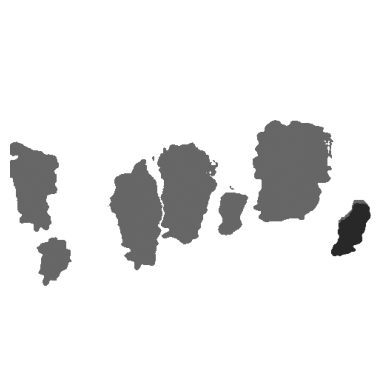


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1863).jpg: 512x512 7 grapess, 63.8ms
Speed: 1.1ms preprocess, 63.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


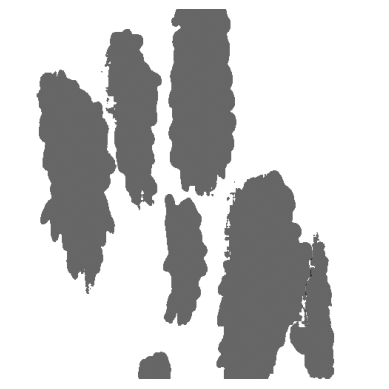


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1926).jpg: 512x512 8 grapess, 62.7ms
Speed: 1.2ms preprocess, 62.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


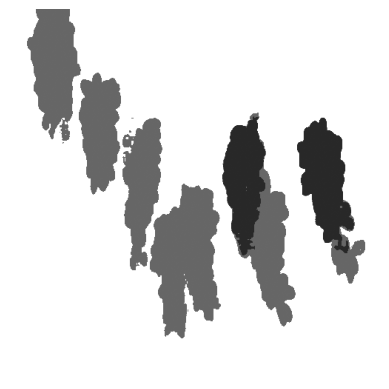


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1875).jpg: 512x512 8 grapess, 63.3ms
Speed: 1.1ms preprocess, 63.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


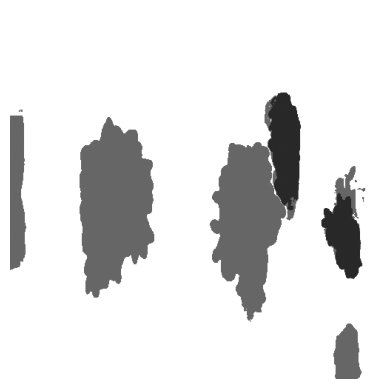


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1526).jpg: 512x512 8 grapess, 63.5ms
Speed: 1.1ms preprocess, 63.5ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


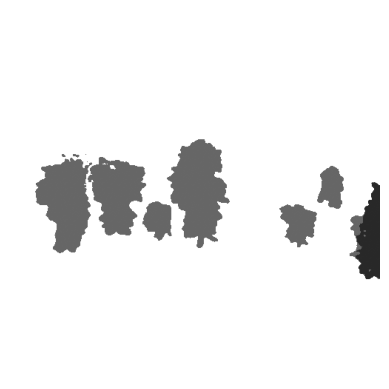


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1930).jpg: 512x512 11 grapess, 60.6ms
Speed: 1.2ms preprocess, 60.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


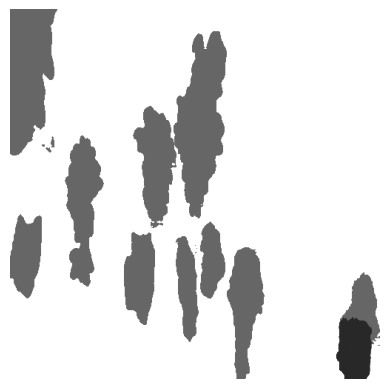


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1658).jpg: 512x512 13 grapess, 59.8ms
Speed: 1.1ms preprocess, 59.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


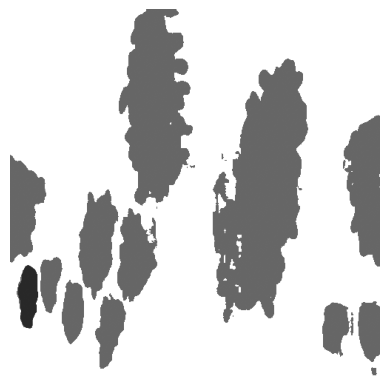


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1571).jpg: 512x512 5 grapess, 57.6ms
Speed: 1.2ms preprocess, 57.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


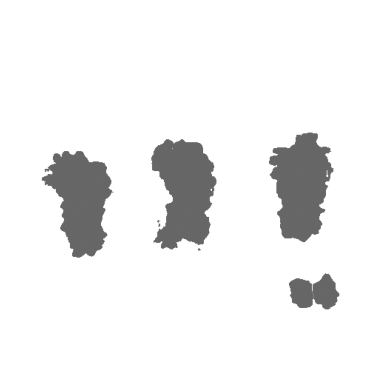


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1822).jpg: 512x512 8 grapess, 65.8ms
Speed: 1.1ms preprocess, 65.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


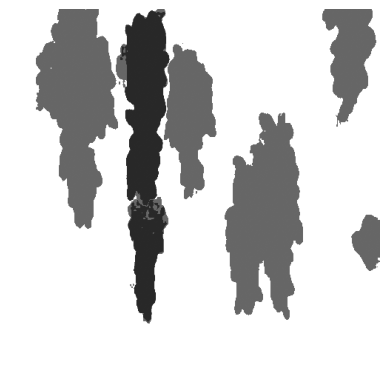


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1988).jpg: 512x512 6 grapess, 60.4ms
Speed: 1.1ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


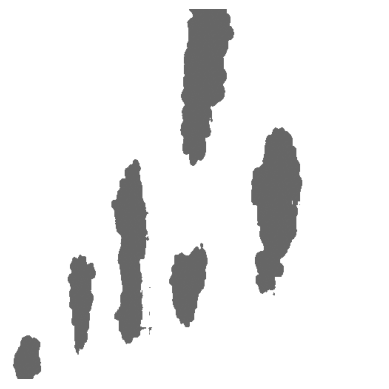


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1967).jpg: 512x512 7 grapess, 67.7ms
Speed: 1.1ms preprocess, 67.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


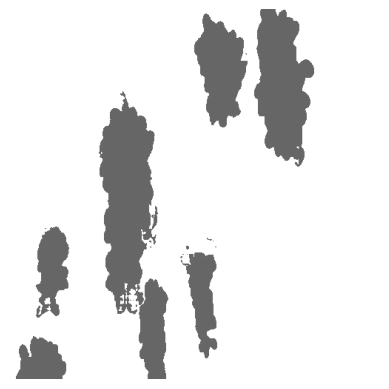


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1623).jpg: 512x512 5 grapess, 66.3ms
Speed: 1.1ms preprocess, 66.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


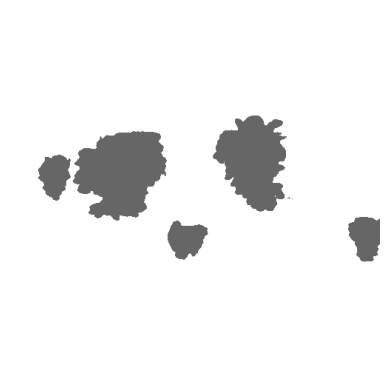


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1789).jpg: 512x512 6 grapess, 62.7ms
Speed: 1.1ms preprocess, 62.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


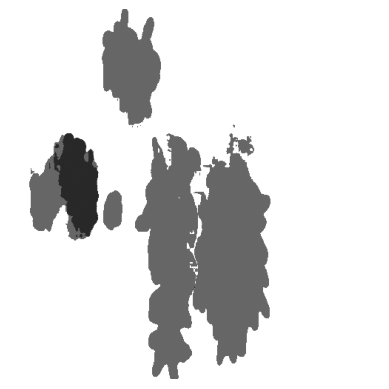


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1766).jpg: 512x512 6 grapess, 60.3ms
Speed: 1.0ms preprocess, 60.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


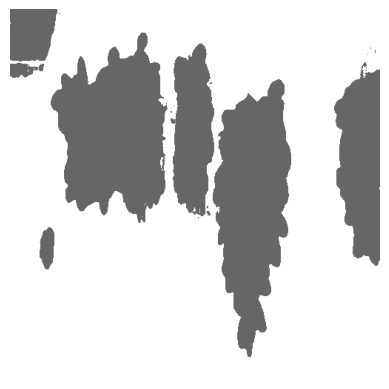


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1859).jpg: 512x512 5 grapess, 59.7ms
Speed: 1.2ms preprocess, 59.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


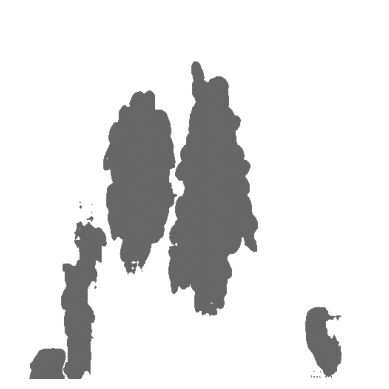


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1674).jpg: 512x512 6 grapess, 67.8ms
Speed: 1.2ms preprocess, 67.8ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


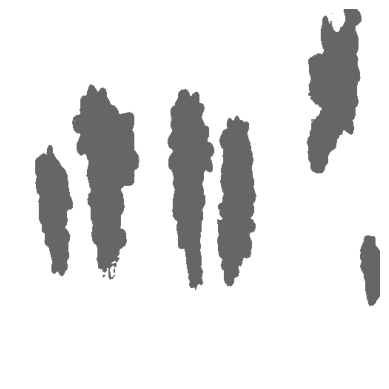


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1731).jpg: 512x512 8 grapess, 60.6ms
Speed: 1.2ms preprocess, 60.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


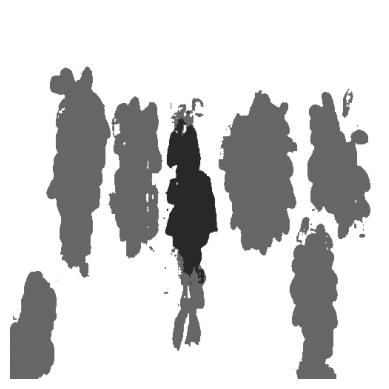


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1662).jpg: 512x512 15 grapess, 66.0ms
Speed: 1.3ms preprocess, 66.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


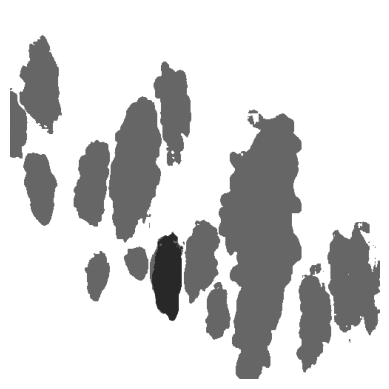


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1727).jpg: 512x512 14 grapess, 67.8ms
Speed: 1.1ms preprocess, 67.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


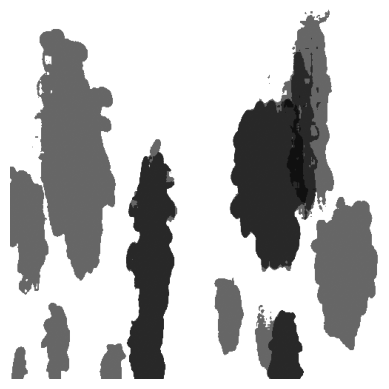


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1818).jpg: 512x512 8 grapess, 71.4ms
Speed: 1.5ms preprocess, 71.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


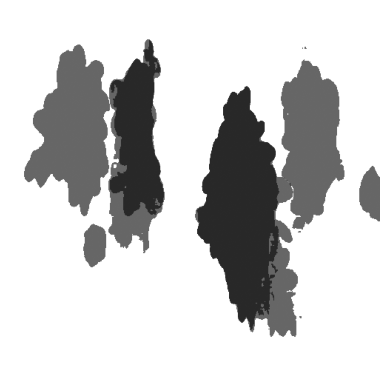


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1635).jpg: 512x512 11 grapess, 63.9ms
Speed: 1.1ms preprocess, 63.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


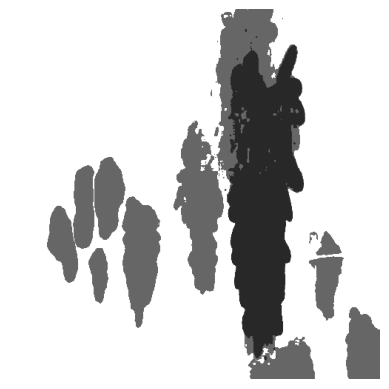


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1770).jpg: 512x512 17 grapess, 59.4ms
Speed: 1.1ms preprocess, 59.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


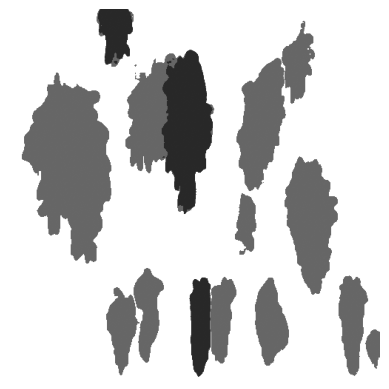


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1634).jpg: 512x512 6 grapess, 62.1ms
Speed: 1.0ms preprocess, 62.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


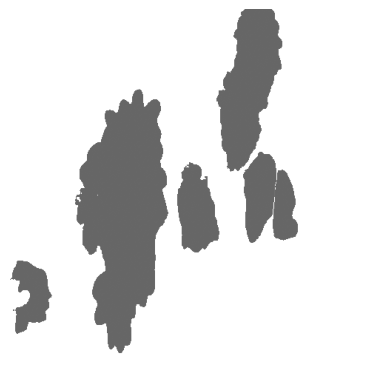


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1771).jpg: 512x512 6 grapess, 68.8ms
Speed: 1.2ms preprocess, 68.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


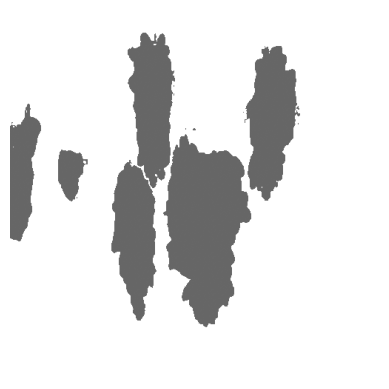


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1819).jpg: 512x512 9 grapess, 66.6ms
Speed: 1.1ms preprocess, 66.6ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


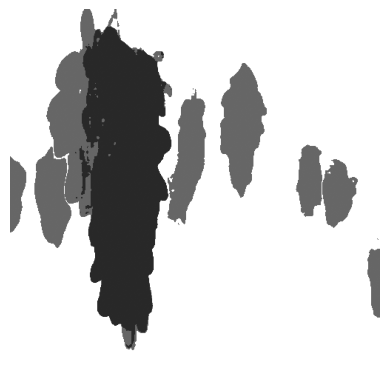


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1663).jpg: 512x512 14 grapess, 60.3ms
Speed: 1.2ms preprocess, 60.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


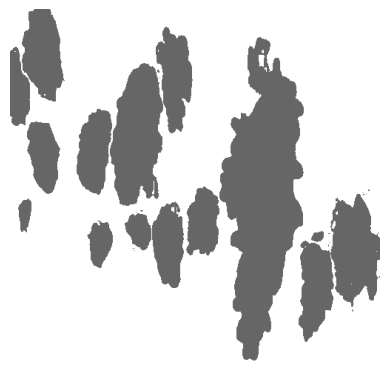


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1726).jpg: 512x512 4 grapess, 60.2ms
Speed: 1.0ms preprocess, 60.2ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


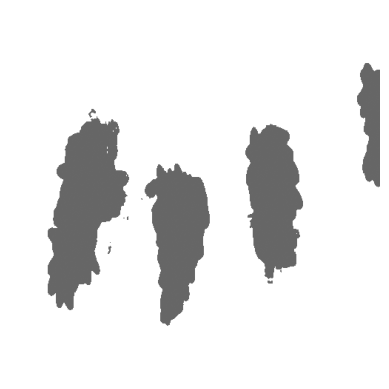


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1675).jpg: 512x512 6 grapess, 58.9ms
Speed: 1.2ms preprocess, 58.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


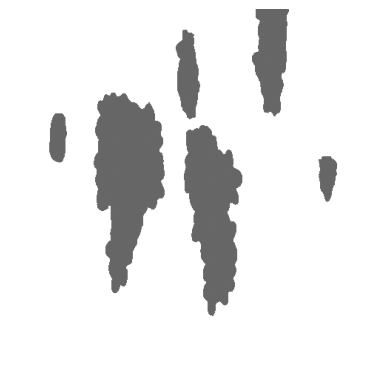


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1730).jpg: 512x512 5 grapess, 60.6ms
Speed: 1.4ms preprocess, 60.6ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


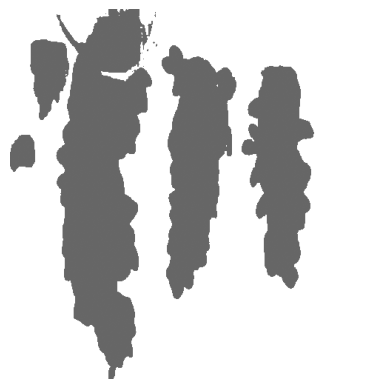


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1858).jpg: 512x512 8 grapess, 63.5ms
Speed: 1.1ms preprocess, 63.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


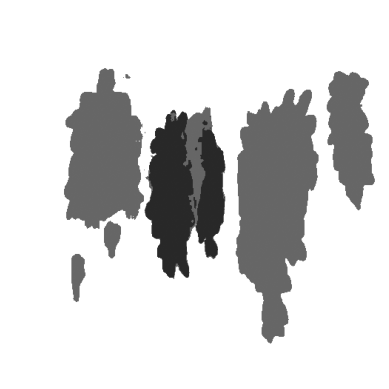


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1622).jpg: 512x512 3 grapess, 61.9ms
Speed: 1.2ms preprocess, 61.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


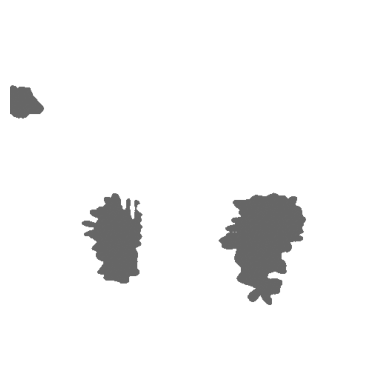


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1788).jpg: 512x512 7 grapess, 59.0ms
Speed: 1.1ms preprocess, 59.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


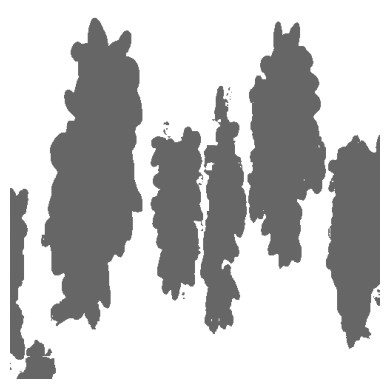


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1767).jpg: 512x512 11 grapess, 62.8ms
Speed: 1.2ms preprocess, 62.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


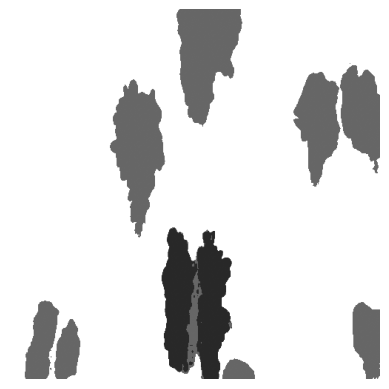


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1570).jpg: 512x512 4 grapess, 60.0ms
Speed: 1.1ms preprocess, 60.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


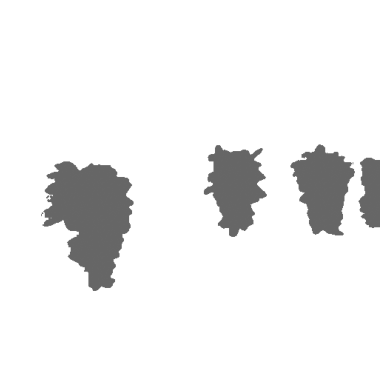


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1823).jpg: 512x512 6 grapess, 62.5ms
Speed: 1.2ms preprocess, 62.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


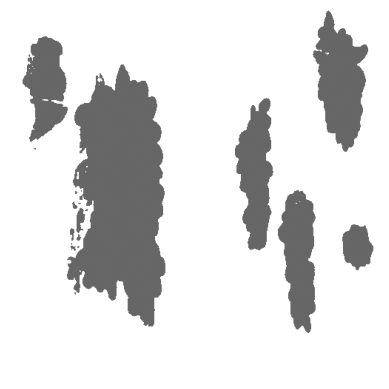


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1989).jpg: 512x512 9 grapess, 69.1ms
Speed: 1.2ms preprocess, 69.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


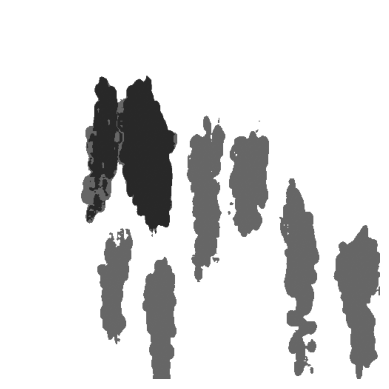


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1966).jpg: 512x512 11 grapess, 59.5ms
Speed: 1.0ms preprocess, 59.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


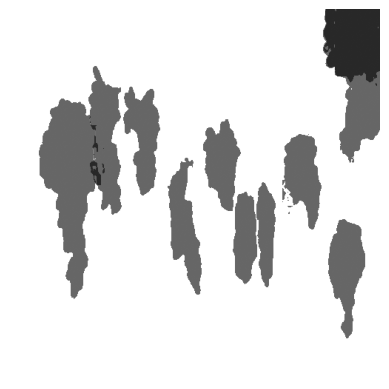


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1659).jpg: 512x512 16 grapess, 59.0ms
Speed: 1.2ms preprocess, 59.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


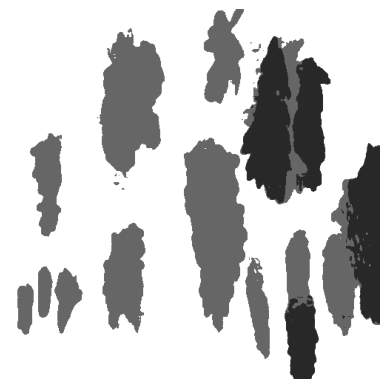


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1874).jpg: 512x512 5 grapess, 64.0ms
Speed: 1.2ms preprocess, 64.0ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


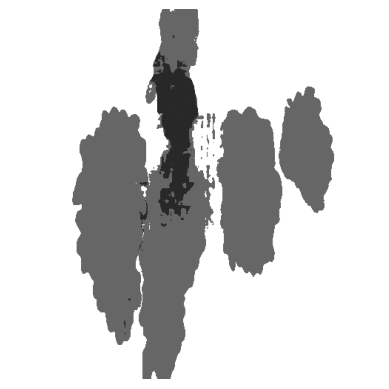


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1527).jpg: 512x512 2 grapess, 58.0ms
Speed: 1.2ms preprocess, 58.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


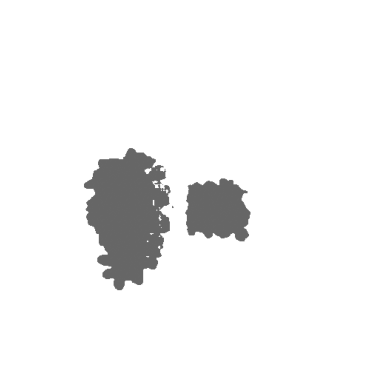


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1931).jpg: 512x512 10 grapess, 59.7ms
Speed: 1.2ms preprocess, 59.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


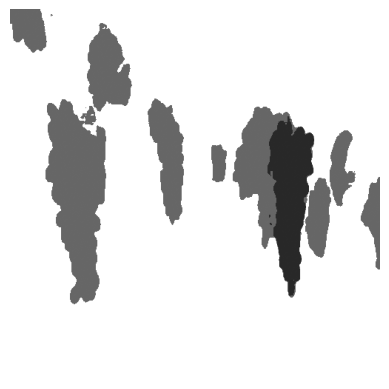


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1531).jpg: 512x512 11 grapess, 76.1ms
Speed: 1.2ms preprocess, 76.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


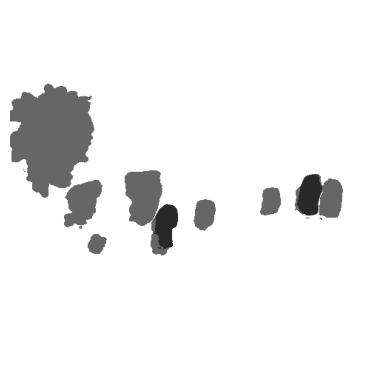


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1862).jpg: 512x512 14 grapess, 60.0ms
Speed: 1.0ms preprocess, 60.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


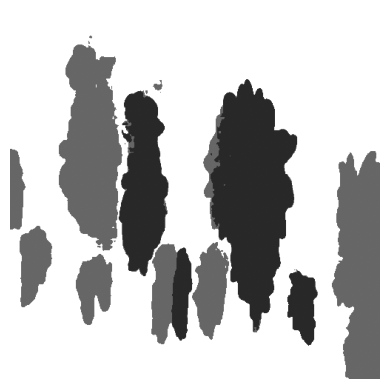


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1927).jpg: 512x512 8 grapess, 58.8ms
Speed: 1.2ms preprocess, 58.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


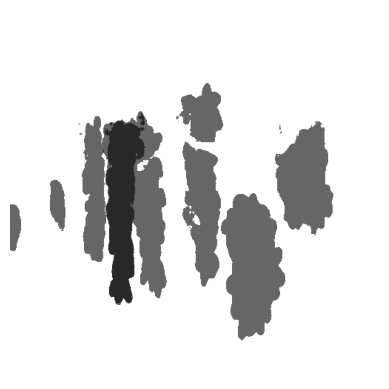


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1618).jpg: 512x512 8 grapess, 60.5ms
Speed: 1.1ms preprocess, 60.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


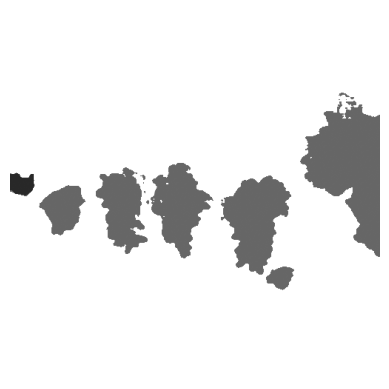


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1835).jpg: 512x512 8 grapess, 60.7ms
Speed: 1.9ms preprocess, 60.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


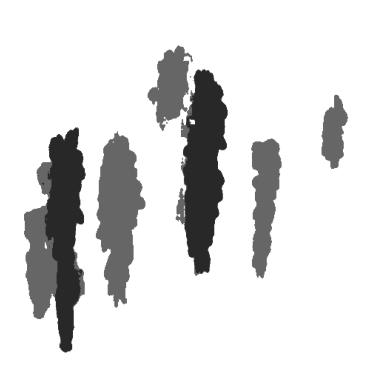


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1566).jpg: 512x512 10 grapess, 65.0ms
Speed: 1.0ms preprocess, 65.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


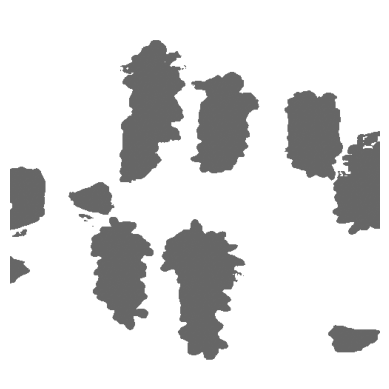


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1589).jpg: 512x512 10 grapess, 74.4ms
Speed: 1.2ms preprocess, 74.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


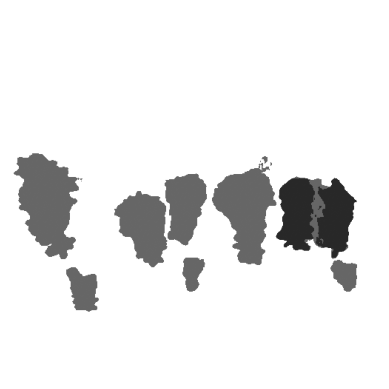


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1970).jpg: 512x512 13 grapess, 59.9ms
Speed: 1.1ms preprocess, 59.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


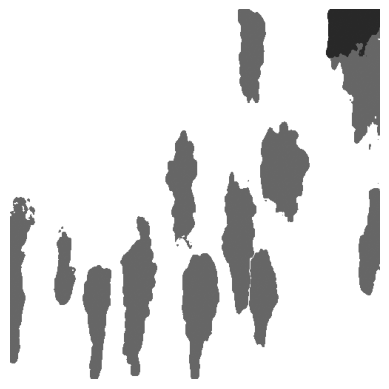


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1638).jpg: 512x512 10 grapess, 56.8ms
Speed: 1.0ms preprocess, 56.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


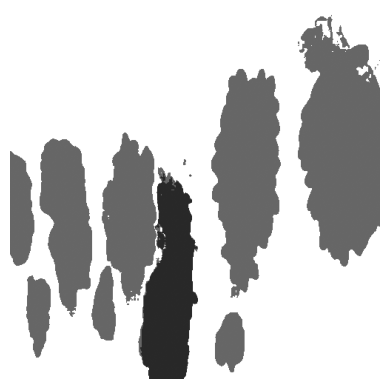


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1792).jpg: 512x512 11 grapess, 66.4ms
Speed: 1.1ms preprocess, 66.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


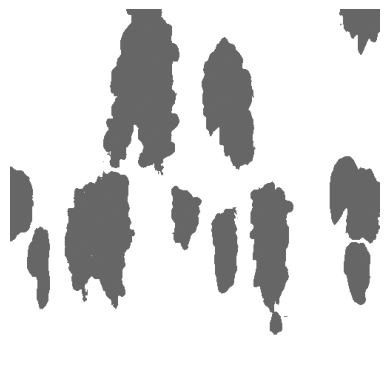


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1907).jpg: 512x512 9 grapess, 58.4ms
Speed: 1.1ms preprocess, 58.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


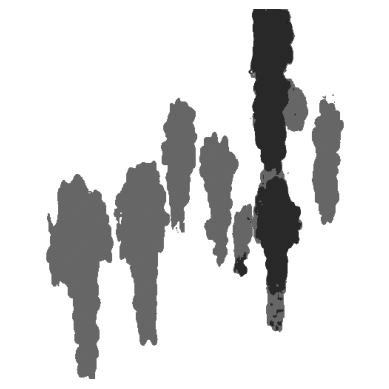


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1511).jpg: 512x512 7 grapess, 61.2ms
Speed: 1.1ms preprocess, 61.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


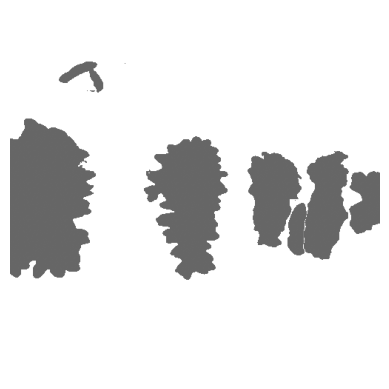


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1842).jpg: 512x512 11 grapess, 64.6ms
Speed: 1.2ms preprocess, 64.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


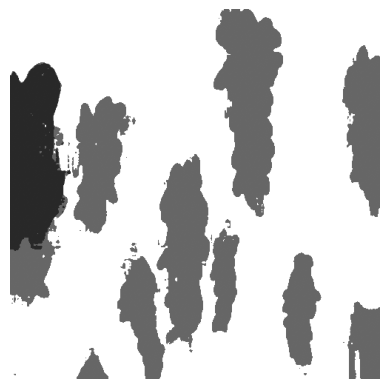


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1680).jpg: 512x512 11 grapess, 57.3ms
Speed: 1.1ms preprocess, 57.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


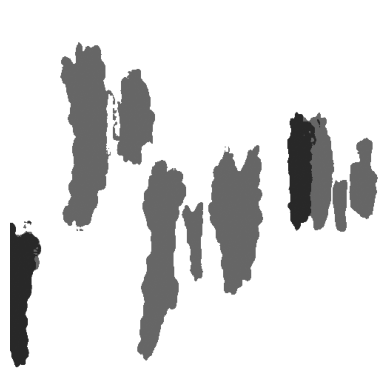


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1950).jpg: 512x512 7 grapess, 58.4ms
Speed: 1.2ms preprocess, 58.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


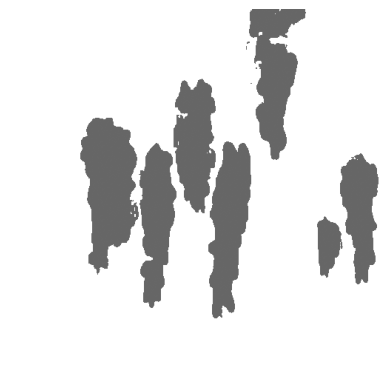


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1815).jpg: 512x512 6 grapess, 62.6ms
Speed: 1.1ms preprocess, 62.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


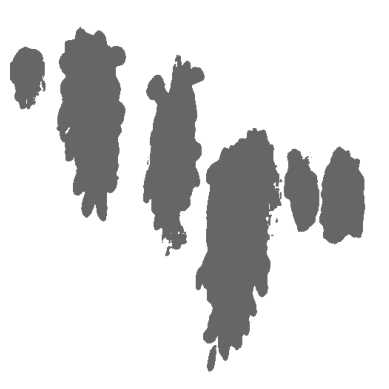


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1546).jpg: 512x512 6 grapess, 62.8ms
Speed: 1.2ms preprocess, 62.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


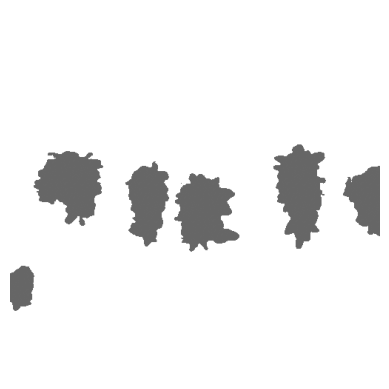


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1679).jpg: 512x512 9 grapess, 61.0ms
Speed: 1.1ms preprocess, 61.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


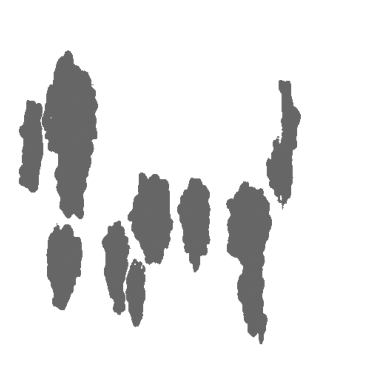


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1696).jpg: 512x512 9 grapess, 64.0ms
Speed: 1.0ms preprocess, 64.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


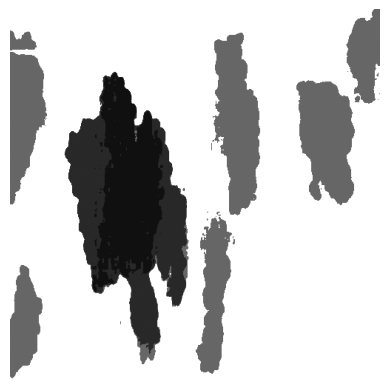


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1946).jpg: 512x512 7 grapess, 59.9ms
Speed: 1.1ms preprocess, 59.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


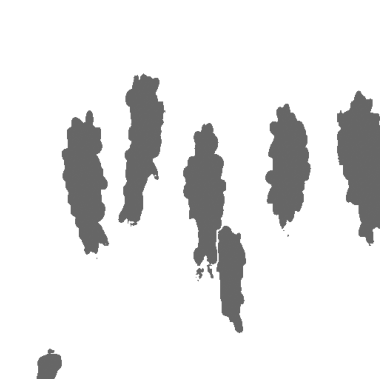


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1550).jpg: 512x512 8 grapess, 61.0ms
Speed: 1.2ms preprocess, 61.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


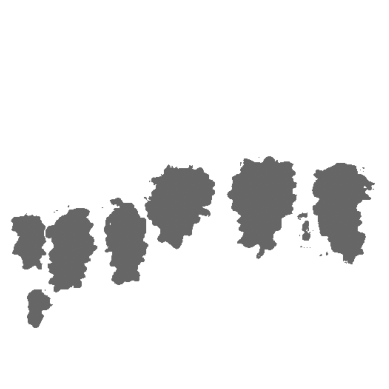


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1803).jpg: 512x512 20 grapess, 63.3ms
Speed: 1.0ms preprocess, 63.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


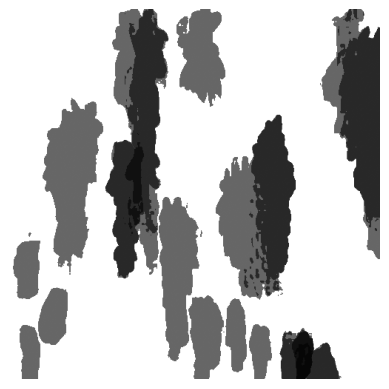


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1784).jpg: 512x512 13 grapess, 60.3ms
Speed: 1.2ms preprocess, 60.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


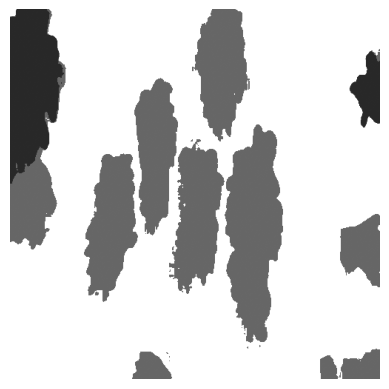


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1911).jpg: 512x512 6 grapess, 57.6ms
Speed: 1.1ms preprocess, 57.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


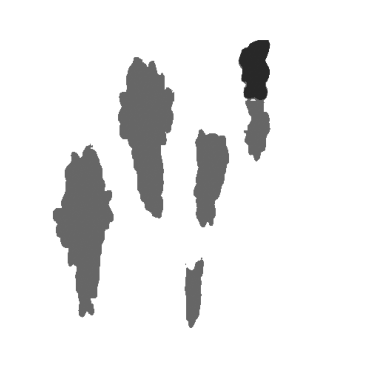


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1854).jpg: 512x512 13 grapess, 89.9ms
Speed: 1.1ms preprocess, 89.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


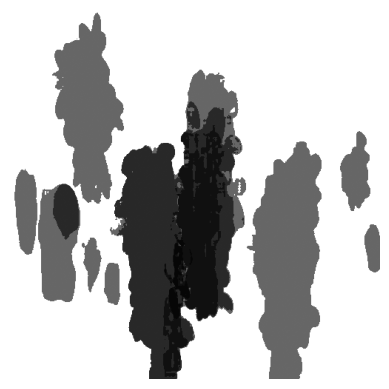


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1507).jpg: 512x512 3 grapess, 59.0ms
Speed: 1.1ms preprocess, 59.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


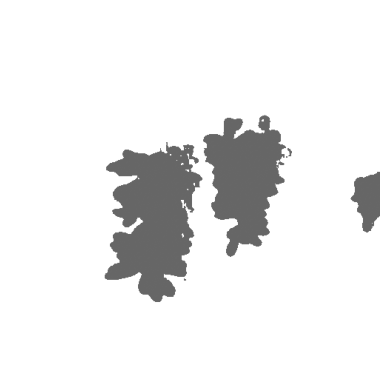


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1710).jpg: 512x512 6 grapess, 63.6ms
Speed: 1.2ms preprocess, 63.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


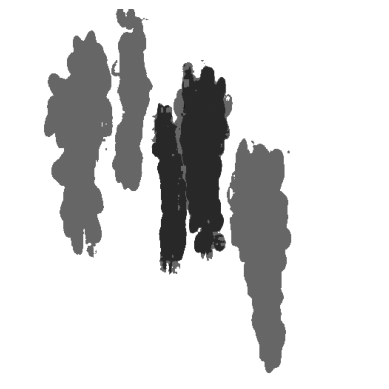


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1655).jpg: 512x512 12 grapess, 62.5ms
Speed: 1.1ms preprocess, 62.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


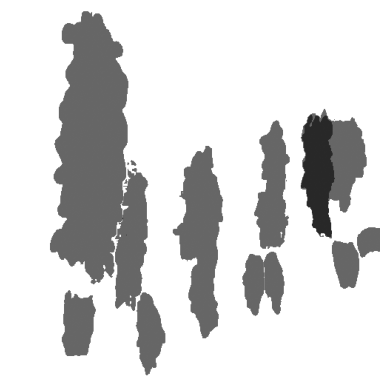


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1985).jpg: 512x512 8 grapess, 59.2ms
Speed: 1.1ms preprocess, 59.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


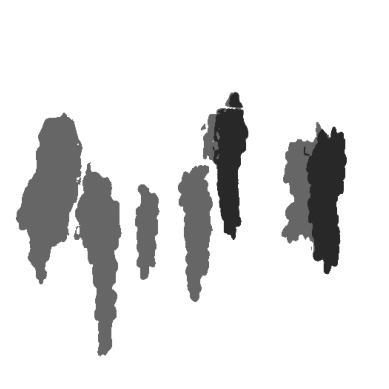


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1593).jpg: 512x512 10 grapess, 60.7ms
Speed: 1.2ms preprocess, 60.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


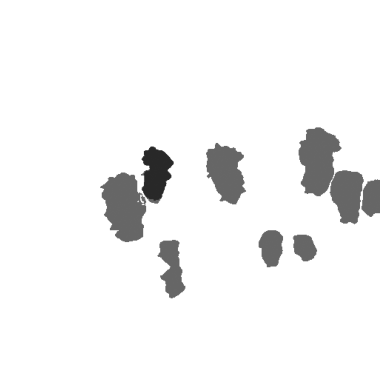


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1747).jpg: 512x512 13 grapess, 60.5ms
Speed: 1.2ms preprocess, 60.5ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


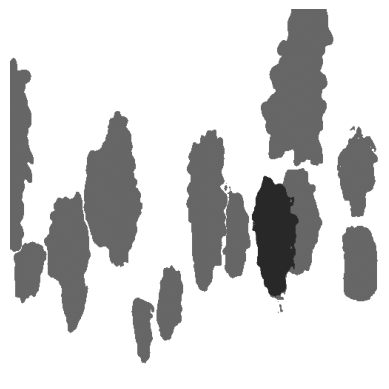


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1602).jpg: 512x512 5 grapess, 62.8ms
Speed: 1.0ms preprocess, 62.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


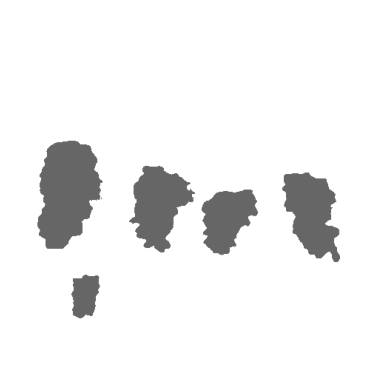


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1878).jpg: 512x512 18 grapess, 67.4ms
Speed: 1.1ms preprocess, 67.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


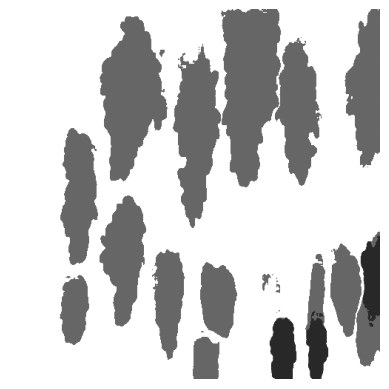


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1897).jpg: 512x512 11 grapess, 62.9ms
Speed: 1.0ms preprocess, 62.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


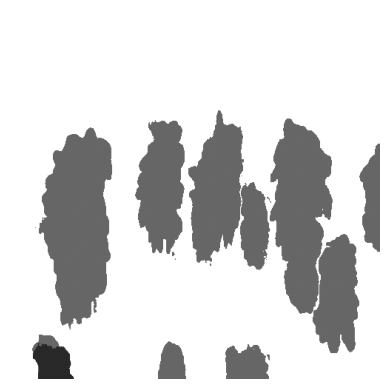


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1751).jpg: 512x512 10 grapess, 61.3ms
Speed: 1.2ms preprocess, 61.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


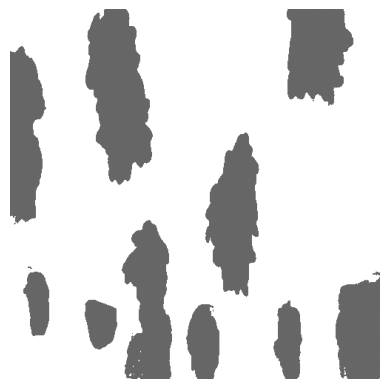


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1614).jpg: 512x512 8 grapess, 55.5ms
Speed: 1.1ms preprocess, 55.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


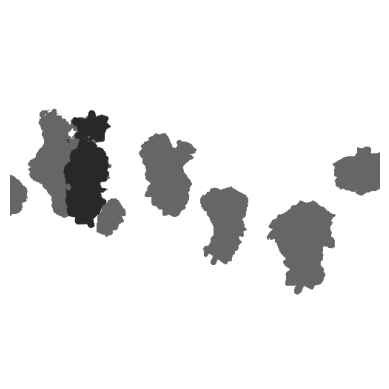


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1881).jpg: 512x512 5 grapess, 70.2ms
Speed: 1.2ms preprocess, 70.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


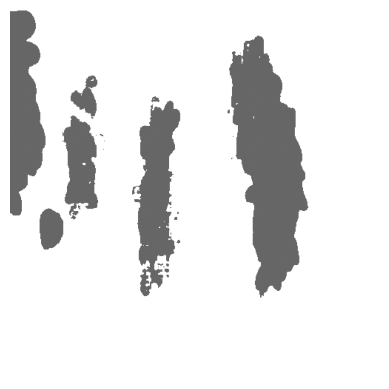


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1706).jpg: 512x512 7 grapess, 65.8ms
Speed: 1.2ms preprocess, 65.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


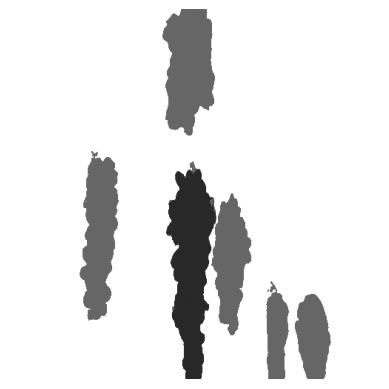


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1643).jpg: 512x512 11 grapess, 62.0ms
Speed: 1.1ms preprocess, 62.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


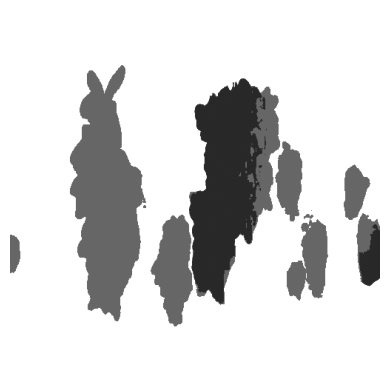


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1839).jpg: 512x512 7 grapess, 79.7ms
Speed: 1.3ms preprocess, 79.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


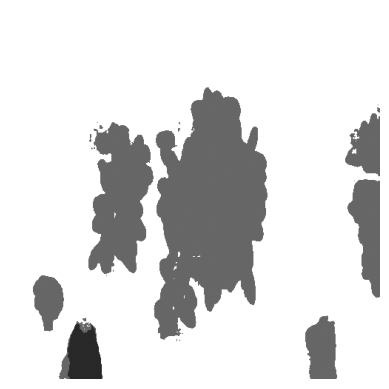


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1993).jpg: 512x512 10 grapess, 136.4ms
Speed: 1.5ms preprocess, 136.4ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


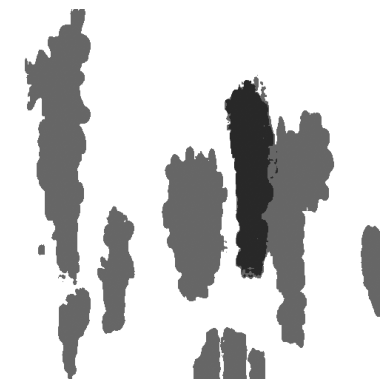


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1585).jpg: 512x512 4 grapess, 87.3ms
Speed: 1.2ms preprocess, 87.3ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


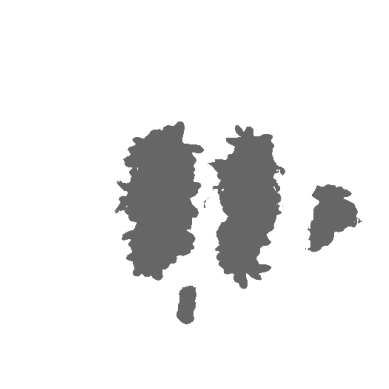


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1648).jpg: 512x512 14 grapess, 99.9ms
Speed: 1.1ms preprocess, 99.9ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


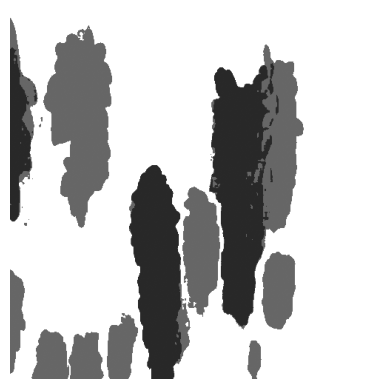


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1561).jpg: 512x512 2 grapess, 70.6ms
Speed: 1.1ms preprocess, 70.6ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


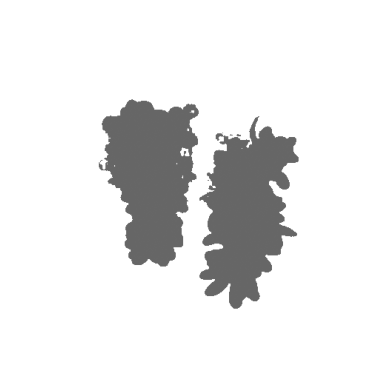


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1998).jpg: 512x512 7 grapess, 71.0ms
Speed: 1.5ms preprocess, 71.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


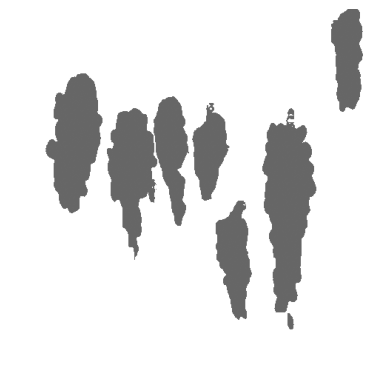


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1832).jpg: 512x512 9 grapess, 119.7ms
Speed: 1.6ms preprocess, 119.7ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


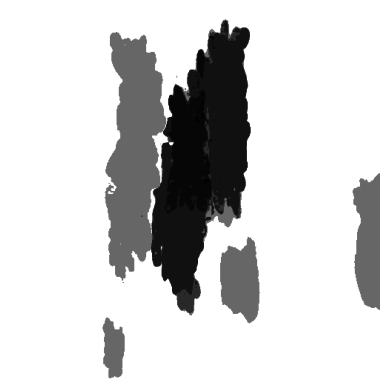


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1977).jpg: 512x512 5 grapess, 73.2ms
Speed: 1.0ms preprocess, 73.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


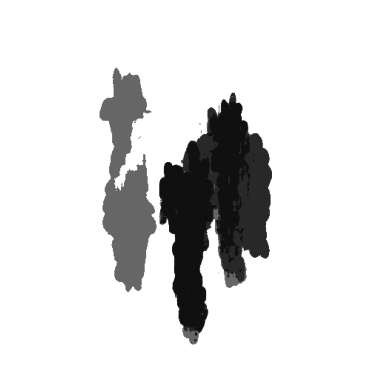


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1865).jpg: 512x512 9 grapess, 86.8ms
Speed: 1.3ms preprocess, 86.8ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


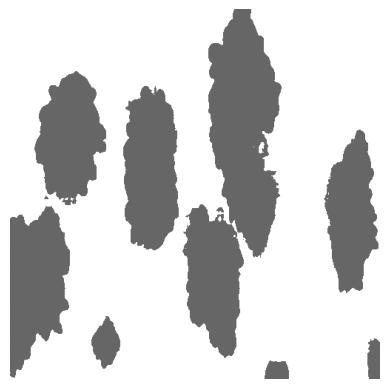


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1536).jpg: 512x512 6 grapess, 77.7ms
Speed: 1.2ms preprocess, 77.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


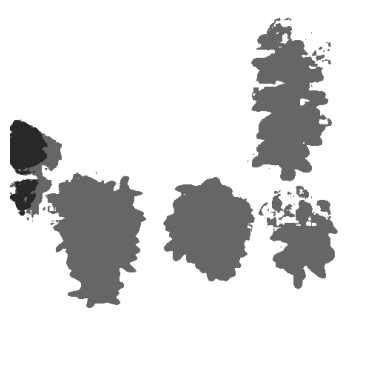


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1920).jpg: 512x512 8 grapess, 75.6ms
Speed: 1.1ms preprocess, 75.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


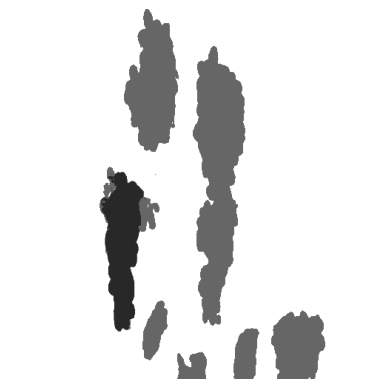


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1609).jpg: 512x512 4 grapess, 82.1ms
Speed: 1.4ms preprocess, 82.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


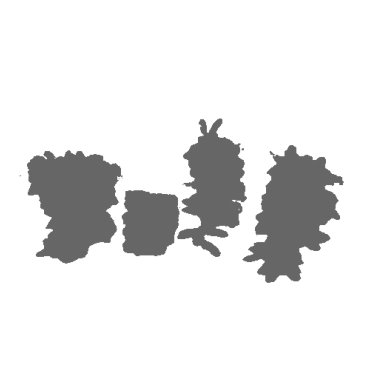


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1520).jpg: 512x512 7 grapess, 100.4ms
Speed: 1.3ms preprocess, 100.4ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


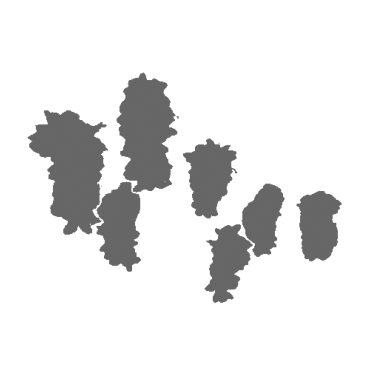


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1873).jpg: 512x512 3 grapess, 75.3ms
Speed: 1.2ms preprocess, 75.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


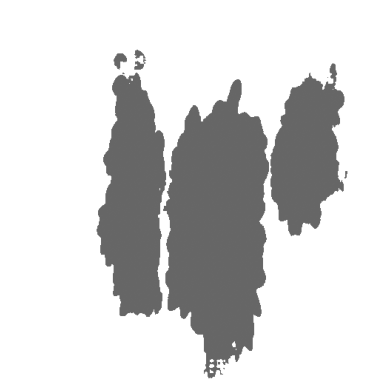


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1936).jpg: 512x512 6 grapess, 77.0ms
Speed: 1.1ms preprocess, 77.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


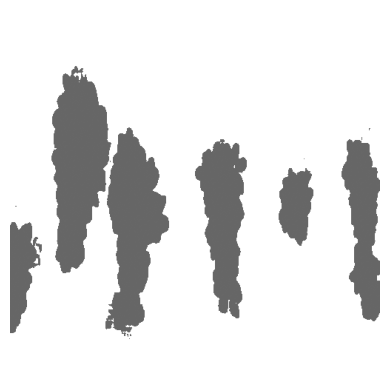


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1824).jpg: 512x512 12 grapess, 77.0ms
Speed: 6.1ms preprocess, 77.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


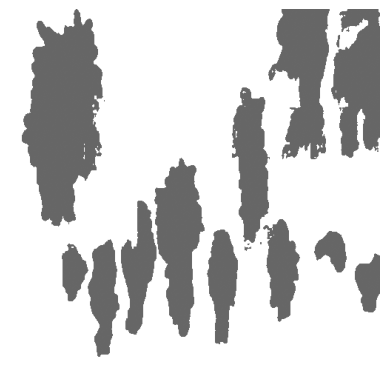


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1577).jpg: 512x512 5 grapess, 91.4ms
Speed: 1.2ms preprocess, 91.4ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


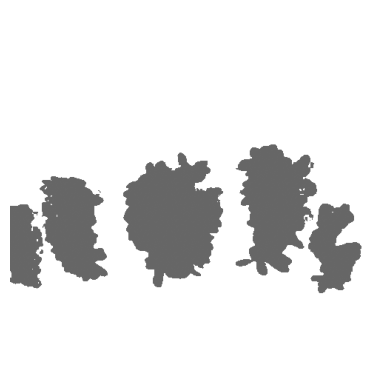


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1598).jpg: 512x512 8 grapess, 76.4ms
Speed: 1.2ms preprocess, 76.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


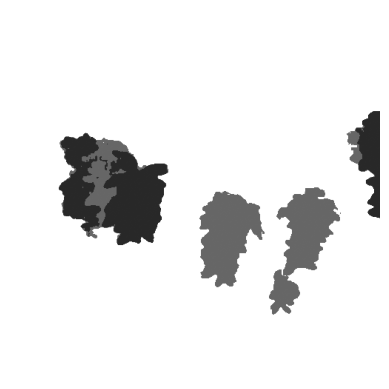


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1961).jpg: 512x512 4 grapess, 73.4ms
Speed: 1.1ms preprocess, 73.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


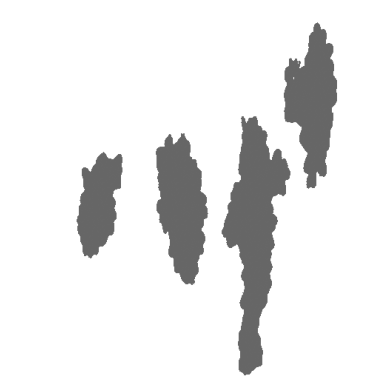


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1625).jpg: 512x512 9 grapess, 111.8ms
Speed: 1.8ms preprocess, 111.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


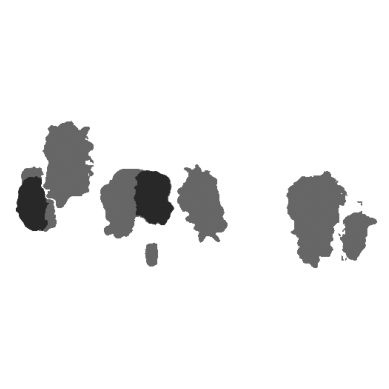


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1760).jpg: 512x512 6 grapess, 69.1ms
Speed: 1.2ms preprocess, 69.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


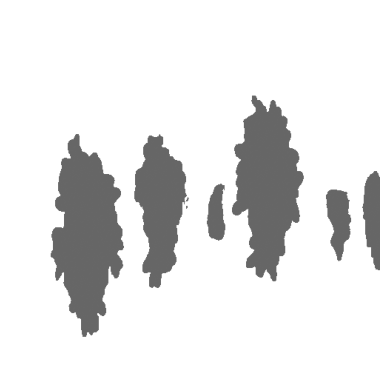


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1672).jpg: 512x512 11 grapess, 71.5ms
Speed: 1.3ms preprocess, 71.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


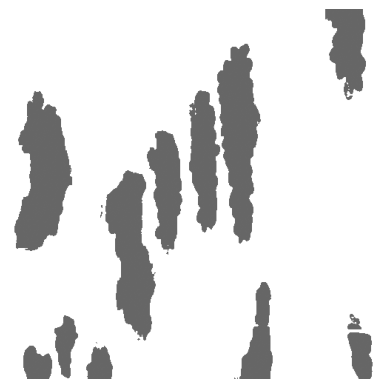


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1737).jpg: 512x512 7 grapess, 75.2ms
Speed: 1.4ms preprocess, 75.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


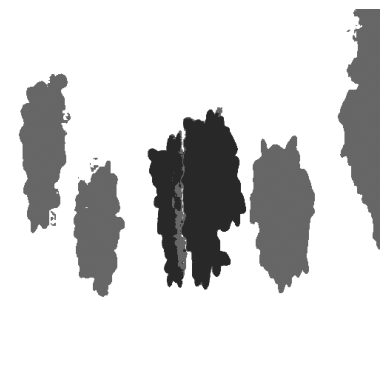


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1808).jpg: 512x512 10 grapess, 72.9ms
Speed: 1.3ms preprocess, 72.9ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


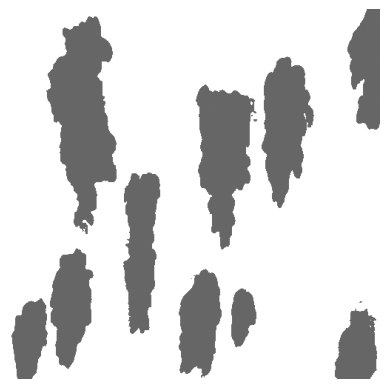


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1664).jpg: 512x512 9 grapess, 66.8ms
Speed: 1.3ms preprocess, 66.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


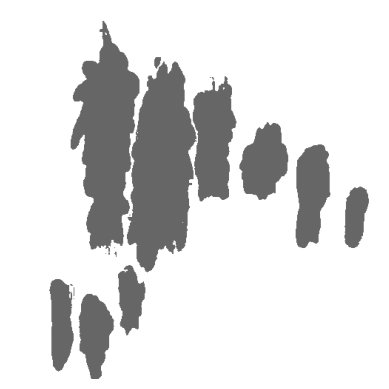


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1721).jpg: 512x512 10 grapess, 93.8ms
Speed: 1.7ms preprocess, 93.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


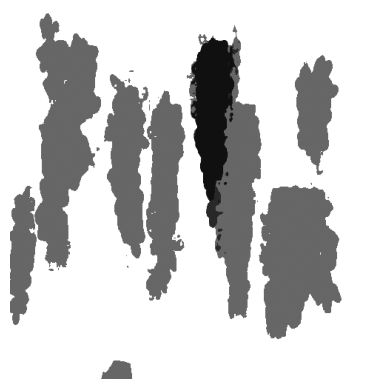


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1799).jpg: 512x512 8 grapess, 64.9ms
Speed: 1.2ms preprocess, 64.9ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


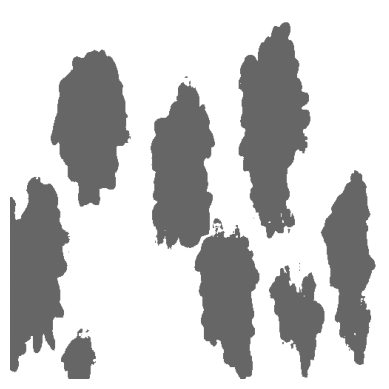


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1633).jpg: 512x512 5 grapess, 67.3ms
Speed: 1.1ms preprocess, 67.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


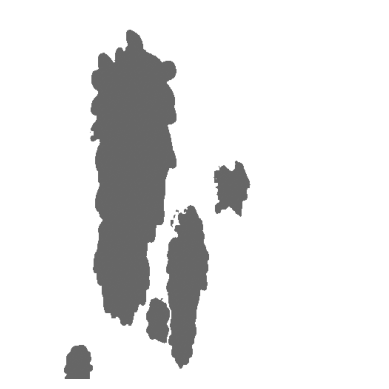


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1776).jpg: 512x512 7 grapess, 66.7ms
Speed: 1.1ms preprocess, 66.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


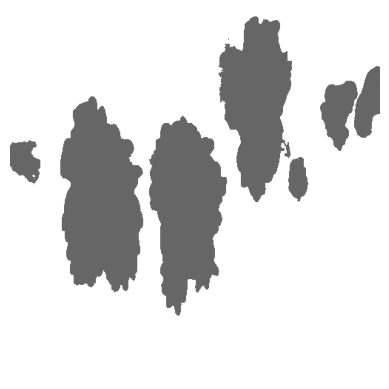


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1849).jpg: 512x512 10 grapess, 66.6ms
Speed: 1.1ms preprocess, 66.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


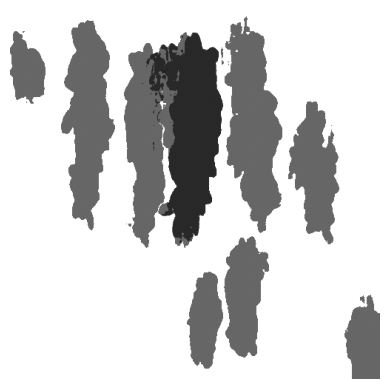


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1994).jpg: 512x512 7 grapess, 65.5ms
Speed: 1.2ms preprocess, 65.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


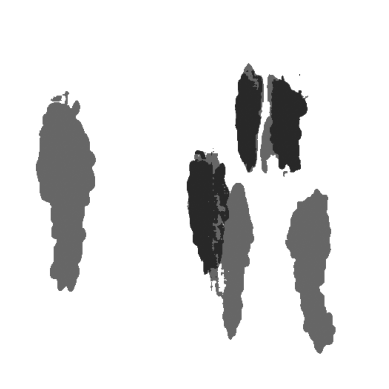


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1582).jpg: 512x512 2 grapess, 66.8ms
Speed: 1.2ms preprocess, 66.8ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


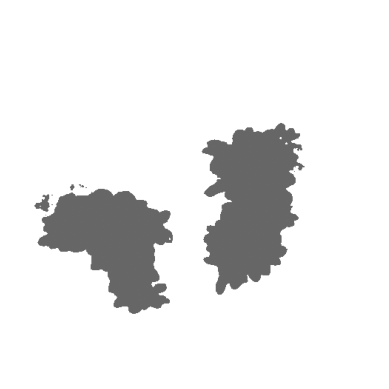


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1701).jpg: 512x512 8 grapess, 79.9ms
Speed: 1.1ms preprocess, 79.9ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


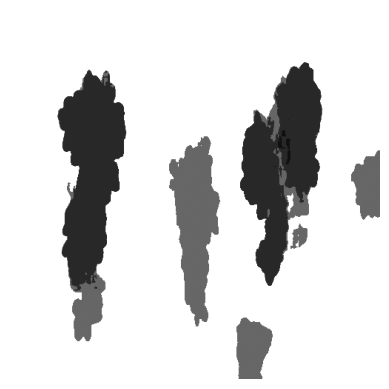


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1644).jpg: 512x512 15 grapess, 66.6ms
Speed: 1.0ms preprocess, 66.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


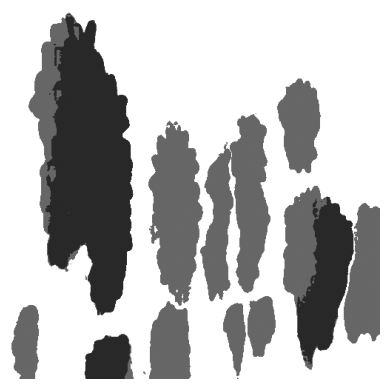


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1869).jpg: 512x512 9 grapess, 73.2ms
Speed: 1.1ms preprocess, 73.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


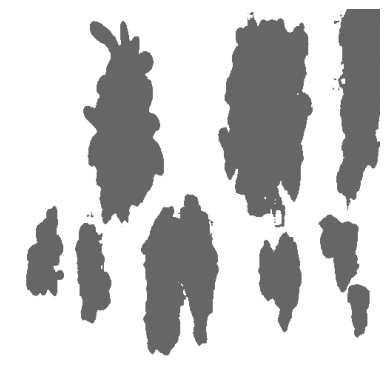


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1886).jpg: 512x512 8 grapess, 61.1ms
Speed: 1.2ms preprocess, 61.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


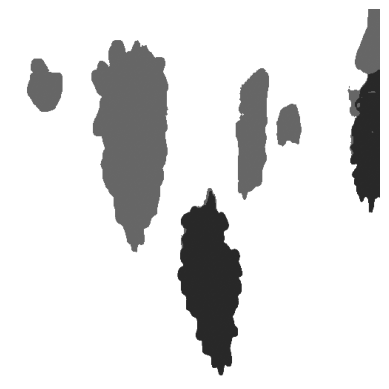


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1756).jpg: 512x512 12 grapess, 65.0ms
Speed: 1.1ms preprocess, 65.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


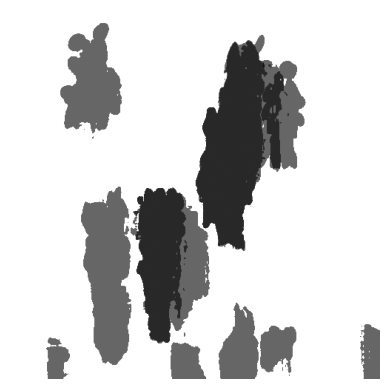


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1613).jpg: 512x512 4 grapess, 59.5ms
Speed: 1.1ms preprocess, 59.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


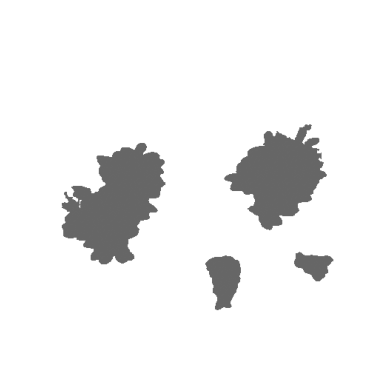


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1890).jpg: 512x512 16 grapess, 66.8ms
Speed: 1.2ms preprocess, 66.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


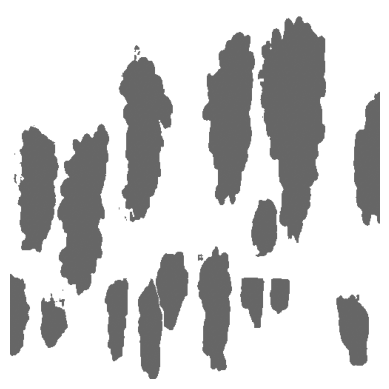


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1740).jpg: 512x512 8 grapess, 59.0ms
Speed: 1.0ms preprocess, 59.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


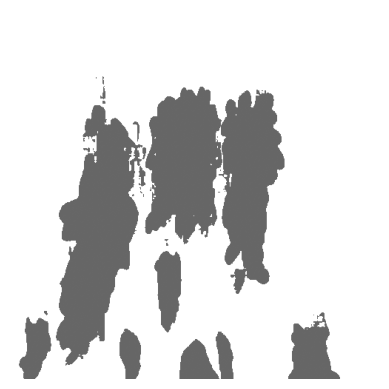


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1605).jpg: 512x512 6 grapess, 62.6ms
Speed: 1.2ms preprocess, 62.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


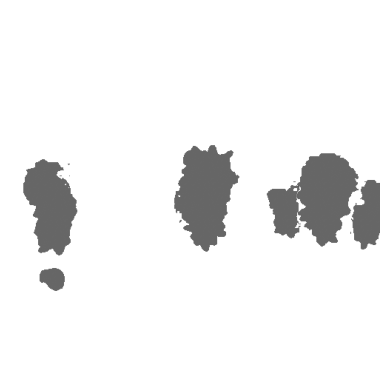


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1982).jpg: 512x512 10 grapess, 91.7ms
Speed: 1.5ms preprocess, 91.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


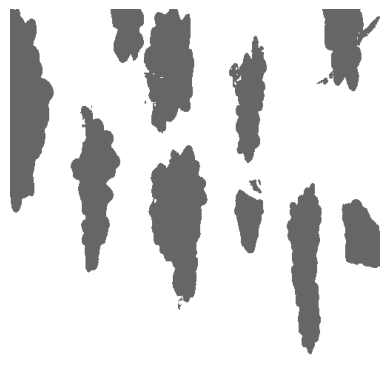


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1828).jpg: 512x512 6 grapess, 60.0ms
Speed: 1.1ms preprocess, 60.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


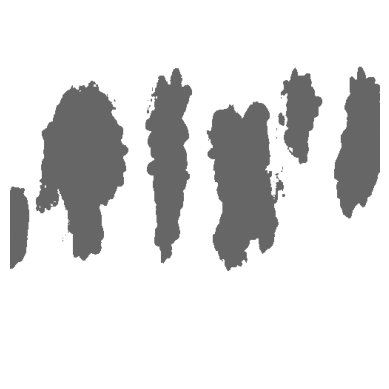


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1594).jpg: 512x512 11 grapess, 64.3ms
Speed: 1.0ms preprocess, 64.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


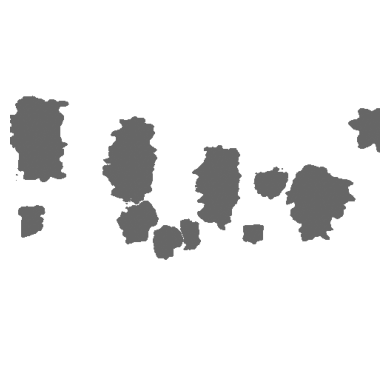


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1717).jpg: 512x512 4 grapess, 62.9ms
Speed: 1.2ms preprocess, 62.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


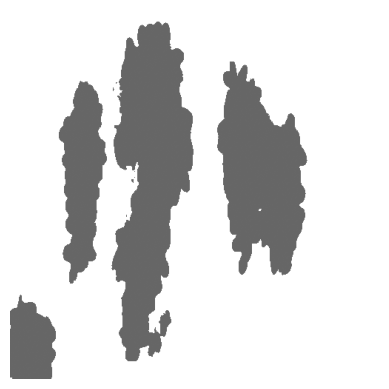


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1652).jpg: 512x512 10 grapess, 65.0ms
Speed: 1.1ms preprocess, 65.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


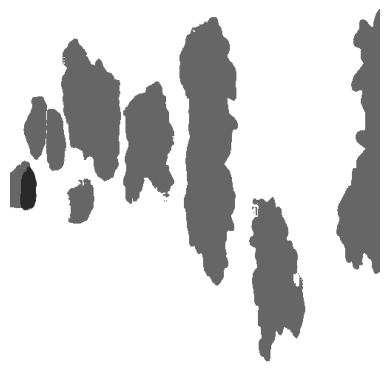


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1916).jpg: 512x512 7 grapess, 62.3ms
Speed: 1.2ms preprocess, 62.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


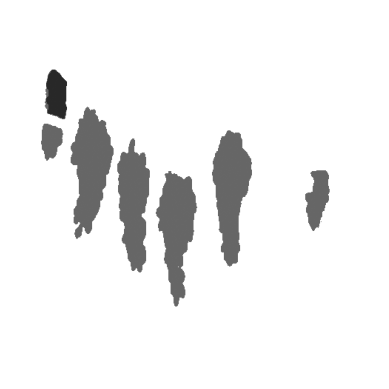


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1500).jpg: 512x512 5 grapess, 63.2ms
Speed: 1.2ms preprocess, 63.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


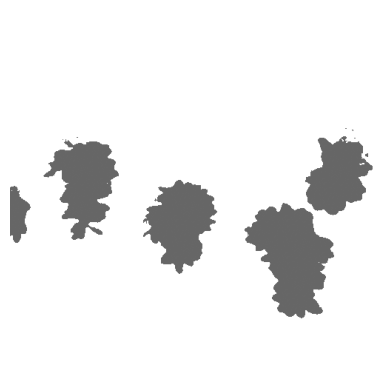


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1853).jpg: 512x512 9 grapess, 64.5ms
Speed: 1.1ms preprocess, 64.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


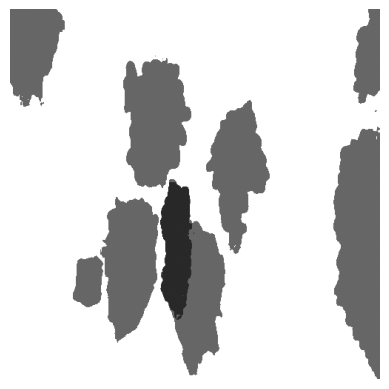


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1783).jpg: 512x512 8 grapess, 63.2ms
Speed: 1.1ms preprocess, 63.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


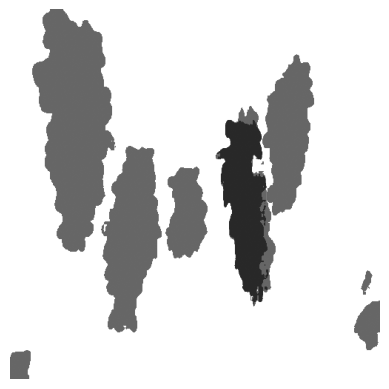


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1629).jpg: 512x512 3 grapess, 65.0ms
Speed: 1.1ms preprocess, 65.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


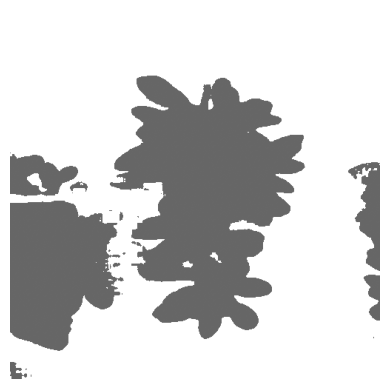


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1941).jpg: 512x512 7 grapess, 62.0ms
Speed: 1.2ms preprocess, 62.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


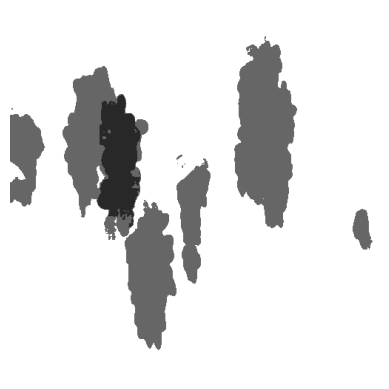


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1804).jpg: 512x512 14 grapess, 64.1ms
Speed: 1.1ms preprocess, 64.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


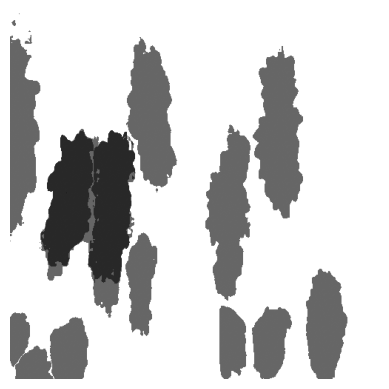


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1557).jpg: 512x512 3 grapess, 57.0ms
Speed: 1.2ms preprocess, 57.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


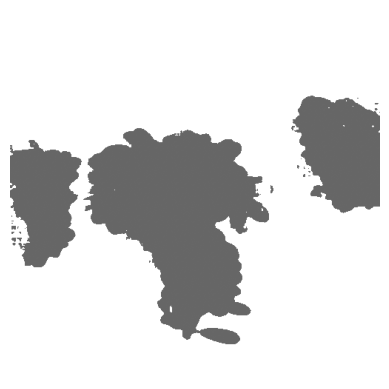


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1691).jpg: 512x512 7 grapess, 61.4ms
Speed: 1.1ms preprocess, 61.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


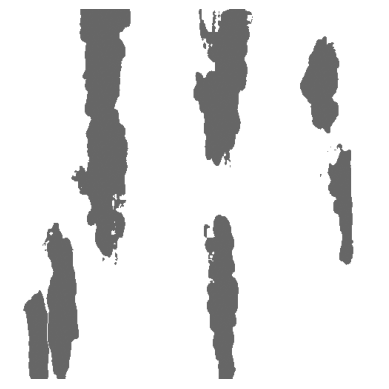


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1957).jpg: 512x512 9 grapess, 62.5ms
Speed: 1.2ms preprocess, 62.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


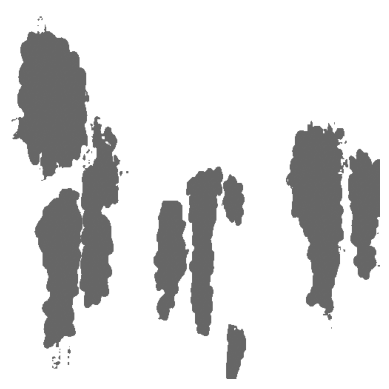


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1541).jpg: 512x512 2 grapess, 60.6ms
Speed: 1.2ms preprocess, 60.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


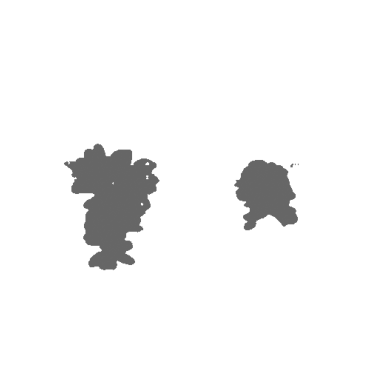


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1812).jpg: 512x512 4 grapess, 66.6ms
Speed: 1.1ms preprocess, 66.6ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


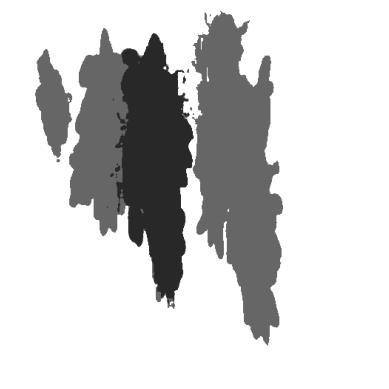


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1668).jpg: 512x512 6 grapess, 97.1ms
Speed: 1.2ms preprocess, 97.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


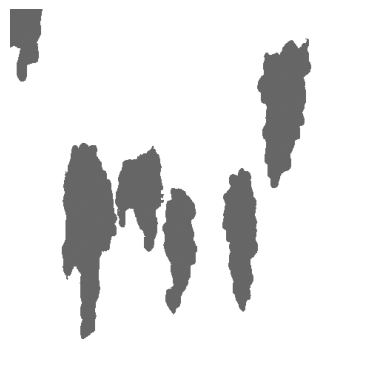


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1687).jpg: 512x512 15 grapess, 61.6ms
Speed: 1.0ms preprocess, 61.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


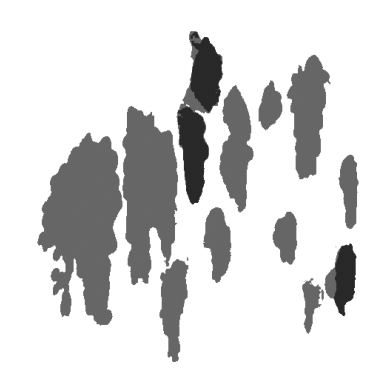


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1900).jpg: 512x512 9 grapess, 57.7ms
Speed: 1.1ms preprocess, 57.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


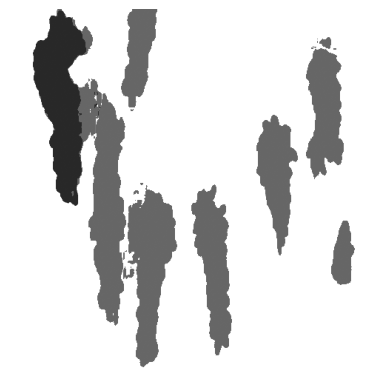


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1845).jpg: 512x512 4 grapess, 58.1ms
Speed: 1.1ms preprocess, 58.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


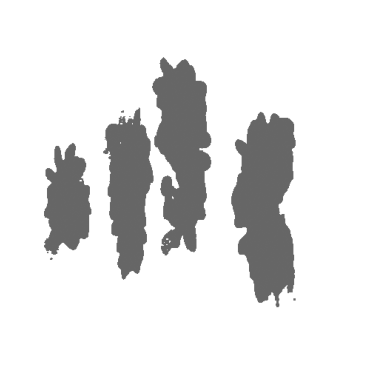


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1516).jpg: 512x512 2 grapess, 95.3ms
Speed: 1.2ms preprocess, 95.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


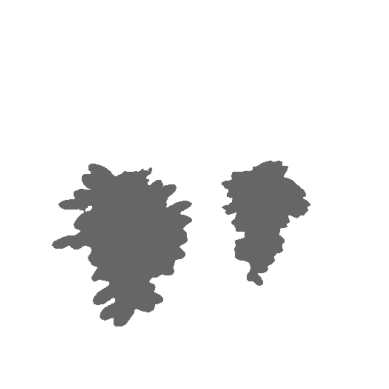


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1795).jpg: 512x512 13 grapess, 65.3ms
Speed: 1.0ms preprocess, 65.3ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


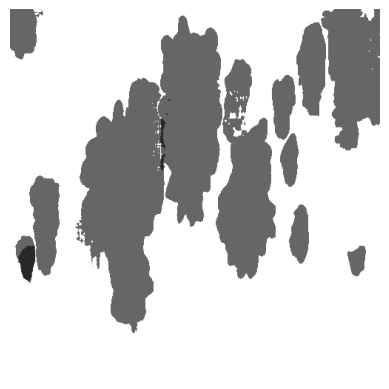


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1794).jpg: 512x512 6 grapess, 65.2ms
Speed: 1.2ms preprocess, 65.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


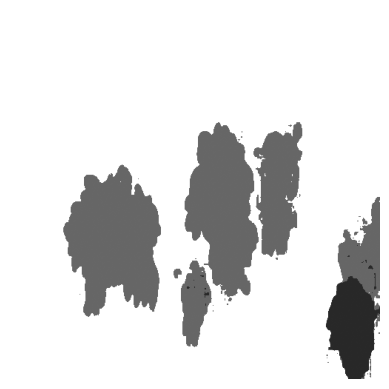


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1901).jpg: 512x512 9 grapess, 62.4ms
Speed: 1.3ms preprocess, 62.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


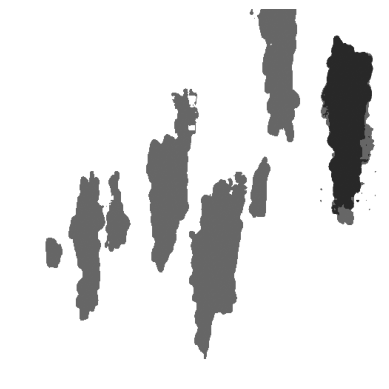


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1844).jpg: 512x512 8 grapess, 61.9ms
Speed: 1.2ms preprocess, 61.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


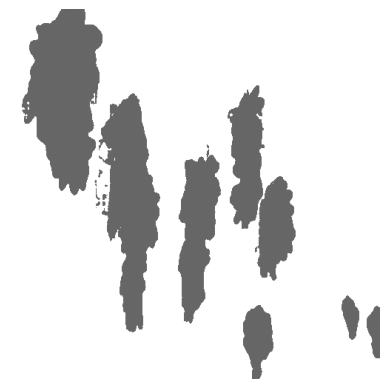


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1517).jpg: 512x512 8 grapess, 65.6ms
Speed: 1.2ms preprocess, 65.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


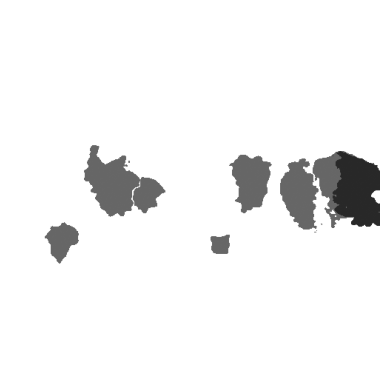


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1669).jpg: 512x512 7 grapess, 99.1ms
Speed: 1.8ms preprocess, 99.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


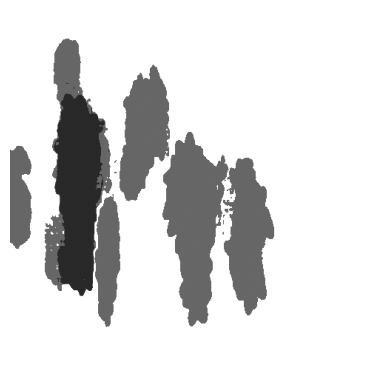


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1686).jpg: 512x512 14 grapess, 79.5ms
Speed: 1.2ms preprocess, 79.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


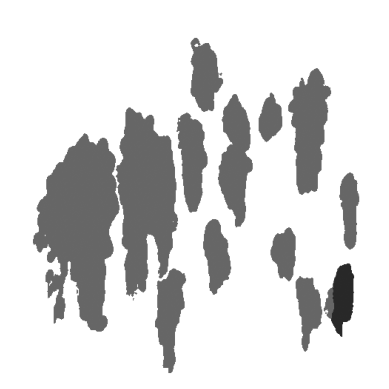


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1956).jpg: 512x512 9 grapess, 62.7ms
Speed: 1.1ms preprocess, 62.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


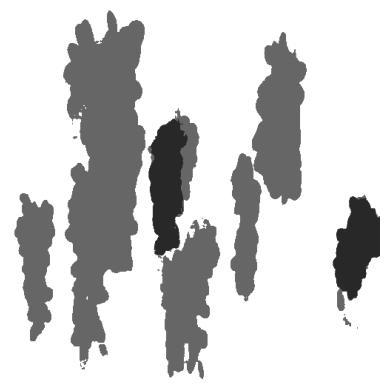


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1540).jpg: 512x512 6 grapess, 72.8ms
Speed: 1.1ms preprocess, 72.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


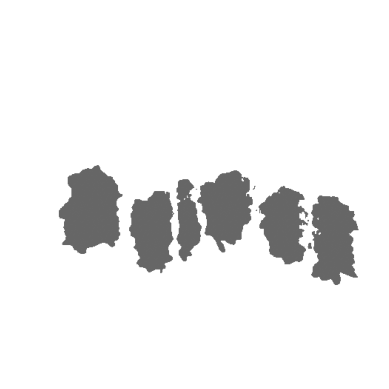


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1813).jpg: 512x512 7 grapess, 72.2ms
Speed: 1.1ms preprocess, 72.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


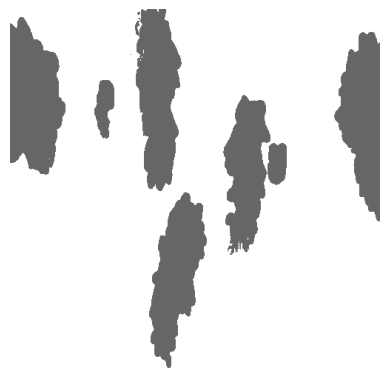


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1690).jpg: 512x512 7 grapess, 80.9ms
Speed: 1.5ms preprocess, 80.9ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


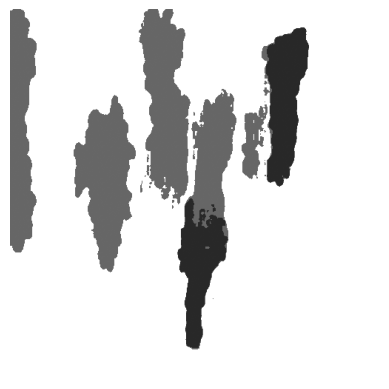


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1940).jpg: 512x512 12 grapess, 155.3ms
Speed: 1.0ms preprocess, 155.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


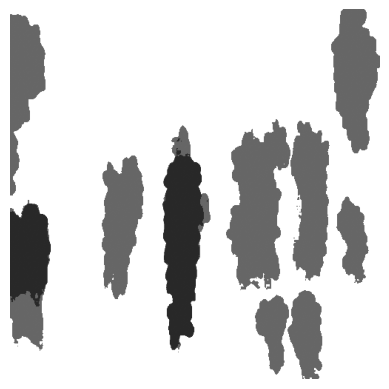


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1805).jpg: 512x512 5 grapess, 55.9ms
Speed: 1.1ms preprocess, 55.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


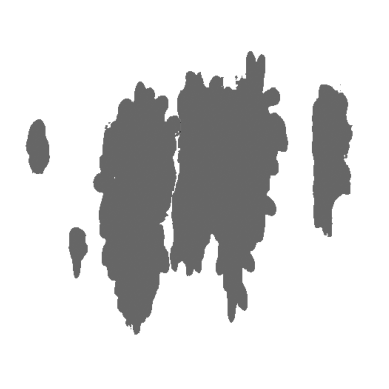


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1556).jpg: 512x512 3 grapess, 59.4ms
Speed: 1.2ms preprocess, 59.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


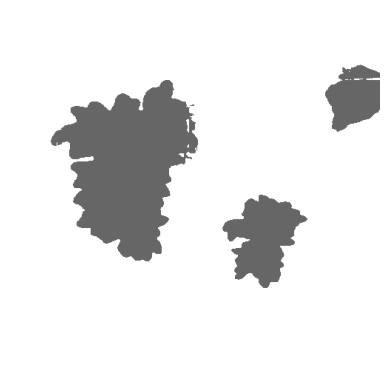


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1782).jpg: 512x512 8 grapess, 59.6ms
Speed: 1.0ms preprocess, 59.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


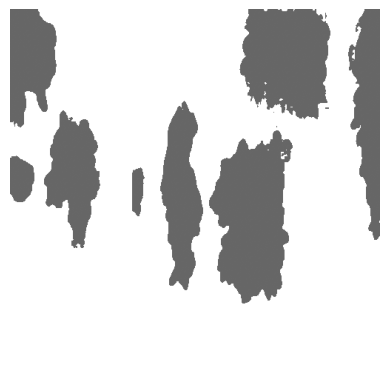


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1628).jpg: 512x512 6 grapess, 59.3ms
Speed: 1.1ms preprocess, 59.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


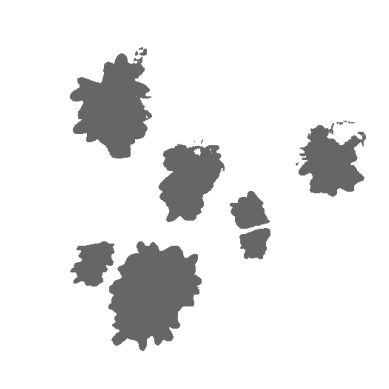


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1917).jpg: 512x512 8 grapess, 57.9ms
Speed: 1.2ms preprocess, 57.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


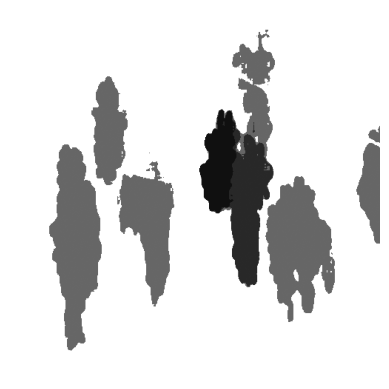


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1501).jpg: 512x512 5 grapess, 58.9ms
Speed: 1.3ms preprocess, 58.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


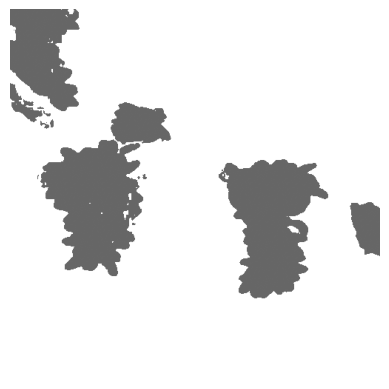


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1852).jpg: 512x512 13 grapess, 59.6ms
Speed: 1.2ms preprocess, 59.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


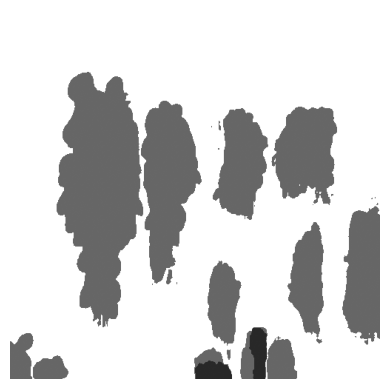


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1716).jpg: 512x512 6 grapess, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


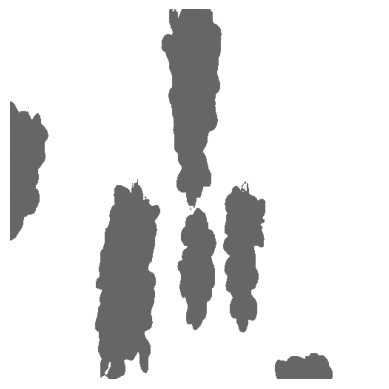


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1653).jpg: 512x512 13 grapess, 75.2ms
Speed: 1.3ms preprocess, 75.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


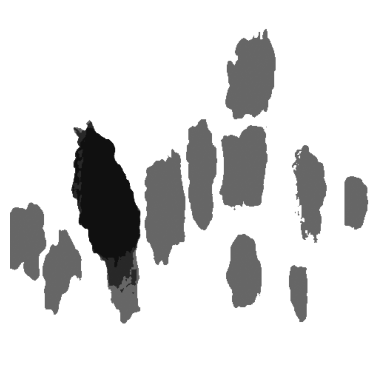


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1983).jpg: 512x512 11 grapess, 75.1ms
Speed: 1.2ms preprocess, 75.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


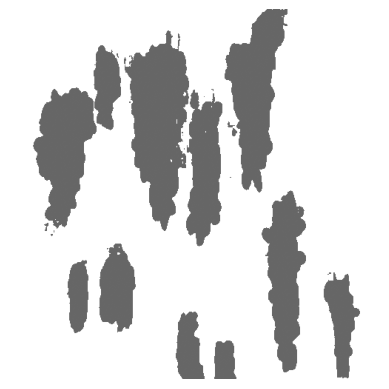


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1829).jpg: 512x512 12 grapess, 63.2ms
Speed: 1.1ms preprocess, 63.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


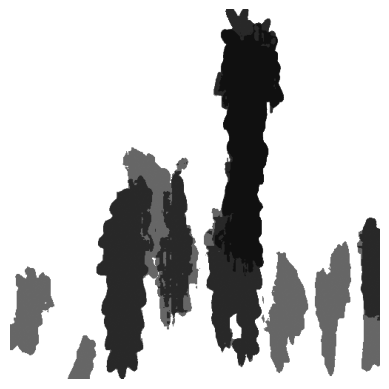


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1595).jpg: 512x512 3 grapess, 61.3ms
Speed: 1.1ms preprocess, 61.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


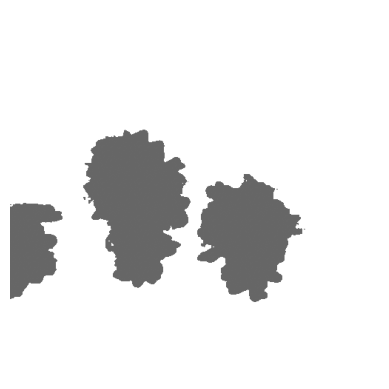


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1741).jpg: 512x512 12 grapess, 69.7ms
Speed: 1.4ms preprocess, 69.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


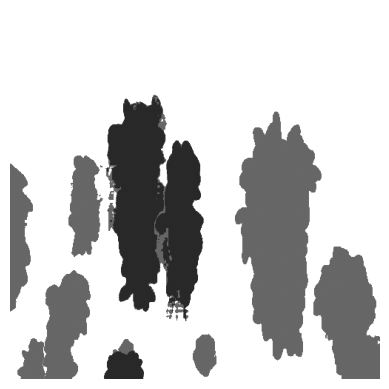


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1604).jpg: 512x512 4 grapess, 76.4ms
Speed: 1.3ms preprocess, 76.4ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


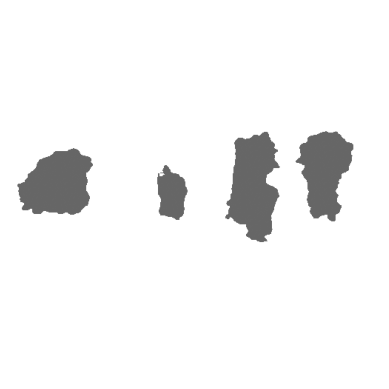


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1891).jpg: 512x512 17 grapess, 59.0ms
Speed: 1.2ms preprocess, 59.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


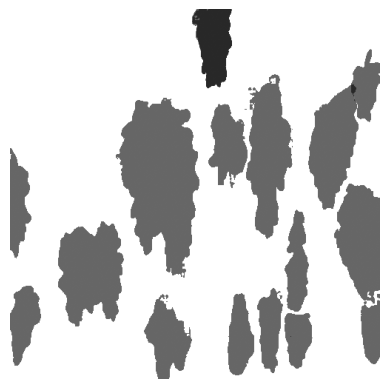


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1757).jpg: 512x512 7 grapess, 55.9ms
Speed: 1.0ms preprocess, 55.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


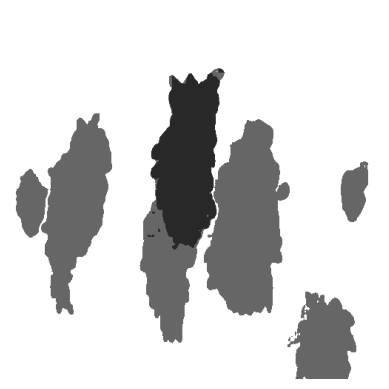


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1612).jpg: 512x512 8 grapess, 64.6ms
Speed: 1.3ms preprocess, 64.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


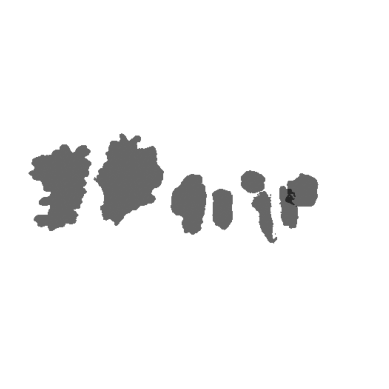


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1868).jpg: 512x512 6 grapess, 67.4ms
Speed: 1.2ms preprocess, 67.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


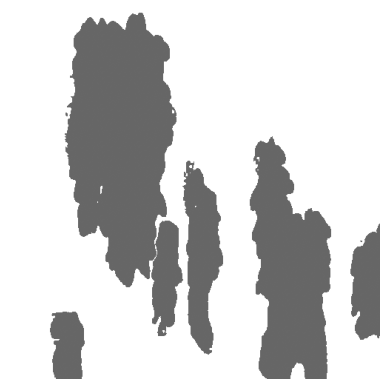


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1887).jpg: 512x512 7 grapess, 63.8ms
Speed: 1.2ms preprocess, 63.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


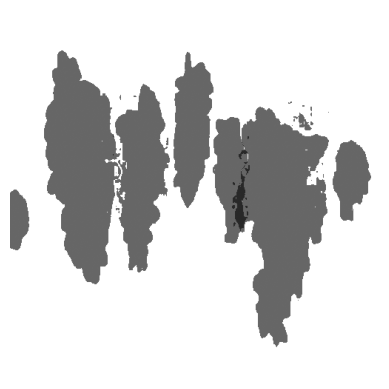


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1700).jpg: 512x512 4 grapess, 64.6ms
Speed: 1.1ms preprocess, 64.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


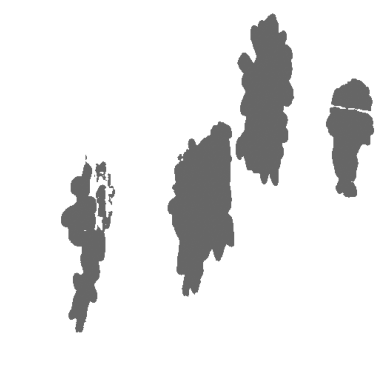


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1645).jpg: 512x512 15 grapess, 65.1ms
Speed: 1.2ms preprocess, 65.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


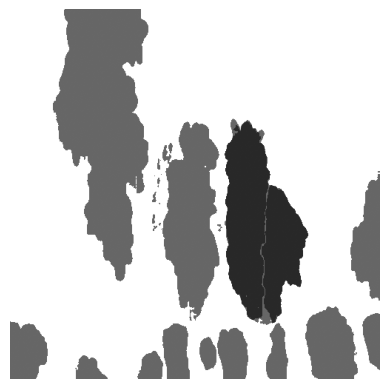


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1995).jpg: 512x512 10 grapess, 60.1ms
Speed: 1.1ms preprocess, 60.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


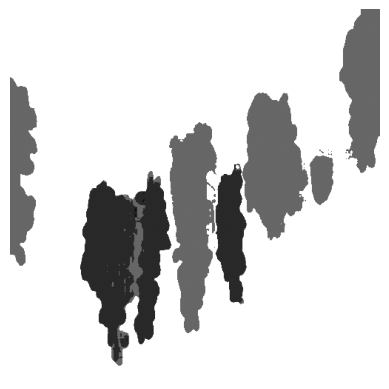


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1583).jpg: 512x512 6 grapess, 60.0ms
Speed: 1.1ms preprocess, 60.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


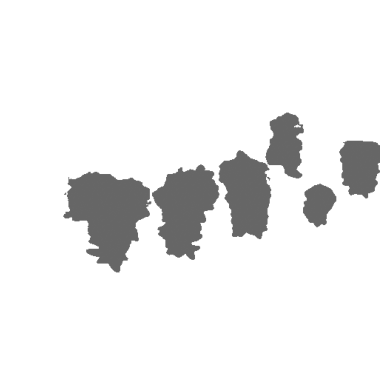


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1848).jpg: 512x512 7 grapess, 64.2ms
Speed: 1.2ms preprocess, 64.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


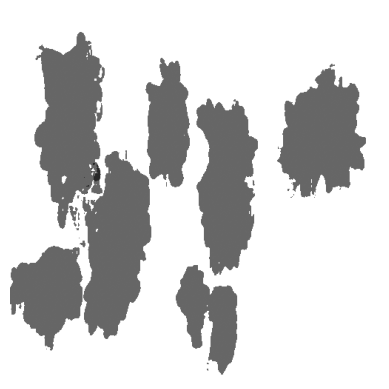


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1798).jpg: 512x512 6 grapess, 68.3ms
Speed: 1.1ms preprocess, 68.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


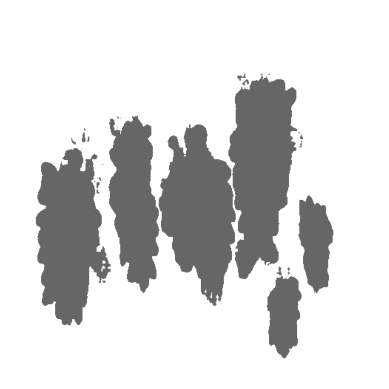


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1632).jpg: 512x512 7 grapess, 85.2ms
Speed: 1.2ms preprocess, 85.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


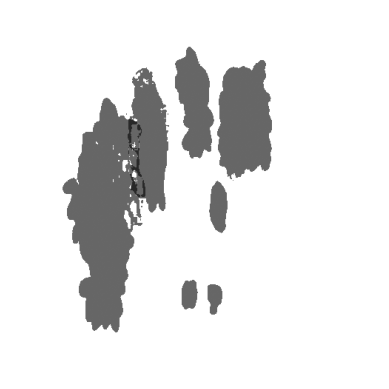


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1777).jpg: 512x512 7 grapess, 79.5ms
Speed: 1.2ms preprocess, 79.5ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


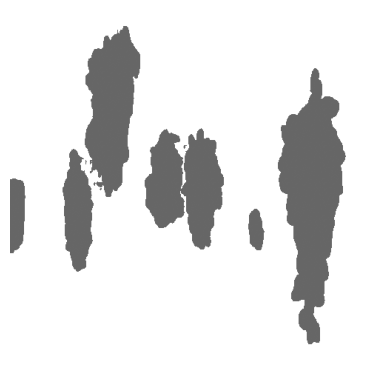


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1665).jpg: 512x512 16 grapess, 62.3ms
Speed: 1.0ms preprocess, 62.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


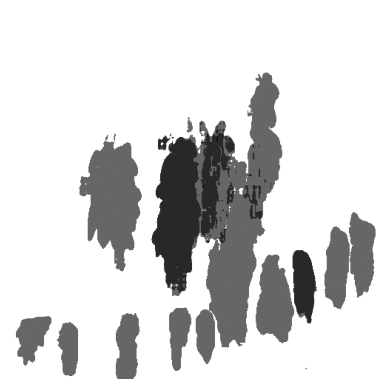


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1720).jpg: 512x512 5 grapess, 72.1ms
Speed: 1.1ms preprocess, 72.1ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


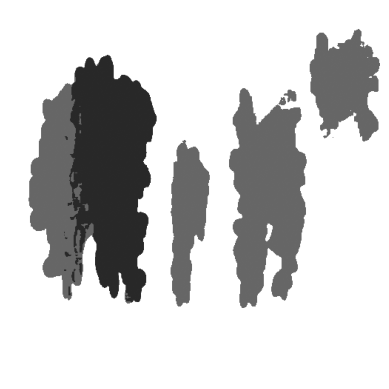


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1809).jpg: 512x512 12 grapess, 70.4ms
Speed: 1.1ms preprocess, 70.4ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


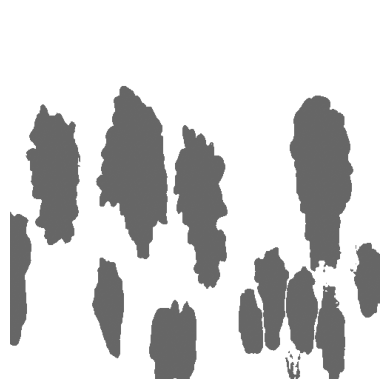


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1673).jpg: 512x512 12 grapess, 77.8ms
Speed: 1.3ms preprocess, 77.8ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


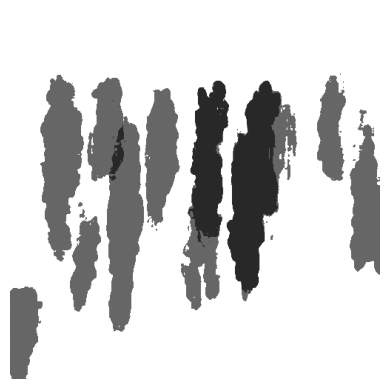


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1736).jpg: 512x512 11 grapess, 60.2ms
Speed: 1.2ms preprocess, 60.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


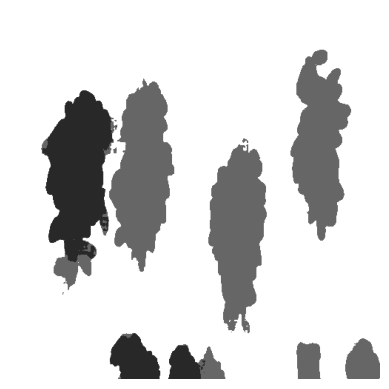


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1624).jpg: 512x512 2 grapess, 61.0ms
Speed: 1.1ms preprocess, 61.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


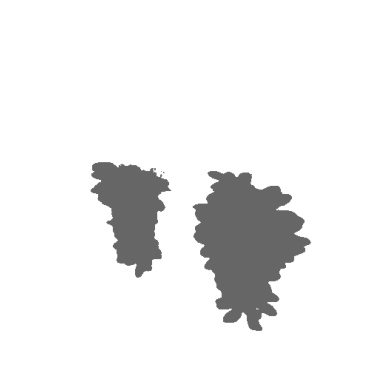


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1761).jpg: 512x512 6 grapess, 66.3ms
Speed: 1.1ms preprocess, 66.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


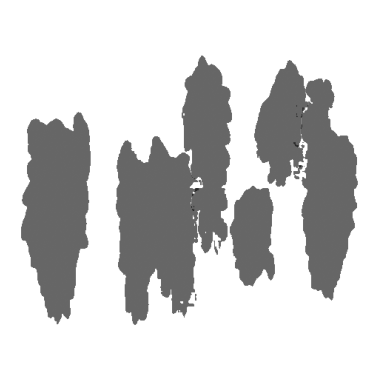


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1825).jpg: 512x512 6 grapess, 63.1ms
Speed: 1.2ms preprocess, 63.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


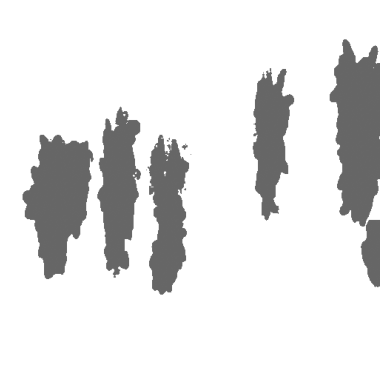


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1576).jpg: 512x512 4 grapess, 73.3ms
Speed: 1.1ms preprocess, 73.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


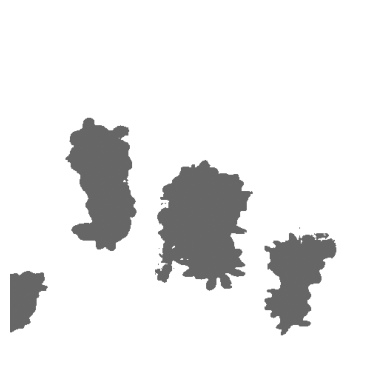


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1599).jpg: 512x512 5 grapess, 67.3ms
Speed: 1.1ms preprocess, 67.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


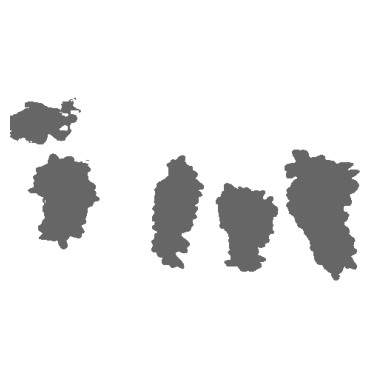


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1960).jpg: 512x512 8 grapess, 82.4ms
Speed: 1.2ms preprocess, 82.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


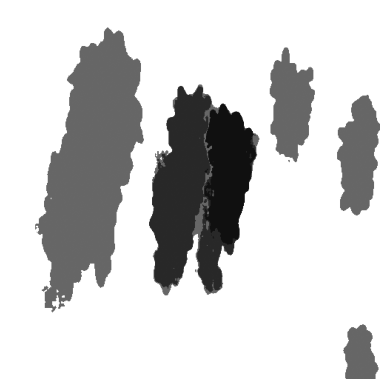


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1521).jpg: 512x512 8 grapess, 71.4ms
Speed: 1.1ms preprocess, 71.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


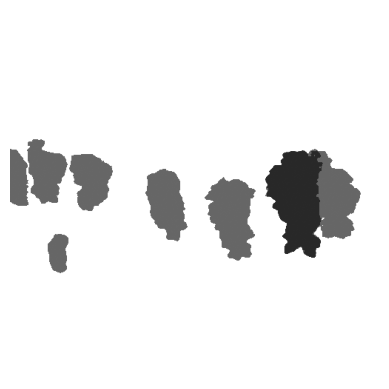


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1872).jpg: 512x512 15 grapess, 79.3ms
Speed: 1.1ms preprocess, 79.3ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


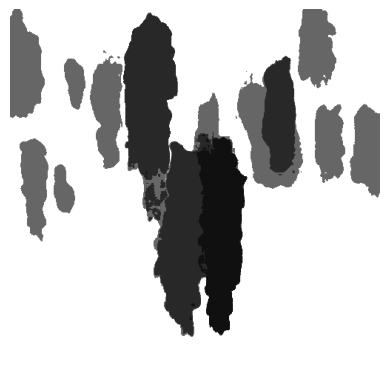


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1937).jpg: 512x512 8 grapess, 61.1ms
Speed: 1.1ms preprocess, 61.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


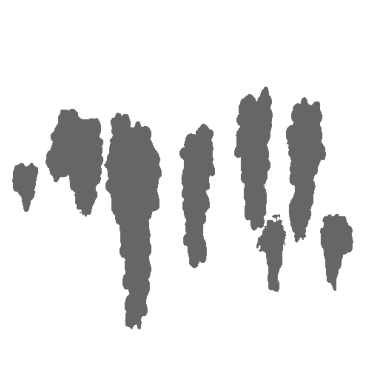


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1608).jpg: 512x512 7 grapess, 81.4ms
Speed: 1.3ms preprocess, 81.4ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


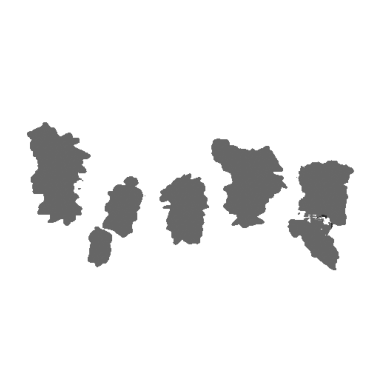


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1864).jpg: 512x512 9 grapess, 62.0ms
Speed: 1.1ms preprocess, 62.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


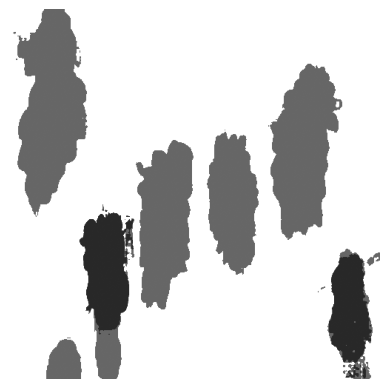


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1537).jpg: 512x512 4 grapess, 59.8ms
Speed: 1.2ms preprocess, 59.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


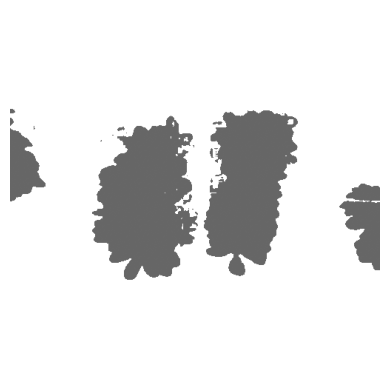


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1921).jpg: 512x512 7 grapess, 62.7ms
Speed: 1.1ms preprocess, 62.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


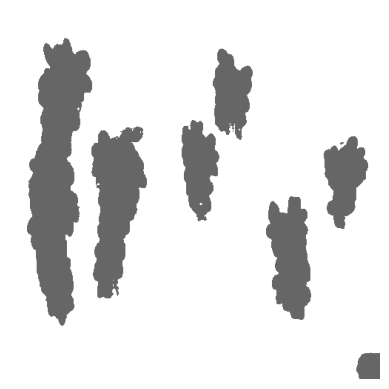


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1560).jpg: 512x512 6 grapess, 64.1ms
Speed: 1.1ms preprocess, 64.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


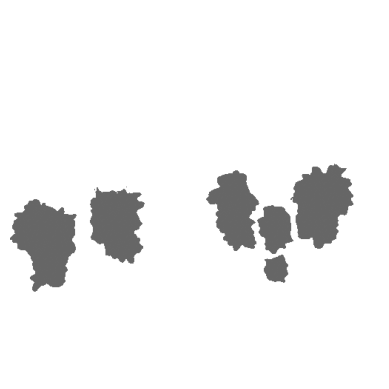


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1999).jpg: 512x512 9 grapess, 78.9ms
Speed: 1.2ms preprocess, 78.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


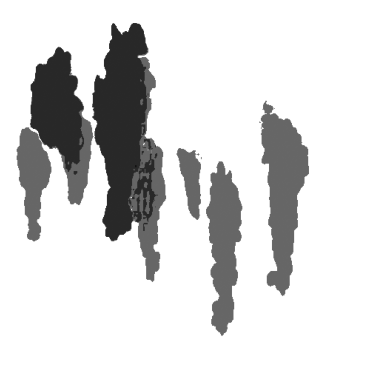


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1833).jpg: 512x512 9 grapess, 64.5ms
Speed: 1.2ms preprocess, 64.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


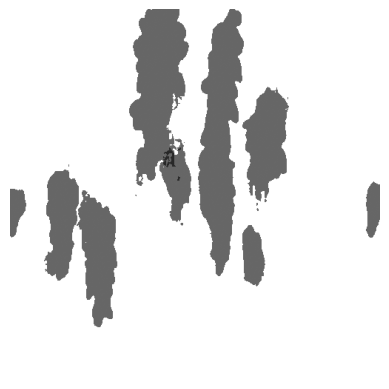


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1976).jpg: 512x512 11 grapess, 62.2ms
Speed: 1.2ms preprocess, 62.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


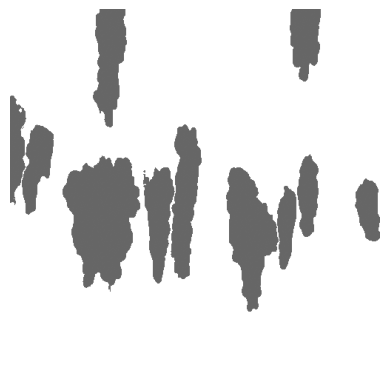


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1649).jpg: 512x512 7 grapess, 66.2ms
Speed: 1.2ms preprocess, 66.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


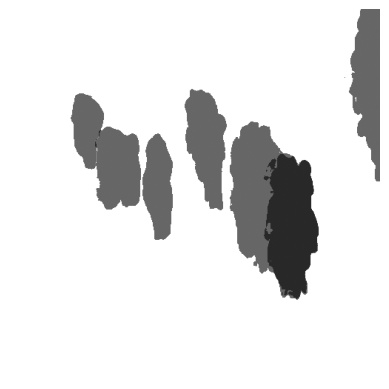


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1518).jpg: 512x512 6 grapess, 63.5ms
Speed: 1.2ms preprocess, 63.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


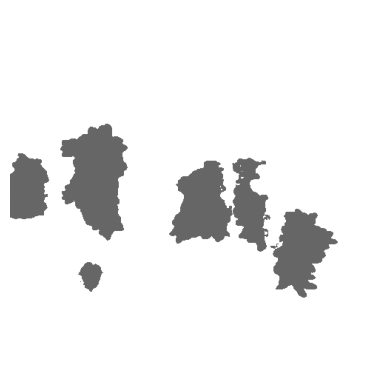


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1774).jpg: 512x512 11 grapess, 63.5ms
Speed: 1.1ms preprocess, 63.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


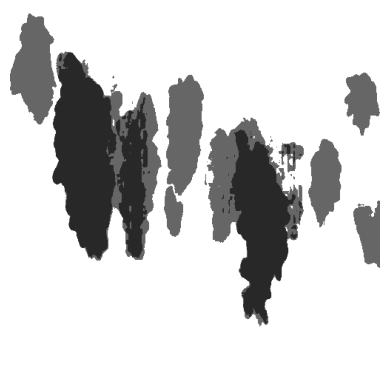


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1631).jpg: 512x512 7 grapess, 60.6ms
Speed: 1.1ms preprocess, 60.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


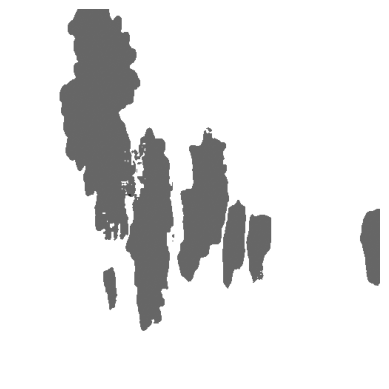


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1959).jpg: 512x512 7 grapess, 67.3ms
Speed: 1.3ms preprocess, 67.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


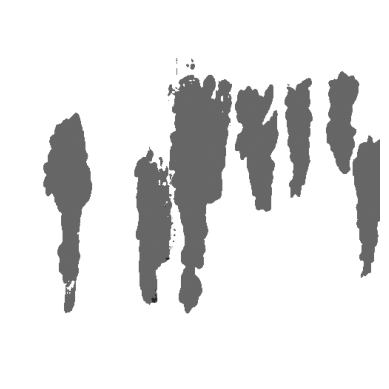


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1723).jpg: 512x512 11 grapess, 66.5ms
Speed: 1.1ms preprocess, 66.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


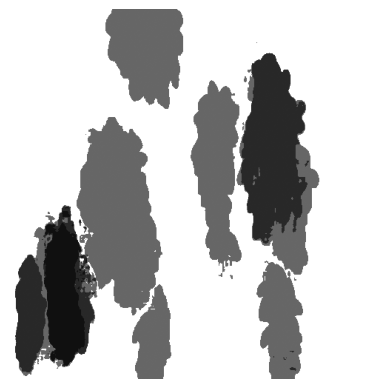


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1689).jpg: 512x512 5 grapess, 58.1ms
Speed: 1.1ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


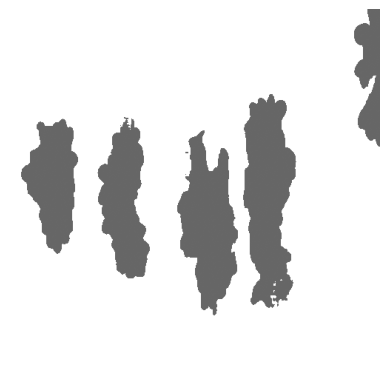


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1666).jpg: 512x512 8 grapess, 63.6ms
Speed: 1.2ms preprocess, 63.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


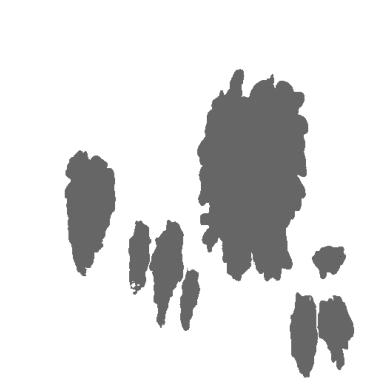


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1559).jpg: 512x512 2 grapess, 61.8ms
Speed: 1.2ms preprocess, 61.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


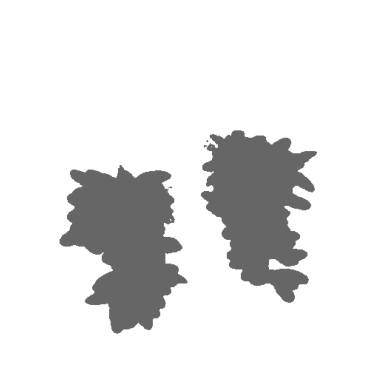


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1735).jpg: 512x512 7 grapess, 80.5ms
Speed: 1.4ms preprocess, 80.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


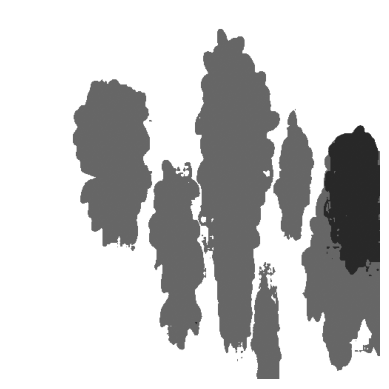


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1670).jpg: 512x512 10 grapess, 91.7ms
Speed: 2.1ms preprocess, 91.7ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


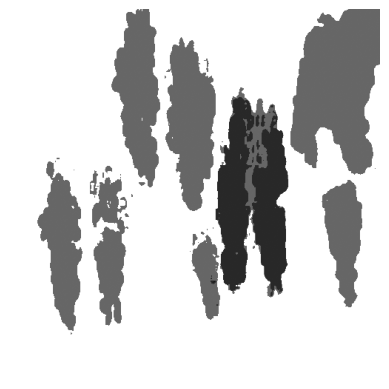


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1918).jpg: 512x512 9 grapess, 105.4ms
Speed: 1.2ms preprocess, 105.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


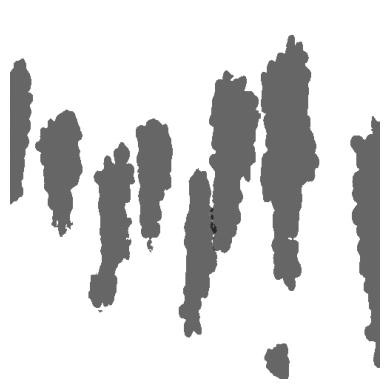


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1762).jpg: 512x512 8 grapess, 84.8ms
Speed: 1.4ms preprocess, 84.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


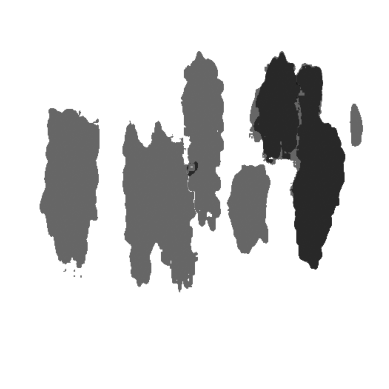


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1627).jpg: 512x512 11 grapess, 84.3ms
Speed: 1.4ms preprocess, 84.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


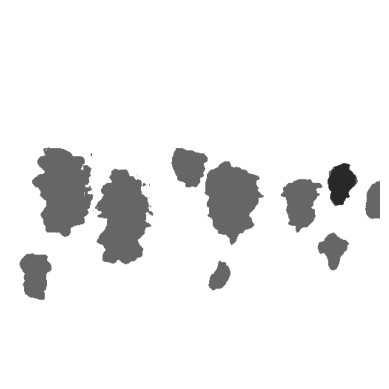


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1963).jpg: 512x512 7 grapess, 71.4ms
Speed: 1.8ms preprocess, 71.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


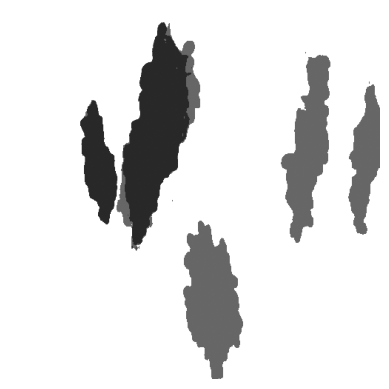


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1575).jpg: 512x512 5 grapess, 89.5ms
Speed: 1.5ms preprocess, 89.5ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


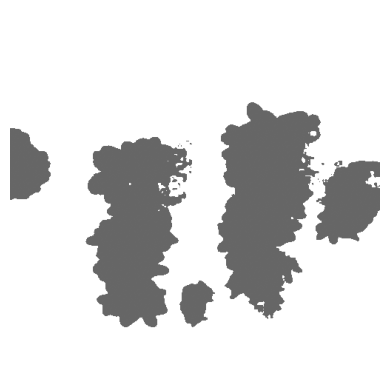


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1826).jpg: 512x512 5 grapess, 70.9ms
Speed: 1.5ms preprocess, 70.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


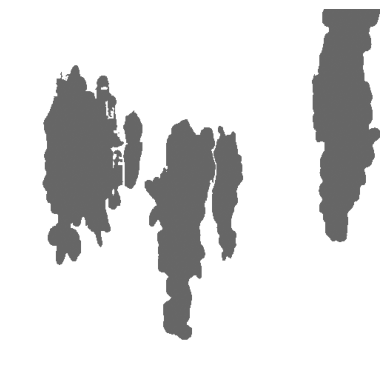


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1719).jpg: 512x512 6 grapess, 87.0ms
Speed: 1.4ms preprocess, 87.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


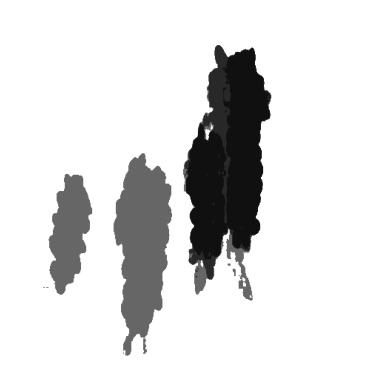


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1934).jpg: 512x512 17 grapess, 75.9ms
Speed: 1.2ms preprocess, 75.9ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


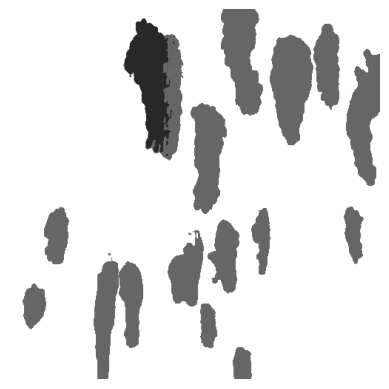


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1871).jpg: 512x512 6 grapess, 66.9ms
Speed: 1.2ms preprocess, 66.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


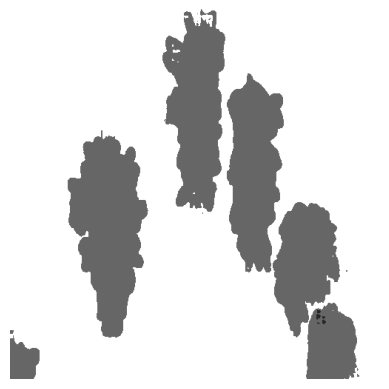


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1522).jpg: 512x512 3 grapess, 71.4ms
Speed: 1.1ms preprocess, 71.4ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


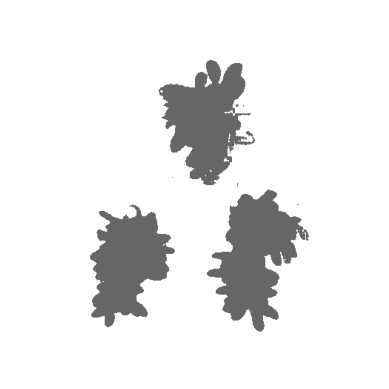


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1922).jpg: 512x512 6 grapess, 75.5ms
Speed: 1.3ms preprocess, 75.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


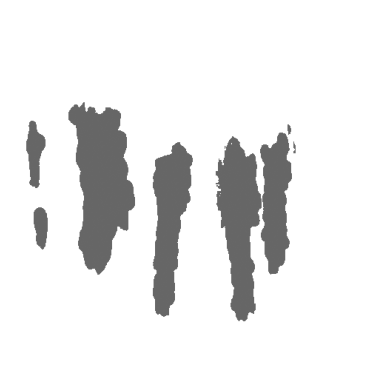


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1888).jpg: 512x512 11 grapess, 78.9ms
Speed: 1.3ms preprocess, 78.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


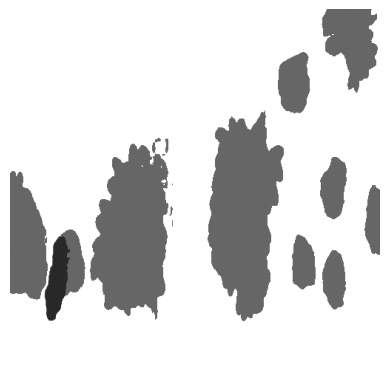


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1534).jpg: 512x512 4 grapess, 73.2ms
Speed: 1.5ms preprocess, 73.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


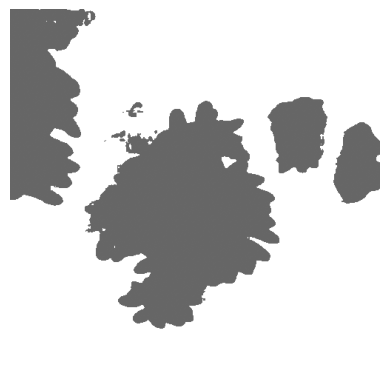


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1867).jpg: 512x512 3 grapess, 66.3ms
Speed: 1.3ms preprocess, 66.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


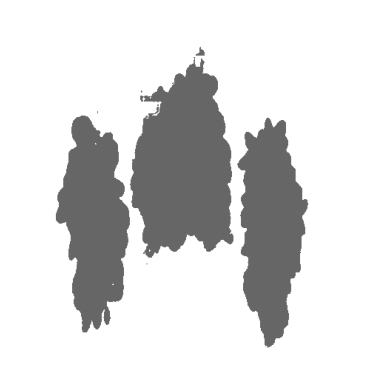


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1758).jpg: 512x512 10 grapess, 71.7ms
Speed: 1.3ms preprocess, 71.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


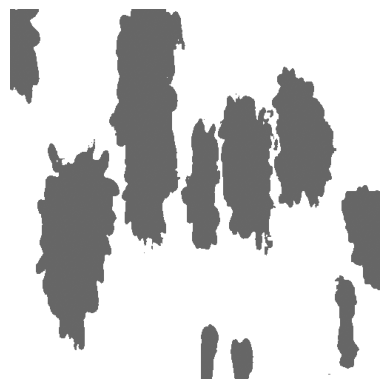


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1975).jpg: 512x512 19 grapess, 65.0ms
Speed: 1.3ms preprocess, 65.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


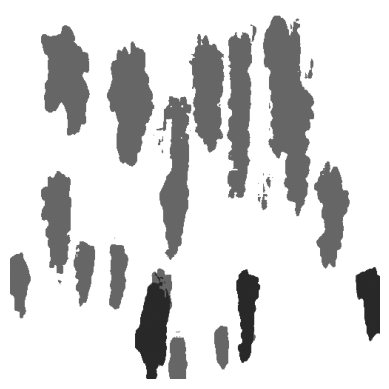


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1830).jpg: 512x512 8 grapess, 64.1ms
Speed: 1.1ms preprocess, 64.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


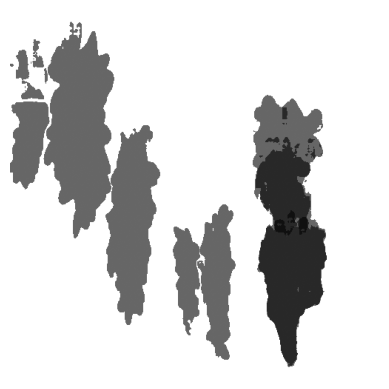


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1563).jpg: 512x512 3 grapess, 63.2ms
Speed: 1.2ms preprocess, 63.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


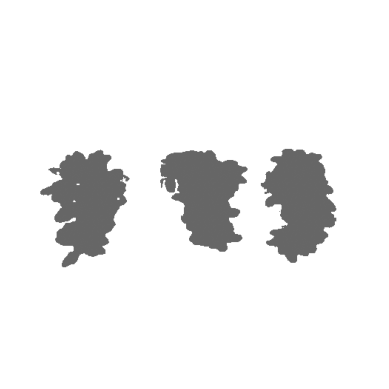


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1778).jpg: 512x512 12 grapess, 64.6ms
Speed: 1.1ms preprocess, 64.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


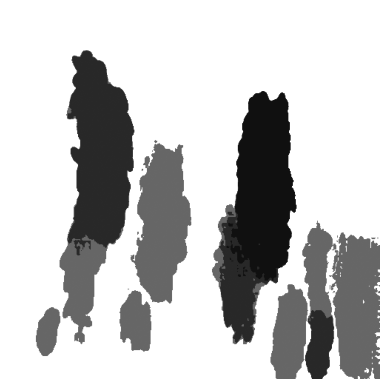


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1797).jpg: 512x512 16 grapess, 62.1ms
Speed: 1.2ms preprocess, 62.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


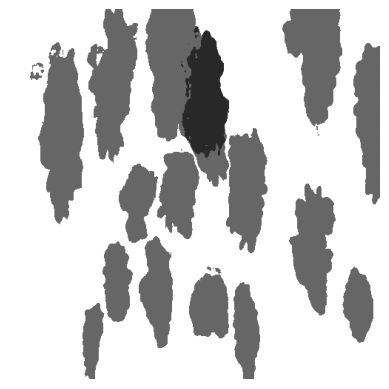


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1514).jpg: 512x512 12 grapess, 61.7ms
Speed: 1.3ms preprocess, 61.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


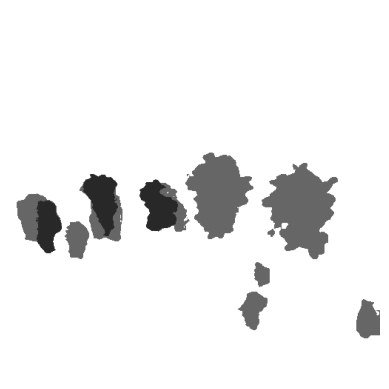


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1847).jpg: 512x512 5 grapess, 67.3ms
Speed: 1.3ms preprocess, 67.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


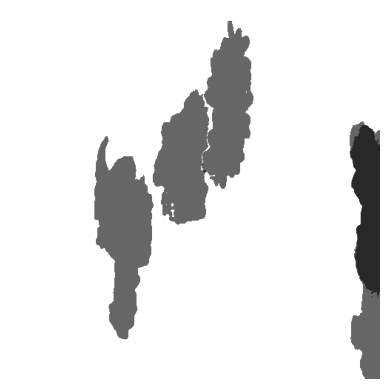


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1902).jpg: 512x512 10 grapess, 64.0ms
Speed: 1.2ms preprocess, 64.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


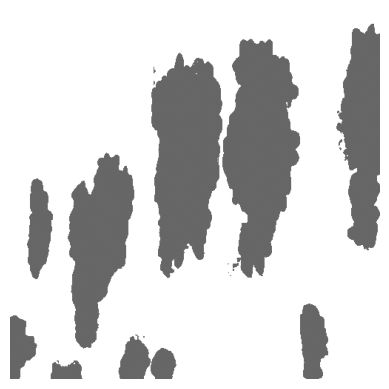


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1685).jpg: 512x512 9 grapess, 65.5ms
Speed: 1.1ms preprocess, 65.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


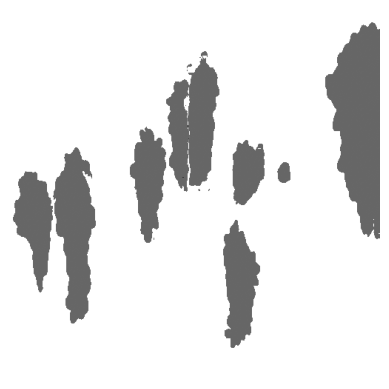


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1810).jpg: 512x512 5 grapess, 67.8ms
Speed: 1.3ms preprocess, 67.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


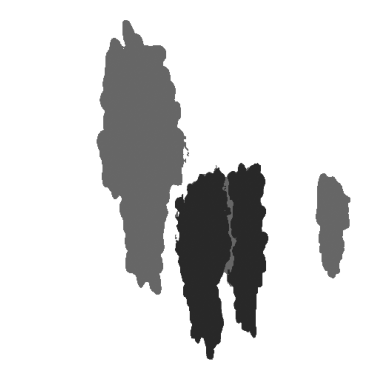


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1543).jpg: 512x512 6 grapess, 63.1ms
Speed: 1.2ms preprocess, 63.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


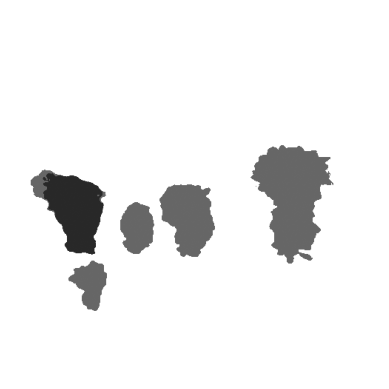


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1955).jpg: 512x512 9 grapess, 67.9ms
Speed: 1.2ms preprocess, 67.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


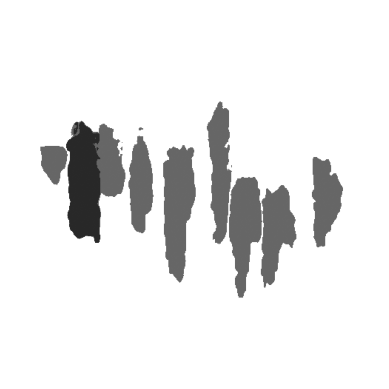


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1739).jpg: 512x512 9 grapess, 66.2ms
Speed: 1.3ms preprocess, 66.2ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


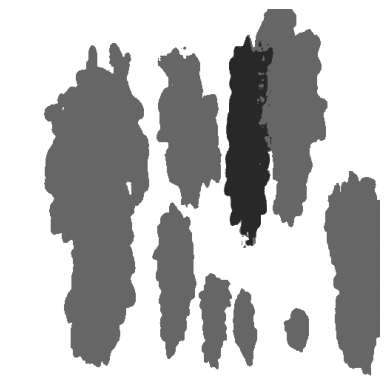


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1693).jpg: 512x512 7 grapess, 62.1ms
Speed: 1.1ms preprocess, 62.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


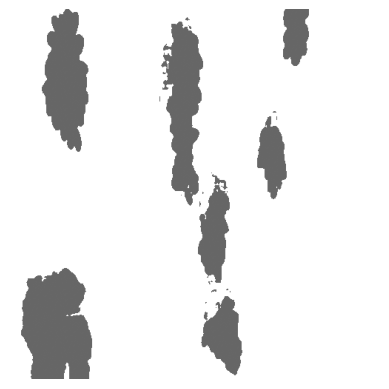


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1555).jpg: 512x512 3 grapess, 65.0ms
Speed: 1.1ms preprocess, 65.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


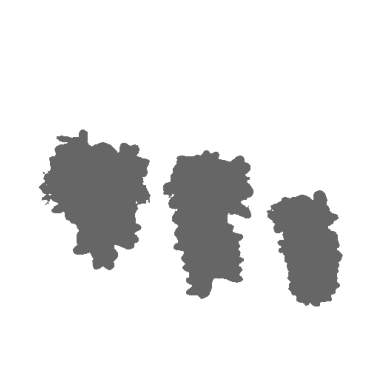


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1806).jpg: 512x512 5 grapess, 64.9ms
Speed: 1.1ms preprocess, 64.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


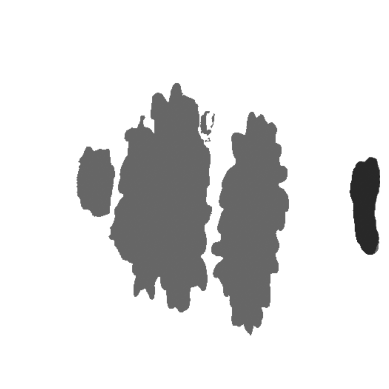


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1943).jpg: 512x512 13 grapess, 65.2ms
Speed: 1.1ms preprocess, 65.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


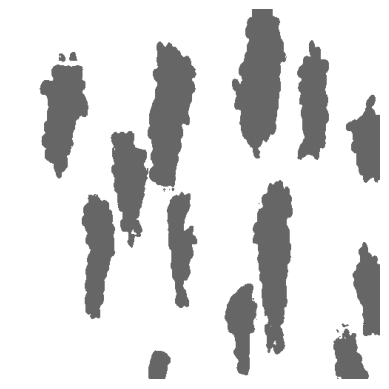


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1781).jpg: 512x512 15 grapess, 65.3ms
Speed: 1.1ms preprocess, 65.3ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


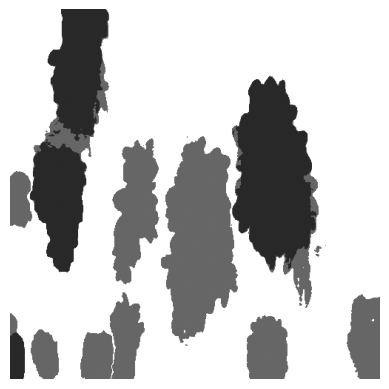


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1851).jpg: 512x512 10 grapess, 61.9ms
Speed: 1.2ms preprocess, 61.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


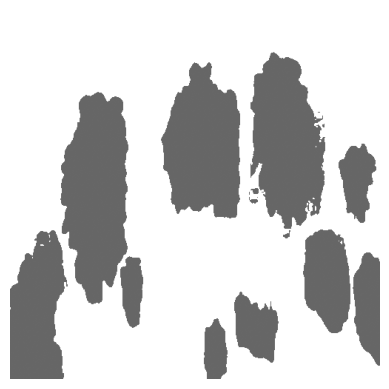


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1502).jpg: 512x512 4 grapess, 63.2ms
Speed: 1.0ms preprocess, 63.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


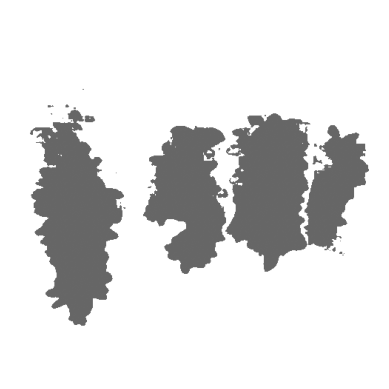


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1914).jpg: 512x512 5 grapess, 65.9ms
Speed: 1.1ms preprocess, 65.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


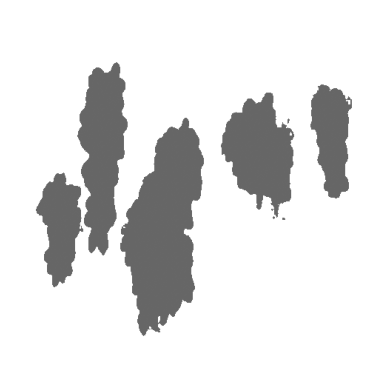


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1650).jpg: 512x512 8 grapess, 64.0ms
Speed: 1.1ms preprocess, 64.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


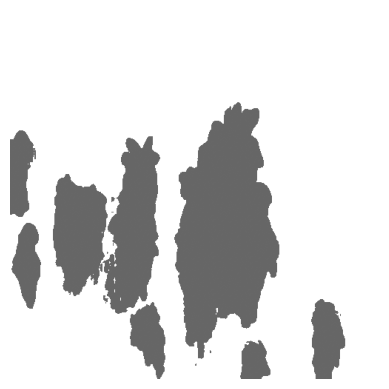


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1715).jpg: 512x512 10 grapess, 65.3ms
Speed: 1.1ms preprocess, 65.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


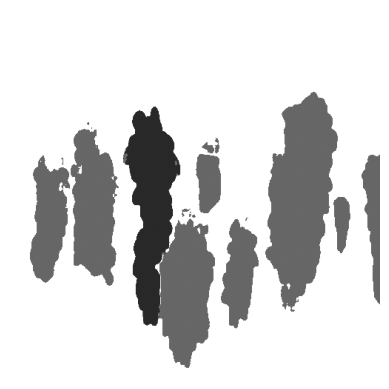


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1596).jpg: 512x512 3 grapess, 127.0ms
Speed: 2.2ms preprocess, 127.0ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


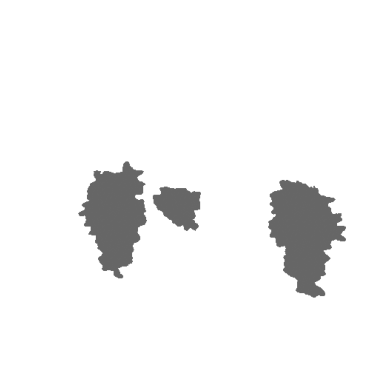


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1980).jpg: 512x512 7 grapess, 65.6ms
Speed: 1.1ms preprocess, 65.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


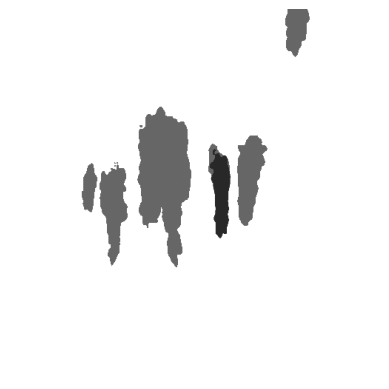


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1579).jpg: 512x512 4 grapess, 64.4ms
Speed: 1.1ms preprocess, 64.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


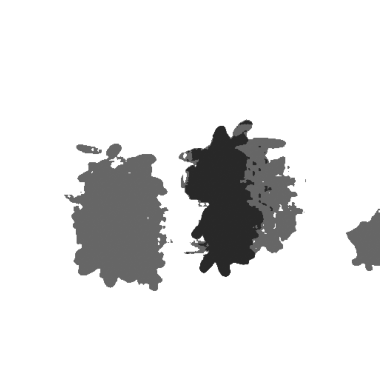


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1607).jpg: 512x512 10 grapess, 64.0ms
Speed: 1.3ms preprocess, 64.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


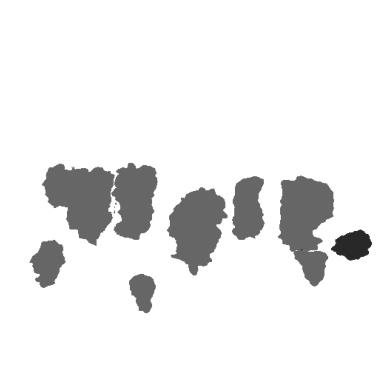


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1742).jpg: 512x512 6 grapess, 59.1ms
Speed: 1.1ms preprocess, 59.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


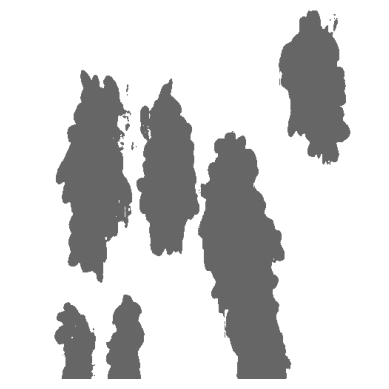


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1938).jpg: 512x512 8 grapess, 62.2ms
Speed: 1.1ms preprocess, 62.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


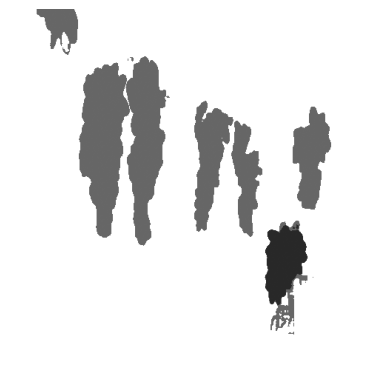


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1892).jpg: 512x512 9 grapess, 82.3ms
Speed: 1.3ms preprocess, 82.3ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


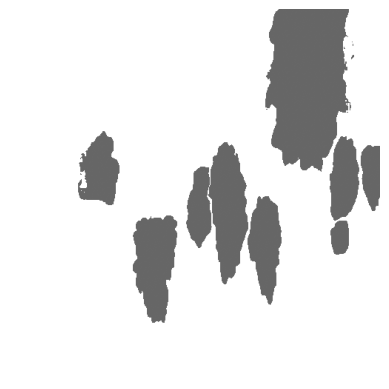


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1611).jpg: 512x512 5 grapess, 60.1ms
Speed: 1.0ms preprocess, 60.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


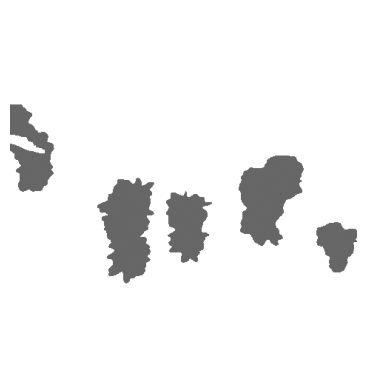


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1754).jpg: 512x512 15 grapess, 66.6ms
Speed: 1.3ms preprocess, 66.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


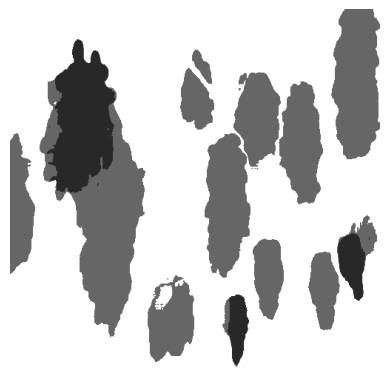


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1884).jpg: 512x512 11 grapess, 60.9ms
Speed: 1.1ms preprocess, 60.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


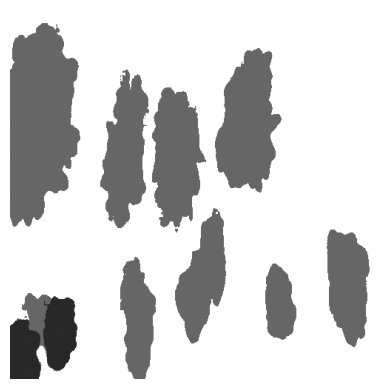


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1538).jpg: 512x512 5 grapess, 61.2ms
Speed: 1.2ms preprocess, 61.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


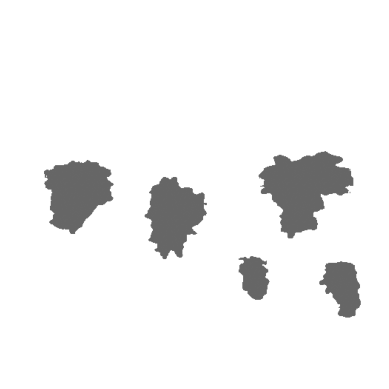


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1646).jpg: 512x512 15 grapess, 62.5ms
Speed: 1.4ms preprocess, 62.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


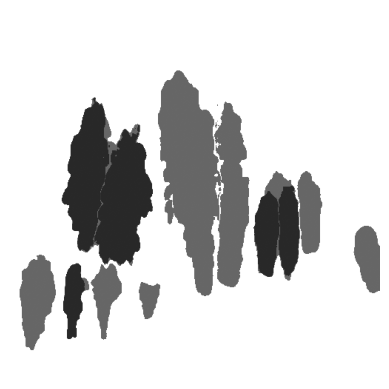


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1703).jpg: 512x512 5 grapess, 64.9ms
Speed: 1.1ms preprocess, 64.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


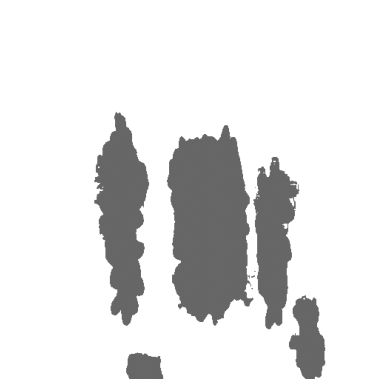


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1979).jpg: 512x512 7 grapess, 62.2ms
Speed: 1.1ms preprocess, 62.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


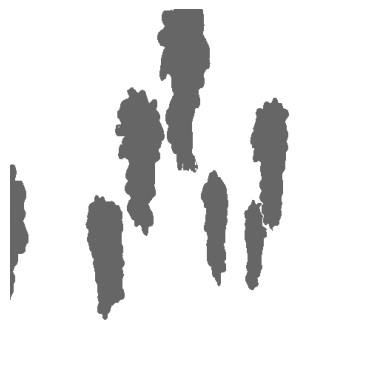


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1580).jpg: 512x512 2 grapess, 62.7ms
Speed: 1.2ms preprocess, 62.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


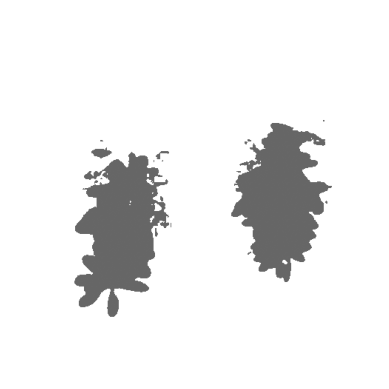


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1996).jpg: 512x512 9 grapess, 76.5ms
Speed: 1.1ms preprocess, 76.5ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


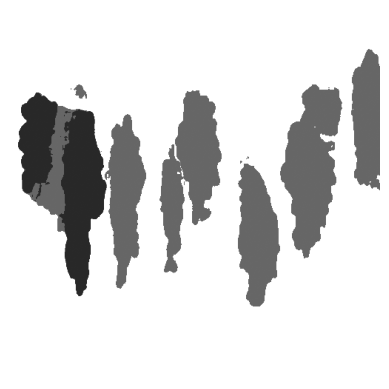


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1978).jpg: 512x512 12 grapess, 62.6ms
Speed: 1.3ms preprocess, 62.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


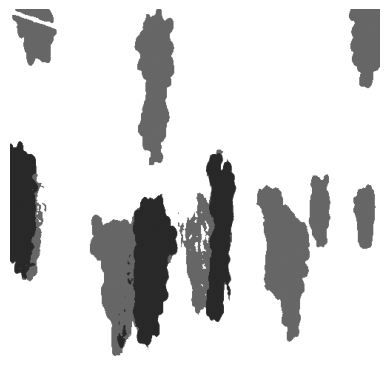


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1581).jpg: 512x512 5 grapess, 68.4ms
Speed: 1.1ms preprocess, 68.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


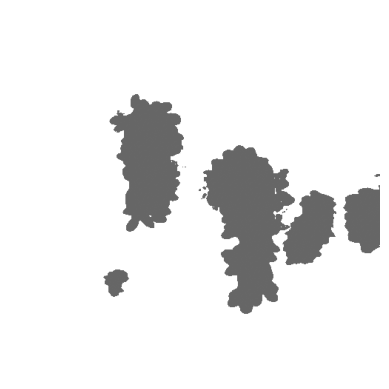


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1997).jpg: 512x512 4 grapess, 78.9ms
Speed: 1.1ms preprocess, 78.9ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


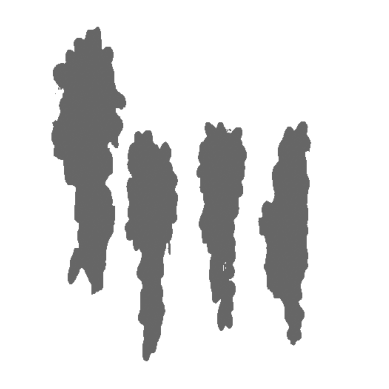


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1647).jpg: 512x512 9 grapess, 64.4ms
Speed: 1.2ms preprocess, 64.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


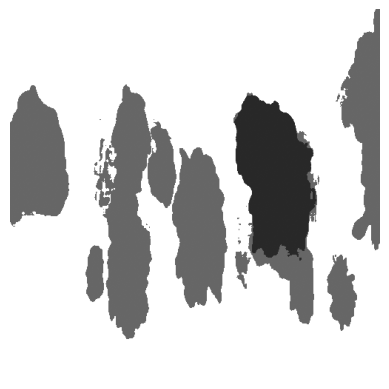


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1702).jpg: 512x512 5 grapess, 61.3ms
Speed: 1.0ms preprocess, 61.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


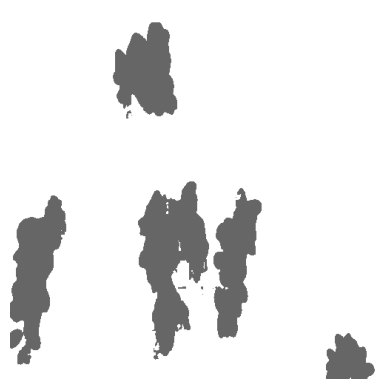


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1885).jpg: 512x512 9 grapess, 64.3ms
Speed: 1.1ms preprocess, 64.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


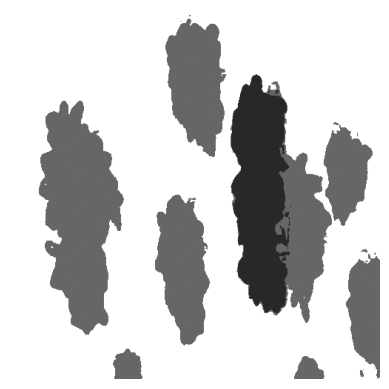


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1539).jpg: 512x512 7 grapess, 62.8ms
Speed: 1.2ms preprocess, 62.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


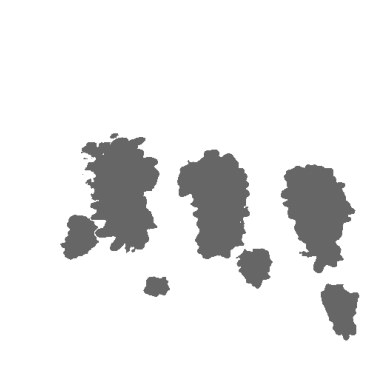


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1610).jpg: 512x512 6 grapess, 61.8ms
Speed: 1.2ms preprocess, 61.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


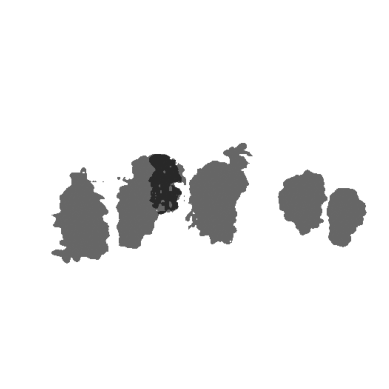


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1755).jpg: 512x512 5 grapess, 65.4ms
Speed: 1.2ms preprocess, 65.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


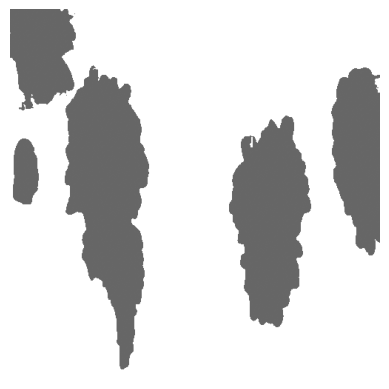


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1939).jpg: 512x512 10 grapess, 64.3ms
Speed: 1.3ms preprocess, 64.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


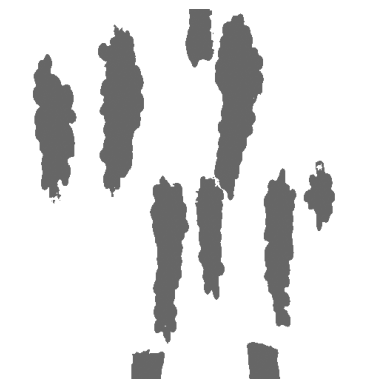


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1893).jpg: 512x512 4 grapess, 69.5ms
Speed: 1.1ms preprocess, 69.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


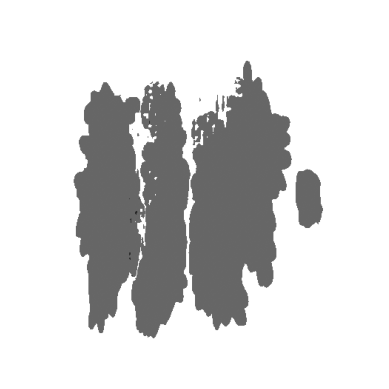


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1606).jpg: 512x512 6 grapess, 99.7ms
Speed: 1.2ms preprocess, 99.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


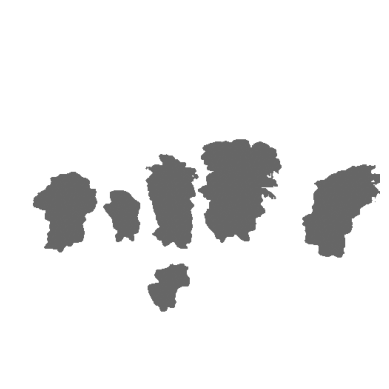


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1743).jpg: 512x512 12 grapess, 63.4ms
Speed: 1.1ms preprocess, 63.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


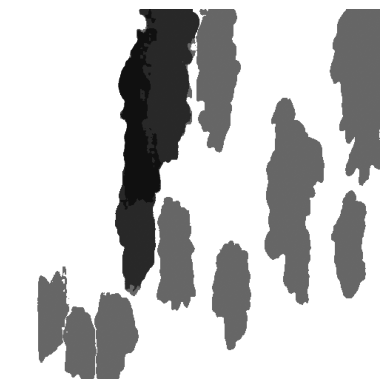


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1597).jpg: 512x512 6 grapess, 78.3ms
Speed: 1.1ms preprocess, 78.3ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


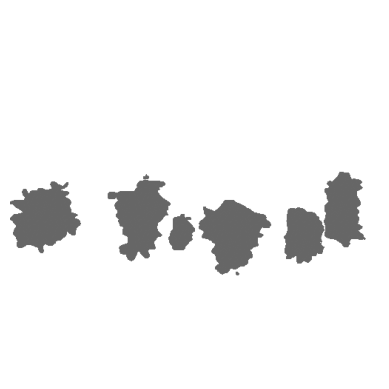


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1981).jpg: 512x512 8 grapess, 72.1ms
Speed: 1.2ms preprocess, 72.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


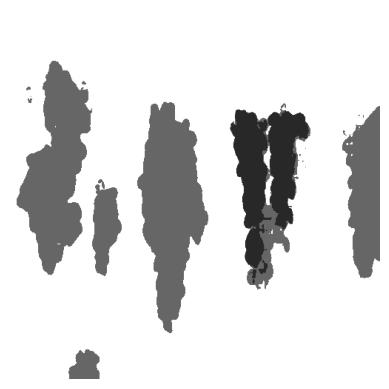


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1578).jpg: 512x512 4 grapess, 65.8ms
Speed: 1.3ms preprocess, 65.8ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


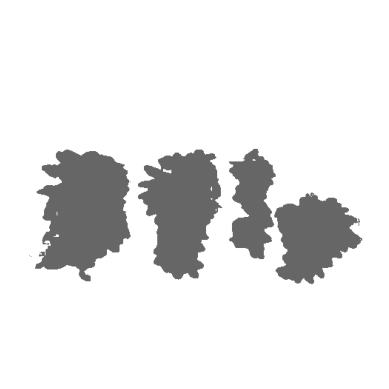


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1651).jpg: 512x512 10 grapess, 66.6ms
Speed: 1.2ms preprocess, 66.6ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


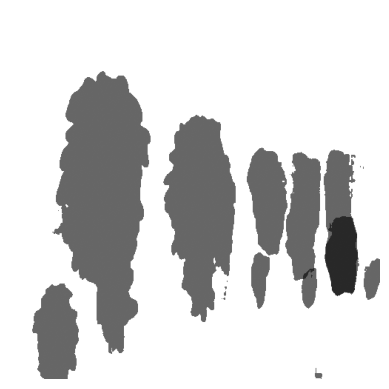


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1714).jpg: 512x512 16 grapess, 60.2ms
Speed: 1.1ms preprocess, 60.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


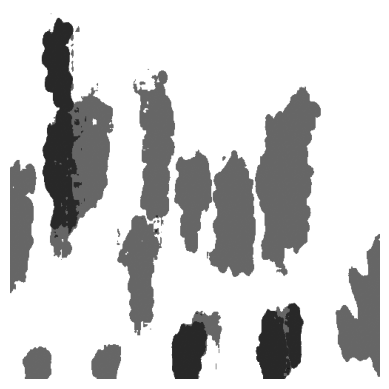


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1850).jpg: 512x512 9 grapess, 62.1ms
Speed: 1.1ms preprocess, 62.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


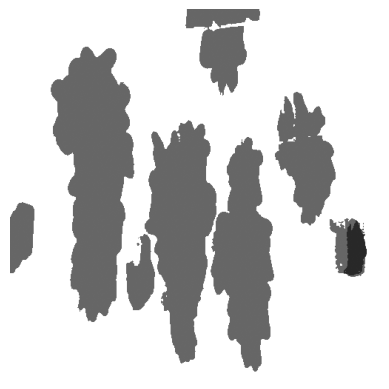


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1503).jpg: 512x512 3 grapess, 67.2ms
Speed: 1.1ms preprocess, 67.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


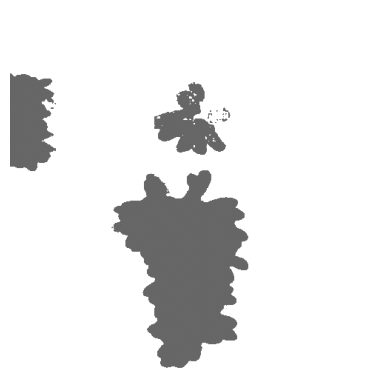


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1915).jpg: 512x512 11 grapess, 65.3ms
Speed: 1.1ms preprocess, 65.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


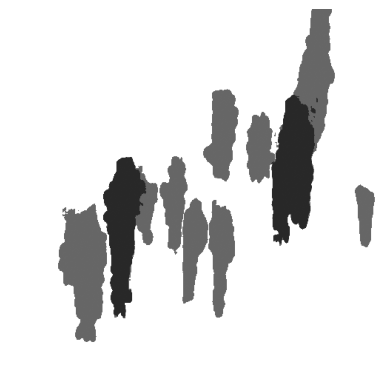


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1780).jpg: 512x512 13 grapess, 64.5ms
Speed: 1.3ms preprocess, 64.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


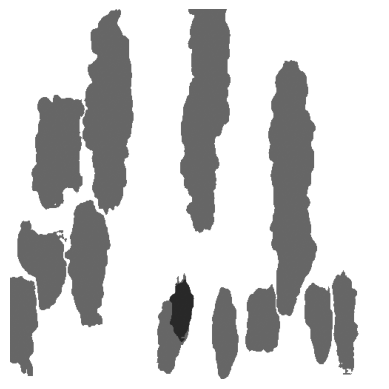


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1554).jpg: 512x512 2 grapess, 61.8ms
Speed: 1.3ms preprocess, 61.8ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


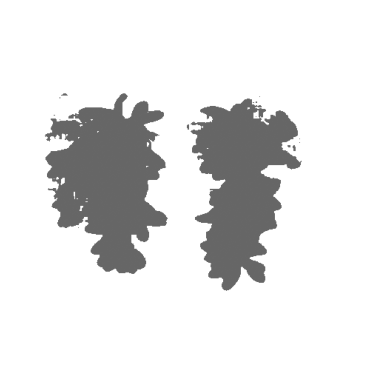


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1807).jpg: 512x512 15 grapess, 72.5ms
Speed: 1.2ms preprocess, 72.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


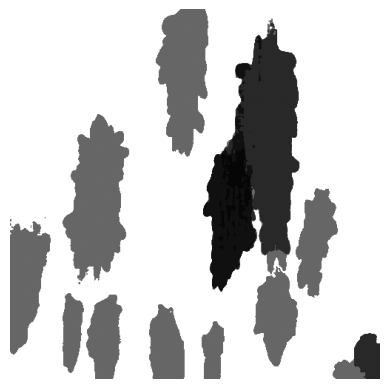


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1942).jpg: 512x512 10 grapess, 67.1ms
Speed: 1.2ms preprocess, 67.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


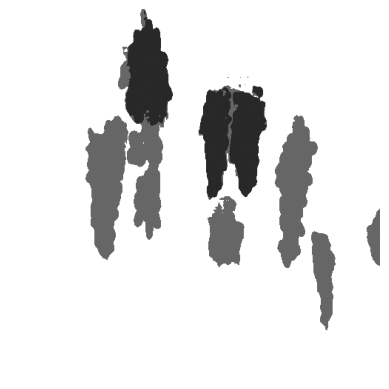


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1738).jpg: 512x512 10 grapess, 81.7ms
Speed: 1.3ms preprocess, 81.7ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


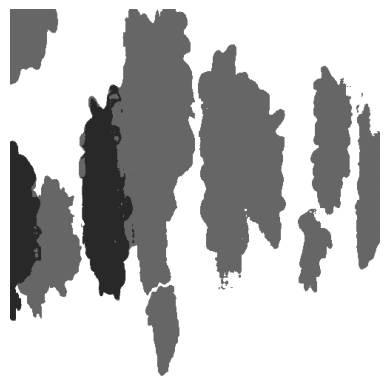


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1692).jpg: 512x512 7 grapess, 60.2ms
Speed: 1.3ms preprocess, 60.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


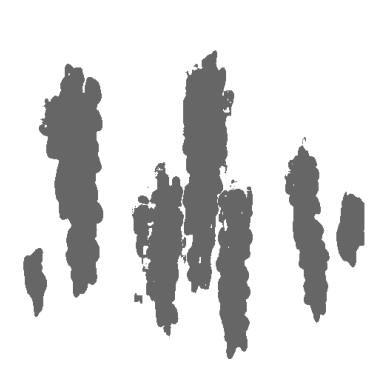


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1811).jpg: 512x512 6 grapess, 62.3ms
Speed: 1.3ms preprocess, 62.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


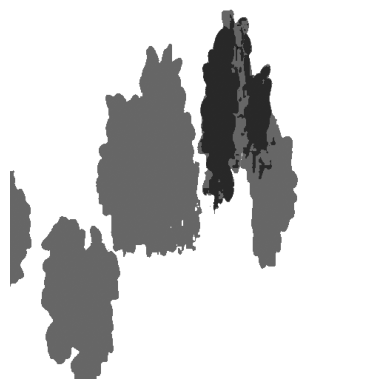


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1542).jpg: 512x512 3 grapess, 106.4ms
Speed: 2.0ms preprocess, 106.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


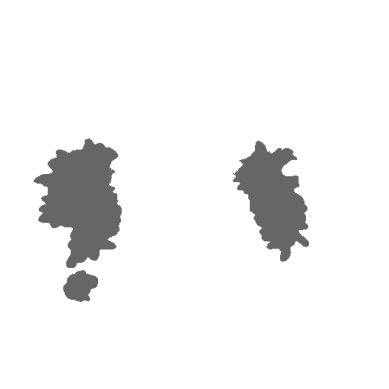


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1954).jpg: 512x512 14 grapess, 63.2ms
Speed: 1.2ms preprocess, 63.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


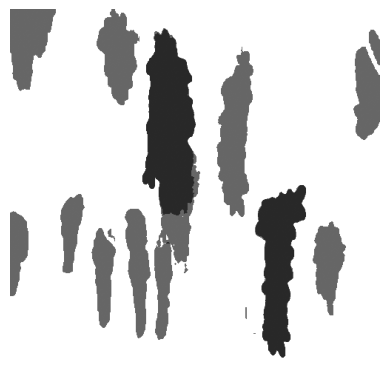


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1684).jpg: 512x512 5 grapess, 61.6ms
Speed: 1.3ms preprocess, 61.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


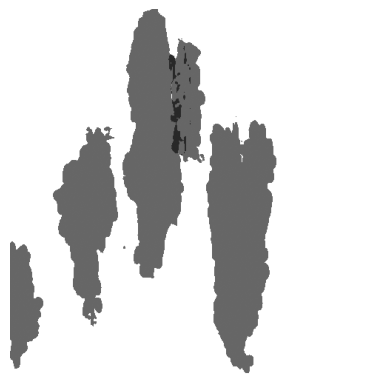


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1515).jpg: 512x512 15 grapess, 88.7ms
Speed: 1.4ms preprocess, 88.7ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


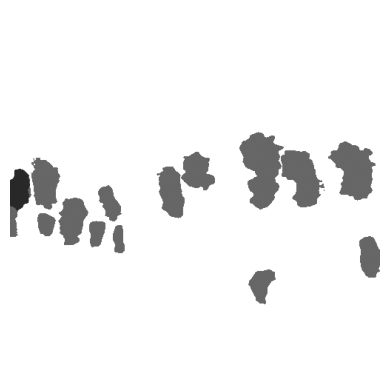


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1846).jpg: 512x512 7 grapess, 68.8ms
Speed: 1.3ms preprocess, 68.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


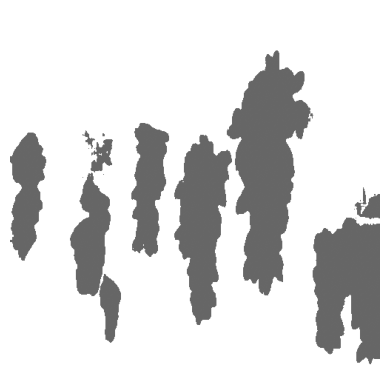


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1903).jpg: 512x512 7 grapess, 72.5ms
Speed: 1.2ms preprocess, 72.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


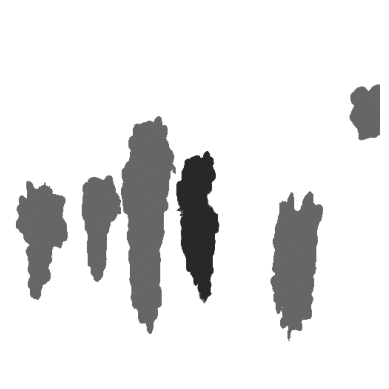


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1779).jpg: 512x512 10 grapess, 68.0ms
Speed: 1.2ms preprocess, 68.0ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


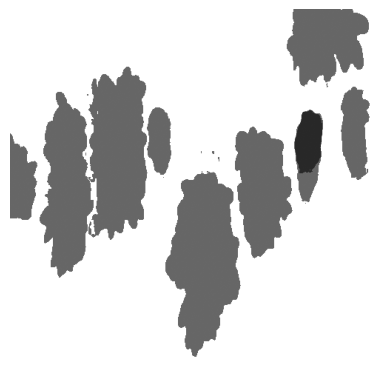


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1796).jpg: 512x512 14 grapess, 82.1ms
Speed: 1.3ms preprocess, 82.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


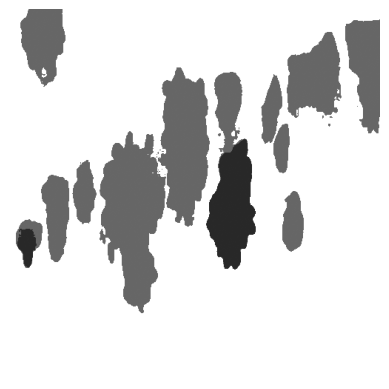


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1974).jpg: 512x512 10 grapess, 74.5ms
Speed: 1.3ms preprocess, 74.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


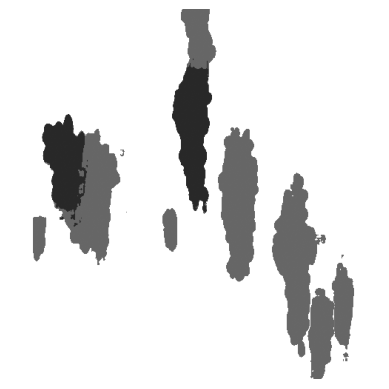


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1831).jpg: 512x512 7 grapess, 61.7ms
Speed: 1.3ms preprocess, 61.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


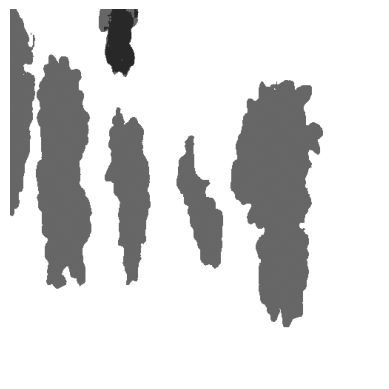


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1562).jpg: 512x512 5 grapess, 65.2ms
Speed: 1.2ms preprocess, 65.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


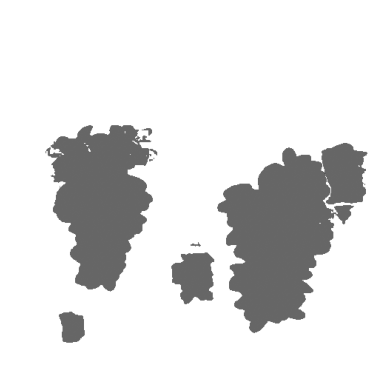


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1759).jpg: 512x512 7 grapess, 62.8ms
Speed: 1.0ms preprocess, 62.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


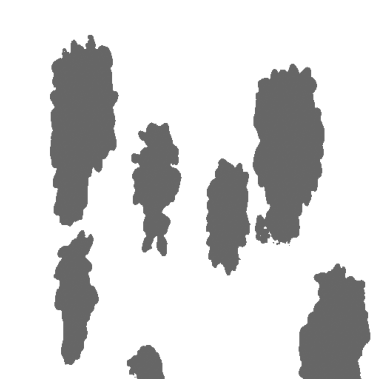


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1923).jpg: 512x512 10 grapess, 78.6ms
Speed: 1.1ms preprocess, 78.6ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


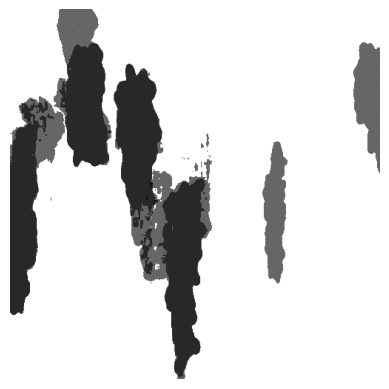


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1889).jpg: 512x512 9 grapess, 68.1ms
Speed: 1.0ms preprocess, 68.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


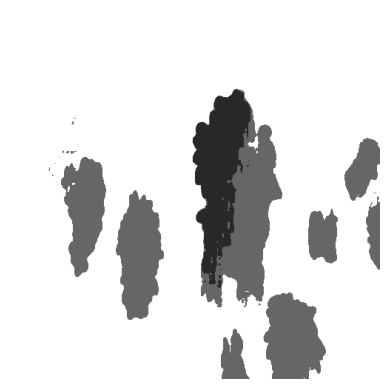


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1535).jpg: 512x512 3 grapess, 69.5ms
Speed: 1.0ms preprocess, 69.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


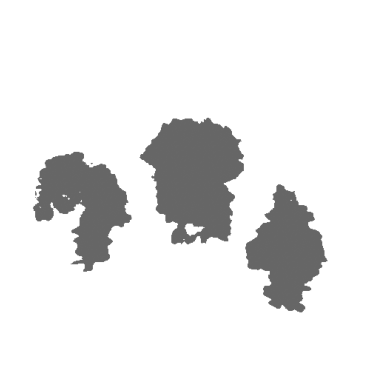


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1866).jpg: 512x512 16 grapess, 89.3ms
Speed: 1.3ms preprocess, 89.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


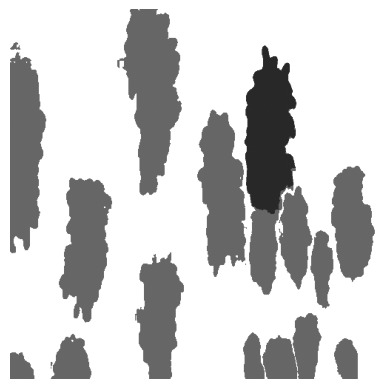


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1935).jpg: 512x512 10 grapess, 62.7ms
Speed: 1.1ms preprocess, 62.7ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


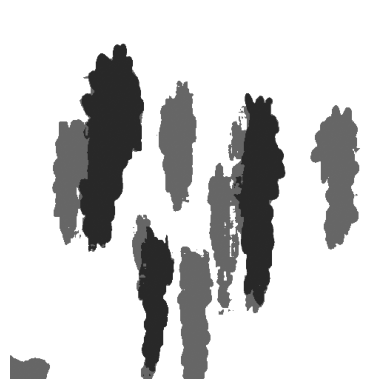


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1870).jpg: 512x512 10 grapess, 71.4ms
Speed: 1.1ms preprocess, 71.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


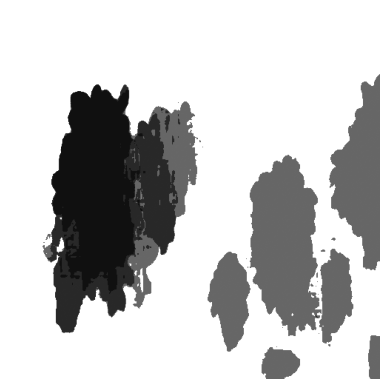


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1523).jpg: 512x512 8 grapess, 65.9ms
Speed: 1.1ms preprocess, 65.9ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


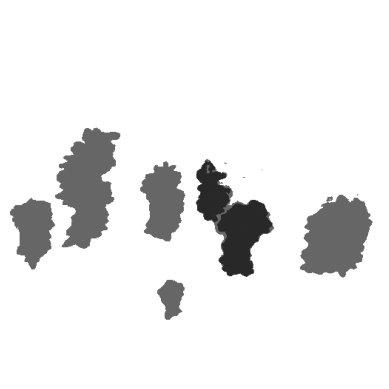


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1718).jpg: 512x512 7 grapess, 96.8ms
Speed: 1.2ms preprocess, 96.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


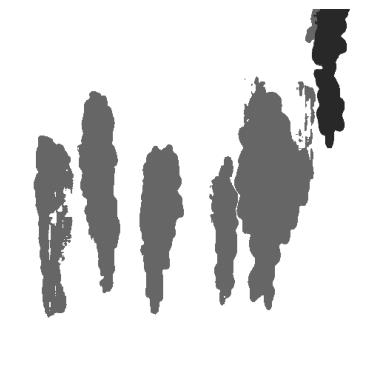


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1962).jpg: 512x512 6 grapess, 67.5ms
Speed: 1.3ms preprocess, 67.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


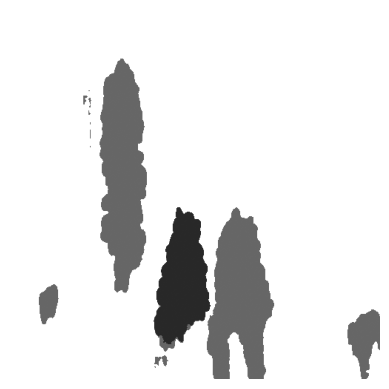


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1574).jpg: 512x512 2 grapess, 61.2ms
Speed: 1.1ms preprocess, 61.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


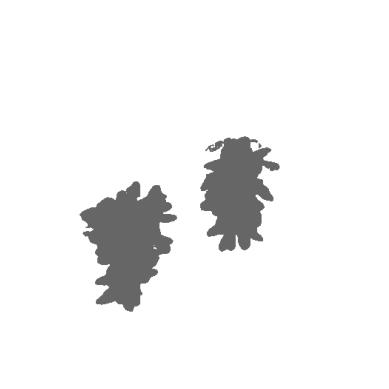


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1827).jpg: 512x512 10 grapess, 61.8ms
Speed: 1.0ms preprocess, 61.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


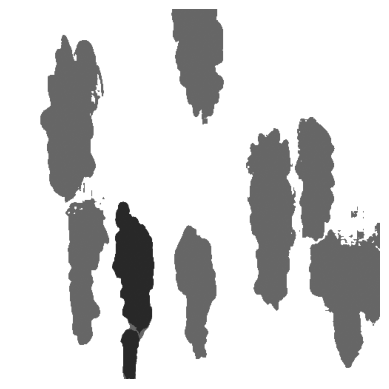


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1763).jpg: 512x512 11 grapess, 63.7ms
Speed: 1.2ms preprocess, 63.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


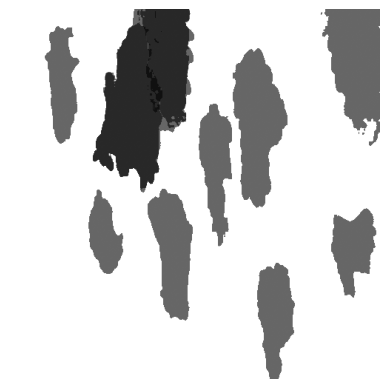


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1626).jpg: 512x512 6 grapess, 60.3ms
Speed: 1.0ms preprocess, 60.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


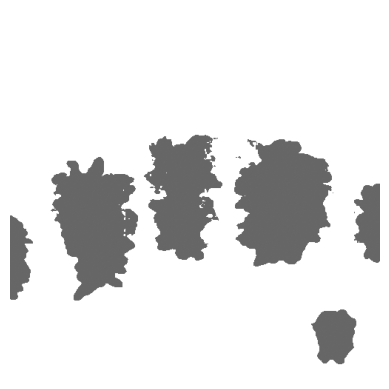


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1919).jpg: 512x512 12 grapess, 78.9ms
Speed: 1.4ms preprocess, 78.9ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


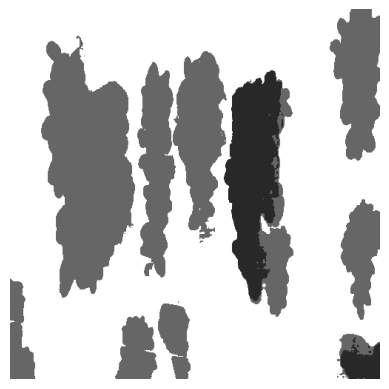


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1734).jpg: 512x512 11 grapess, 66.9ms
Speed: 1.2ms preprocess, 66.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


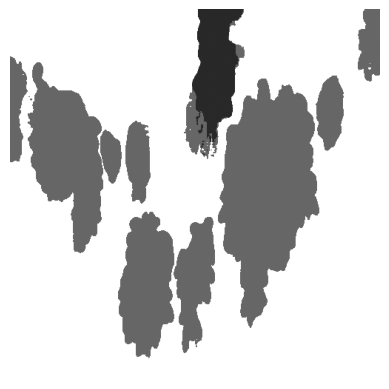


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1671).jpg: 512x512 4 grapess, 73.8ms
Speed: 1.2ms preprocess, 73.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


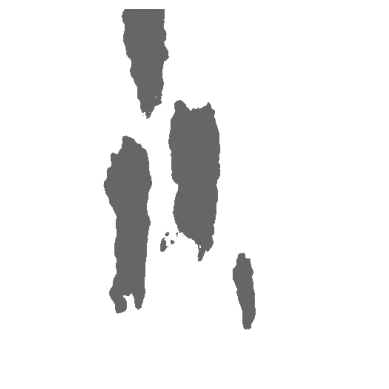


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1558).jpg: 512x512 4 grapess, 77.3ms
Speed: 1.4ms preprocess, 77.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


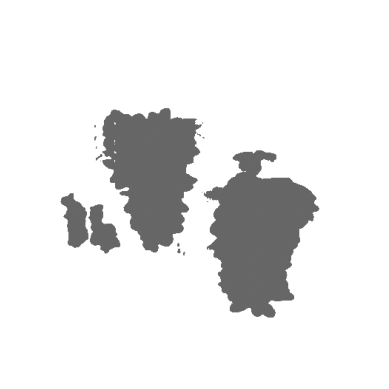


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1722).jpg: 512x512 11 grapess, 69.6ms
Speed: 1.2ms preprocess, 69.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


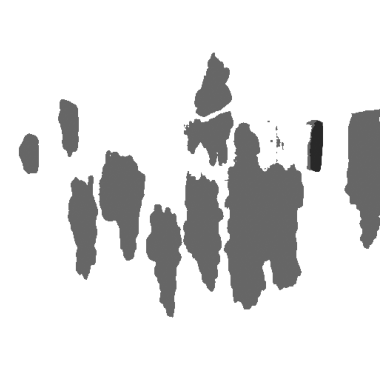


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1688).jpg: 512x512 6 grapess, 68.4ms
Speed: 1.1ms preprocess, 68.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


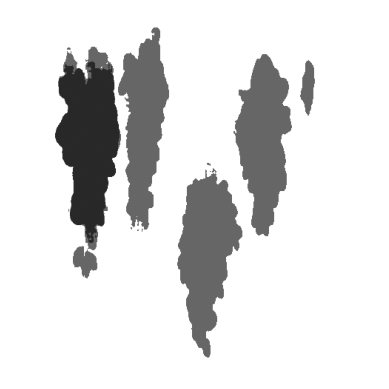


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1667).jpg: 512x512 7 grapess, 101.1ms
Speed: 1.8ms preprocess, 101.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


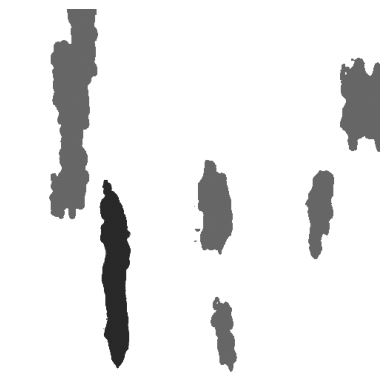


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1958).jpg: 512x512 10 grapess, 66.7ms
Speed: 1.3ms preprocess, 66.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


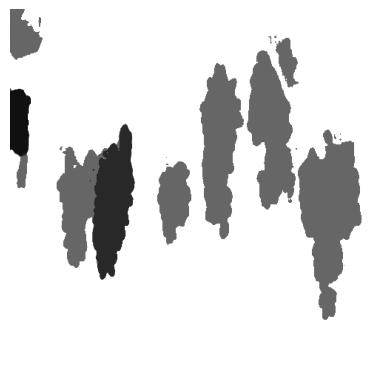


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1775).jpg: 512x512 9 grapess, 70.4ms
Speed: 1.1ms preprocess, 70.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


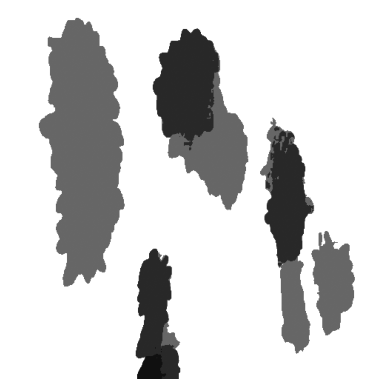


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1630).jpg: 512x512 2 grapess, 61.2ms
Speed: 1.2ms preprocess, 61.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


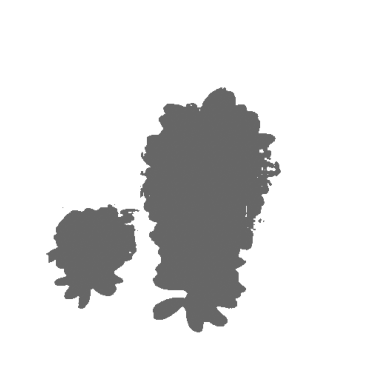


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1519).jpg: 512x512 5 grapess, 68.4ms
Speed: 1.0ms preprocess, 68.4ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


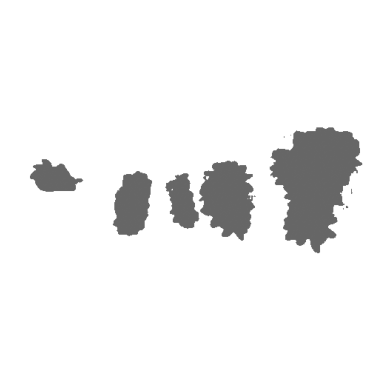


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1791).jpg: 512x512 3 grapess, 71.6ms
Speed: 1.1ms preprocess, 71.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


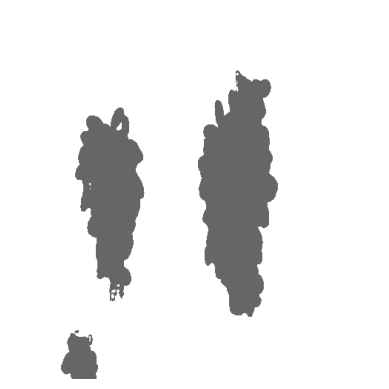


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1841).jpg: 512x512 8 grapess, 84.8ms
Speed: 1.5ms preprocess, 84.8ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


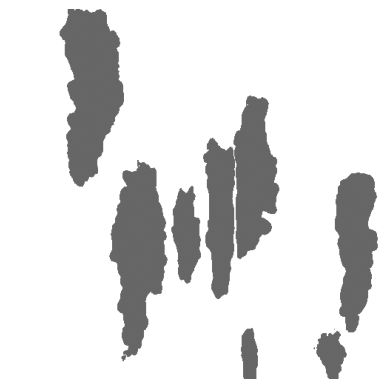


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1512).jpg: 512x512 5 grapess, 65.5ms
Speed: 1.4ms preprocess, 65.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


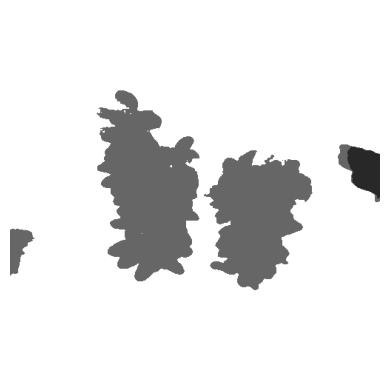


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1904).jpg: 512x512 11 grapess, 66.2ms
Speed: 1.3ms preprocess, 66.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


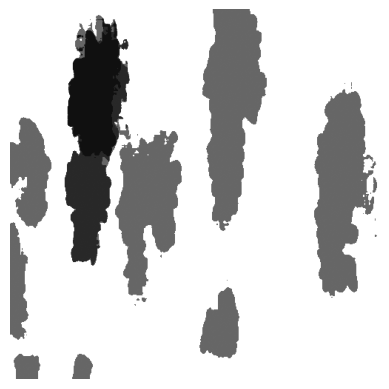


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1683).jpg: 512x512 10 grapess, 60.4ms
Speed: 1.2ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


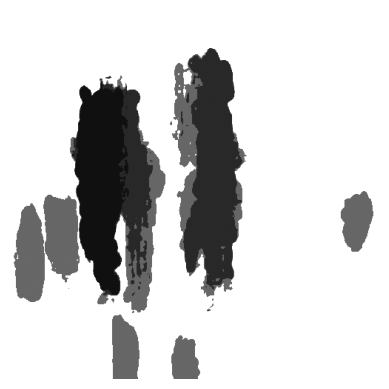


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1729).jpg: 512x512 9 grapess, 63.9ms
Speed: 1.2ms preprocess, 63.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


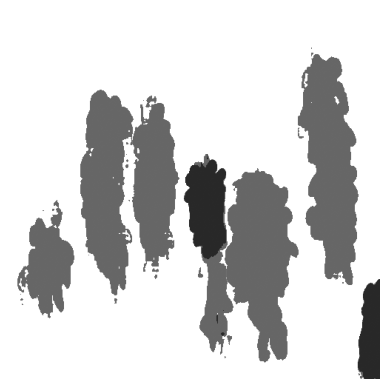


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1545).jpg: 512x512 5 grapess, 77.7ms
Speed: 4.8ms preprocess, 77.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


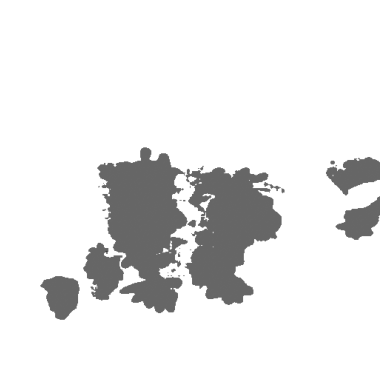


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1816).jpg: 512x512 6 grapess, 82.7ms
Speed: 1.2ms preprocess, 82.7ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


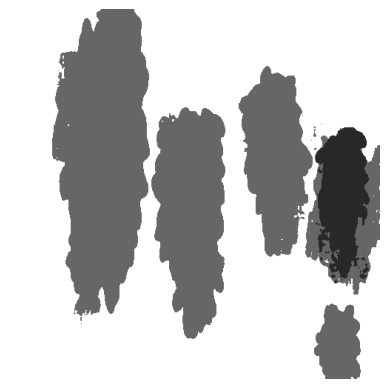


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1953).jpg: 512x512 10 grapess, 64.9ms
Speed: 1.0ms preprocess, 64.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


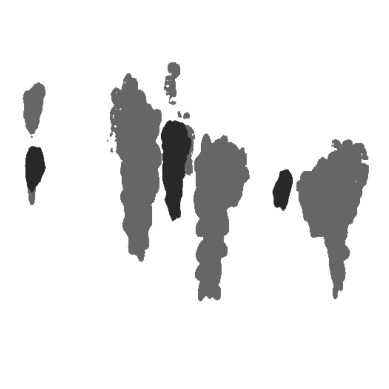


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1695).jpg: 512x512 6 grapess, 61.7ms
Speed: 1.1ms preprocess, 61.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


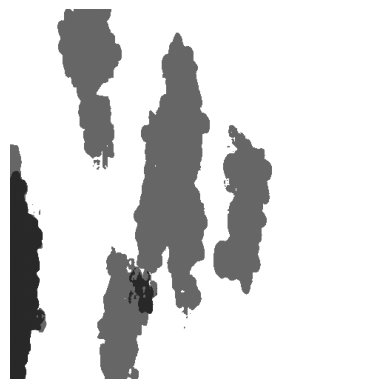


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1800).jpg: 512x512 19 grapess, 64.4ms
Speed: 1.2ms preprocess, 64.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


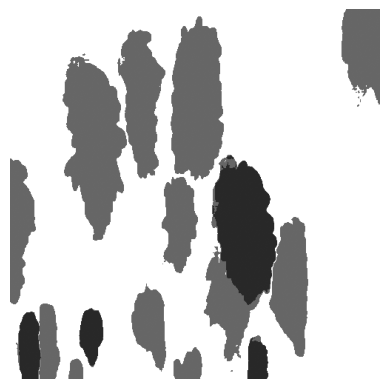


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1553).jpg: 512x512 4 grapess, 58.6ms
Speed: 1.1ms preprocess, 58.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


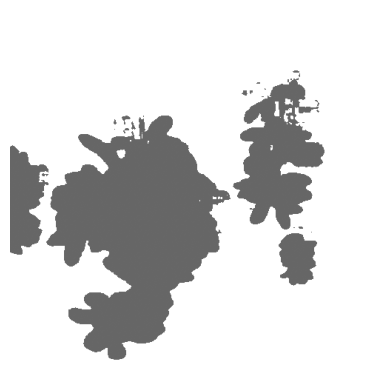


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1945).jpg: 512x512 4 grapess, 69.0ms
Speed: 1.6ms preprocess, 69.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


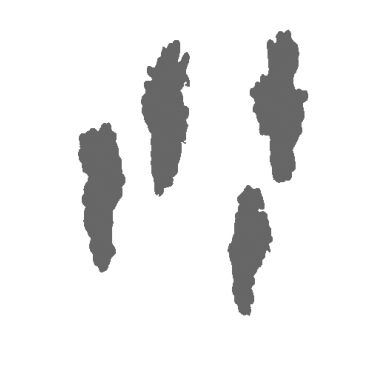


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1768).jpg: 512x512 11 grapess, 72.7ms
Speed: 1.7ms preprocess, 72.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


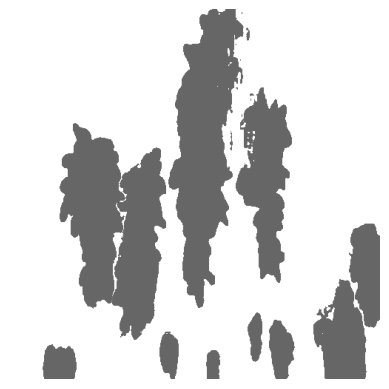


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1787).jpg: 512x512 4 grapess, 63.5ms
Speed: 1.1ms preprocess, 63.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


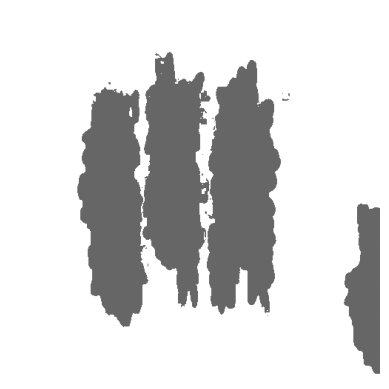


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1504).jpg: 512x512 5 grapess, 80.8ms
Speed: 1.2ms preprocess, 80.8ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


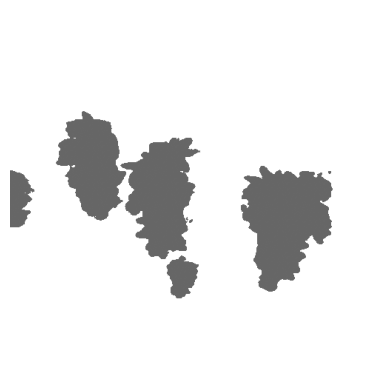


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1857).jpg: 512x512 14 grapess, 70.3ms
Speed: 1.2ms preprocess, 70.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


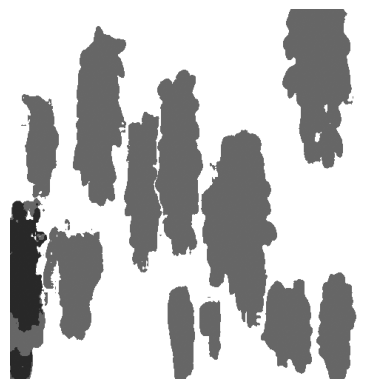


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1912).jpg: 512x512 7 grapess, 64.3ms
Speed: 1.2ms preprocess, 64.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


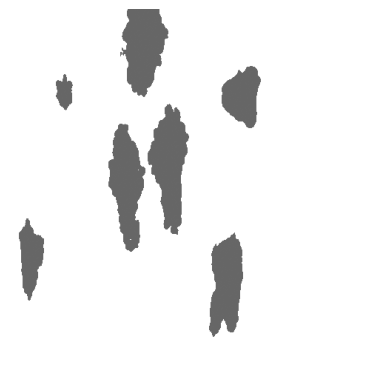


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1656).jpg: 512x512 11 grapess, 104.4ms
Speed: 1.2ms preprocess, 104.4ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


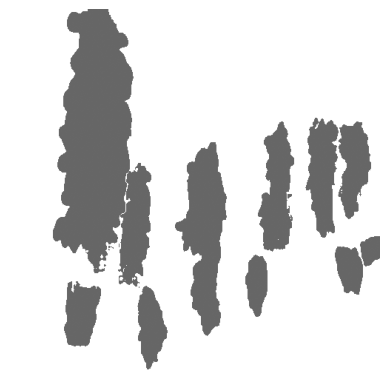


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1713).jpg: 512x512 6 grapess, 60.2ms
Speed: 1.1ms preprocess, 60.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


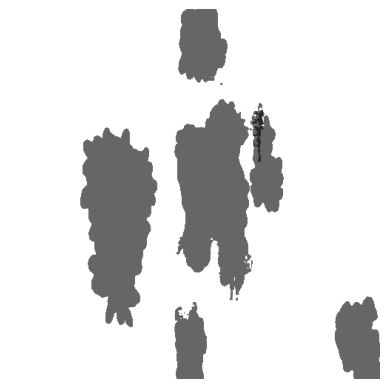


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1969).jpg: 512x512 6 grapess, 64.7ms
Speed: 1.3ms preprocess, 64.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


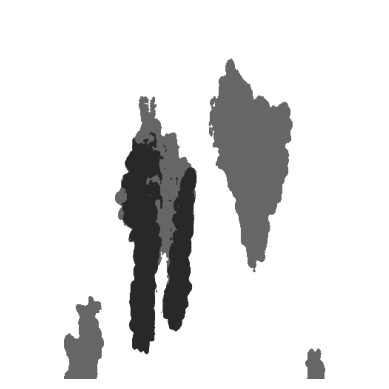


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1590).jpg: 512x512 2 grapess, 72.7ms
Speed: 1.1ms preprocess, 72.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


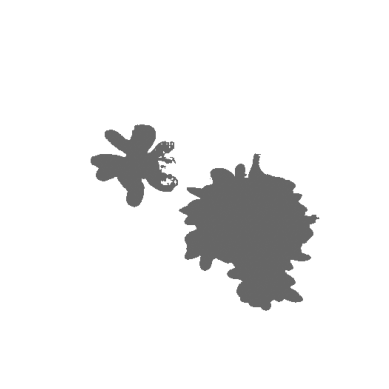


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1986).jpg: 512x512 8 grapess, 65.0ms
Speed: 1.3ms preprocess, 65.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


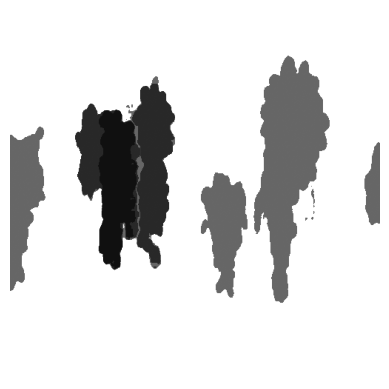


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1601).jpg: 512x512 2 grapess, 64.2ms
Speed: 1.1ms preprocess, 64.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


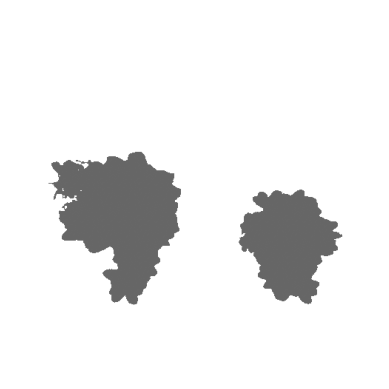


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1744).jpg: 512x512 9 grapess, 71.3ms
Speed: 1.3ms preprocess, 71.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


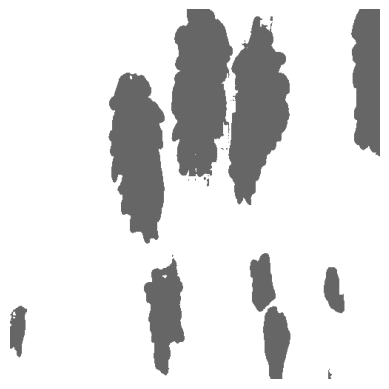


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1894).jpg: 512x512 6 grapess, 62.8ms
Speed: 1.9ms preprocess, 62.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


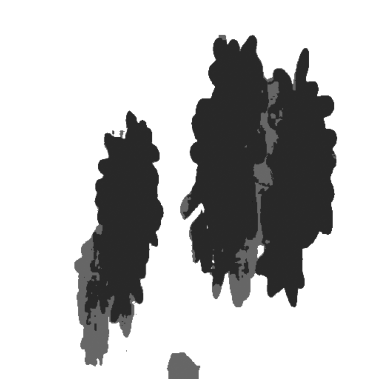


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1528).jpg: 512x512 5 grapess, 64.8ms
Speed: 1.2ms preprocess, 64.8ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


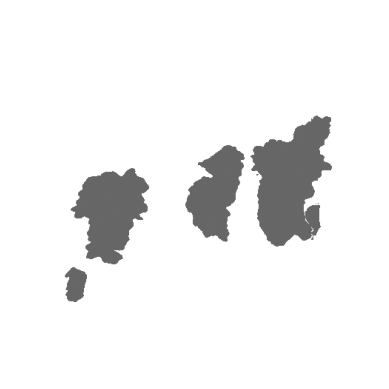


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1617).jpg: 512x512 3 grapess, 63.4ms
Speed: 1.1ms preprocess, 63.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


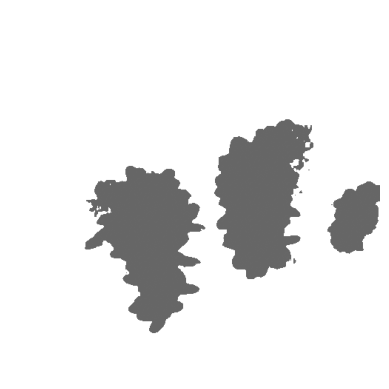


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1752).jpg: 512x512 9 grapess, 67.1ms
Speed: 1.1ms preprocess, 67.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


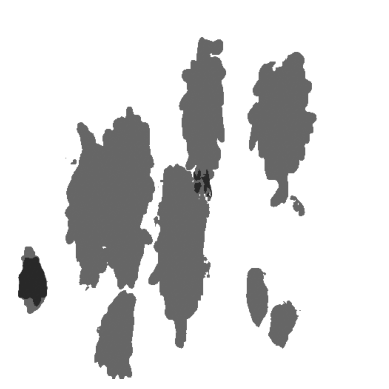


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1882).jpg: 512x512 14 grapess, 65.7ms
Speed: 1.2ms preprocess, 65.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


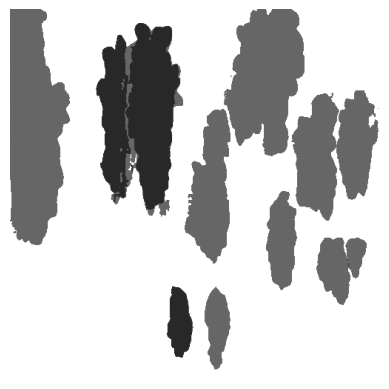


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1928).jpg: 512x512 8 grapess, 61.7ms
Speed: 1.2ms preprocess, 61.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


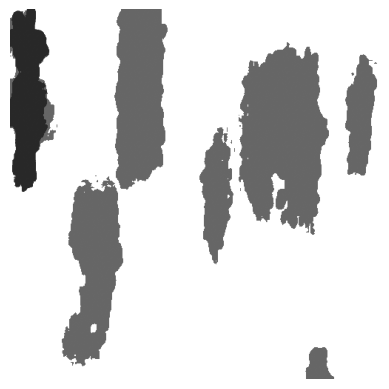


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1640).jpg: 512x512 14 grapess, 72.3ms
Speed: 1.2ms preprocess, 72.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


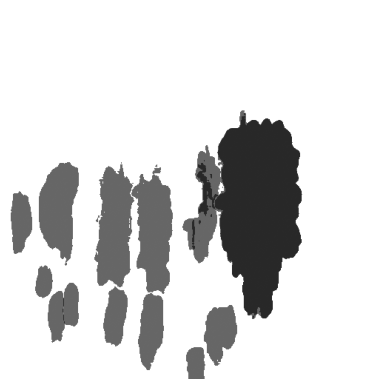


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1705).jpg: 512x512 4 grapess, 59.6ms
Speed: 1.1ms preprocess, 59.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


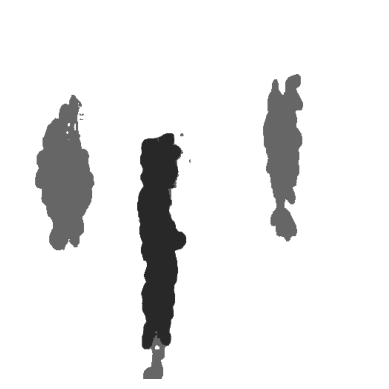


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1586).jpg: 512x512 11 grapess, 67.1ms
Speed: 1.0ms preprocess, 67.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


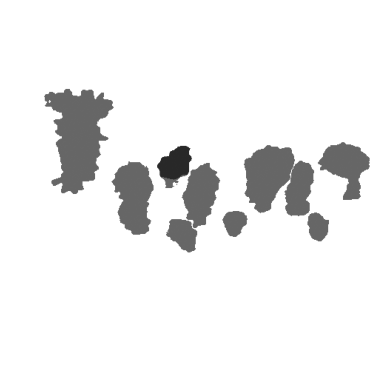


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1990).jpg: 512x512 5 grapess, 60.5ms
Speed: 1.2ms preprocess, 60.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


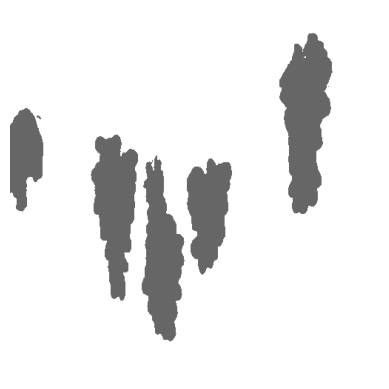


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1569).jpg: 512x512 3 grapess, 62.6ms
Speed: 1.1ms preprocess, 62.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


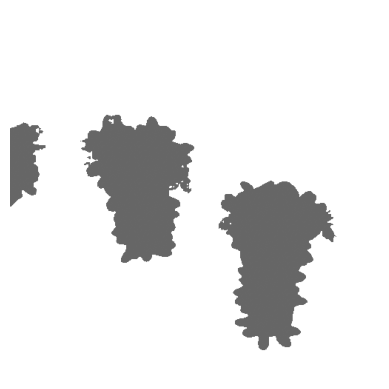


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1908).jpg: 512x512 8 grapess, 64.9ms
Speed: 1.4ms preprocess, 64.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


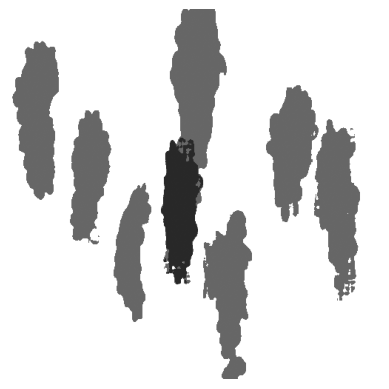


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1772).jpg: 512x512 11 grapess, 66.6ms
Speed: 1.1ms preprocess, 66.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


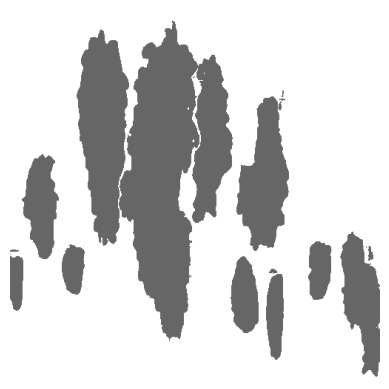


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1637).jpg: 512x512 16 grapess, 58.4ms
Speed: 1.1ms preprocess, 58.4ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


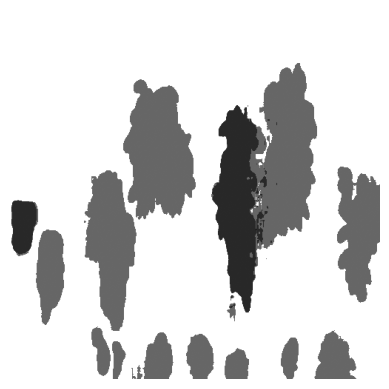


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1549).jpg: 512x512 4 grapess, 60.4ms
Speed: 1.2ms preprocess, 60.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


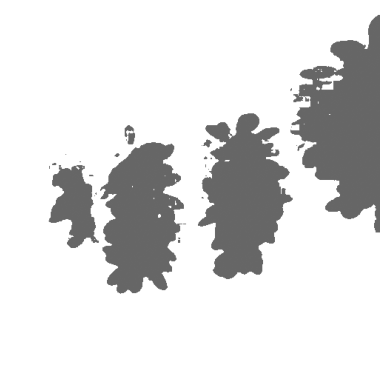


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1725).jpg: 512x512 7 grapess, 63.7ms
Speed: 1.3ms preprocess, 63.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


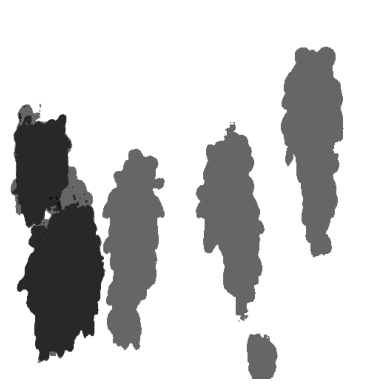


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1660).jpg: 512x512 14 grapess, 64.4ms
Speed: 1.1ms preprocess, 64.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


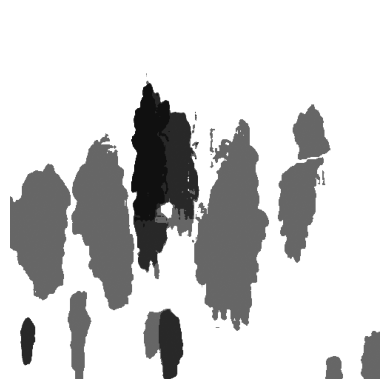


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1949).jpg: 512x512 7 grapess, 63.9ms
Speed: 2.4ms preprocess, 63.9ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


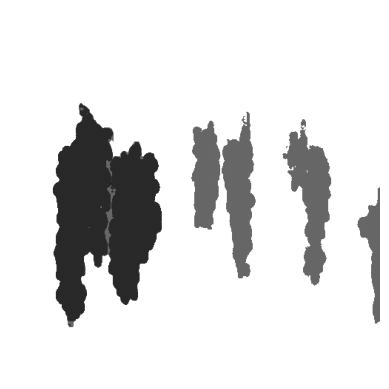


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1699).jpg: 512x512 6 grapess, 65.0ms
Speed: 1.2ms preprocess, 65.0ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


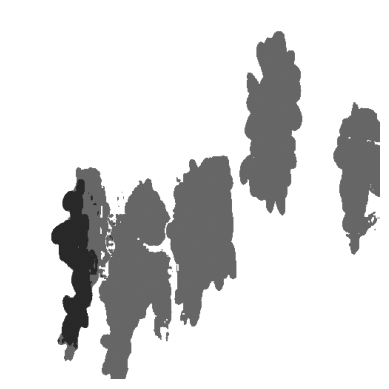


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1733).jpg: 512x512 16 grapess, 62.6ms
Speed: 1.3ms preprocess, 62.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


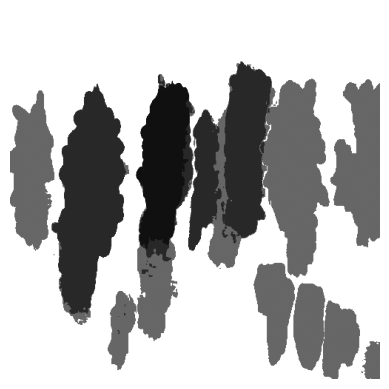


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1676).jpg: 512x512 10 grapess, 59.1ms
Speed: 1.2ms preprocess, 59.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


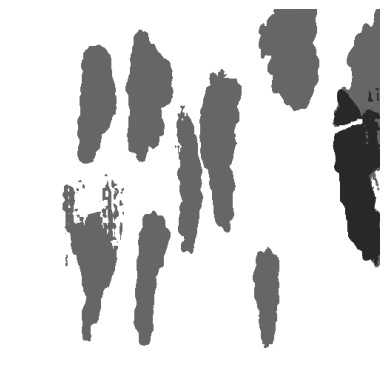


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1508).jpg: 512x512 8 grapess, 64.6ms
Speed: 1.2ms preprocess, 64.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


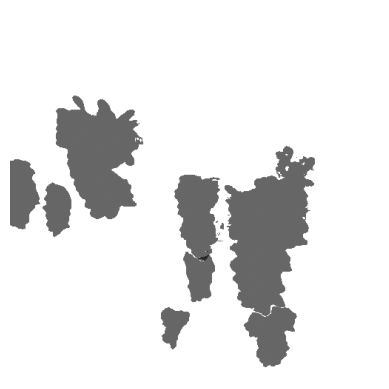


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1764).jpg: 512x512 6 grapess, 65.1ms
Speed: 2.5ms preprocess, 65.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


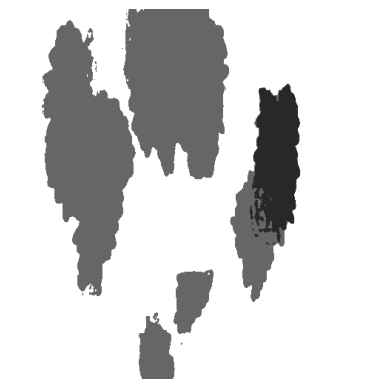


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1621).jpg: 512x512 4 grapess, 65.0ms
Speed: 1.3ms preprocess, 65.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


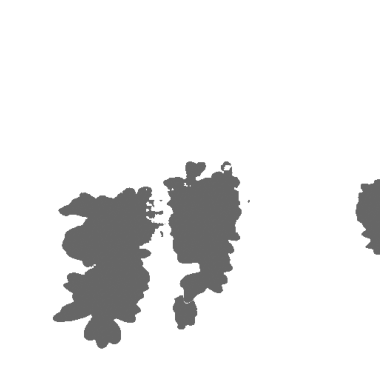


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1965).jpg: 512x512 8 grapess, 76.1ms
Speed: 1.2ms preprocess, 76.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


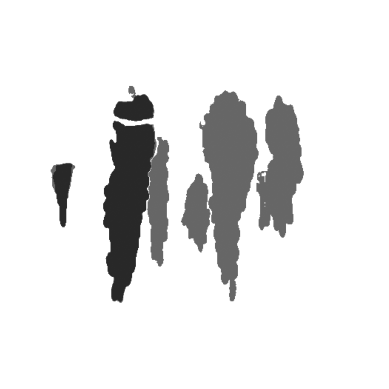


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1820).jpg: 512x512 6 grapess, 64.5ms
Speed: 1.2ms preprocess, 64.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


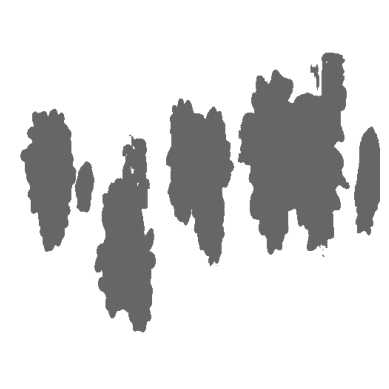


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1573).jpg: 512x512 9 grapess, 64.4ms
Speed: 1.1ms preprocess, 64.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


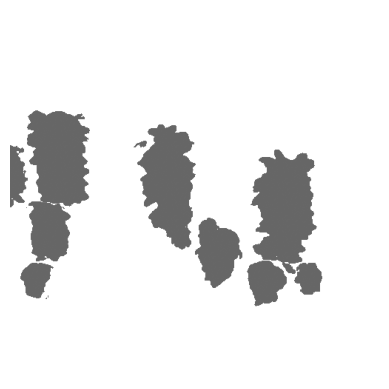


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1898).jpg: 512x512 12 grapess, 64.8ms
Speed: 1.2ms preprocess, 64.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


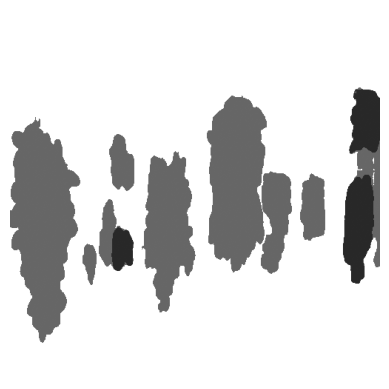


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1932).jpg: 512x512 8 grapess, 61.1ms
Speed: 1.2ms preprocess, 61.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


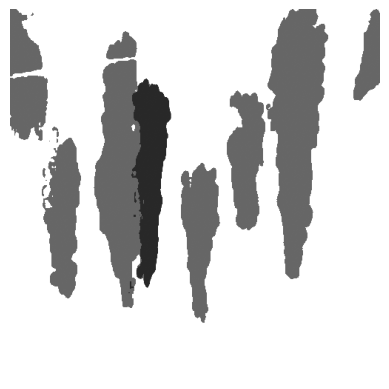


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1524).jpg: 512x512 4 grapess, 63.1ms
Speed: 1.0ms preprocess, 63.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


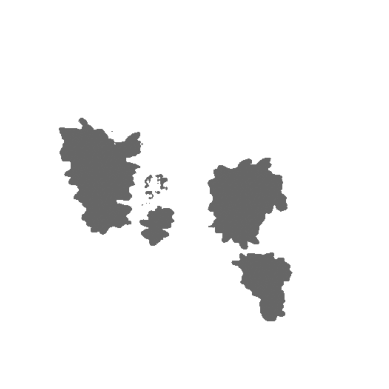


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1877).jpg: 512x512 7 grapess, 68.8ms
Speed: 1.1ms preprocess, 68.8ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


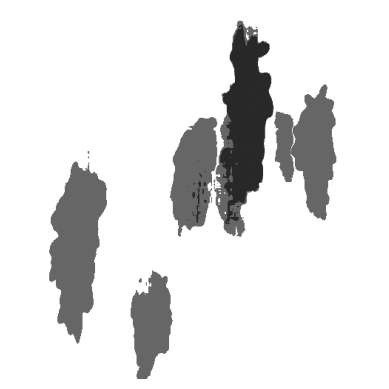


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1748).jpg: 512x512 5 grapess, 72.7ms
Speed: 1.2ms preprocess, 72.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


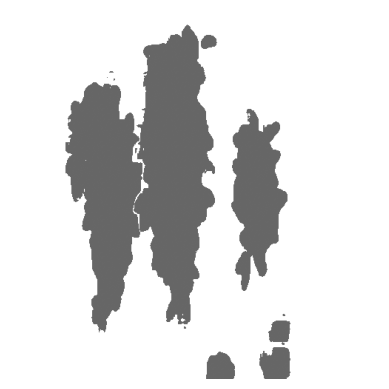


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1924).jpg: 512x512 8 grapess, 64.4ms
Speed: 1.2ms preprocess, 64.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


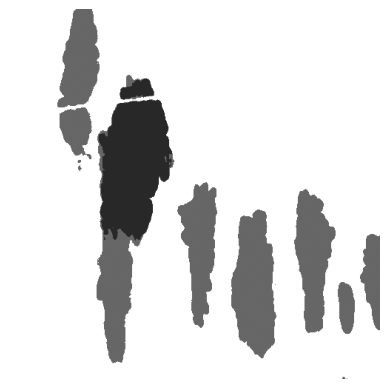


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1861).jpg: 512x512 5 grapess, 123.3ms
Speed: 2.4ms preprocess, 123.3ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


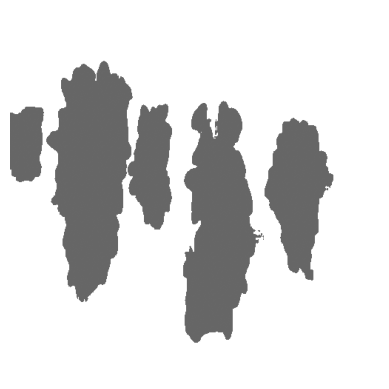


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1532).jpg: 512x512 10 grapess, 64.6ms
Speed: 1.3ms preprocess, 64.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


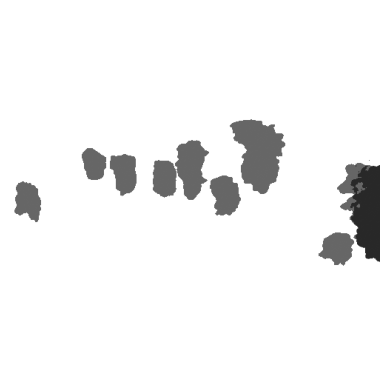


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1973).jpg: 512x512 8 grapess, 84.4ms
Speed: 2.0ms preprocess, 84.4ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


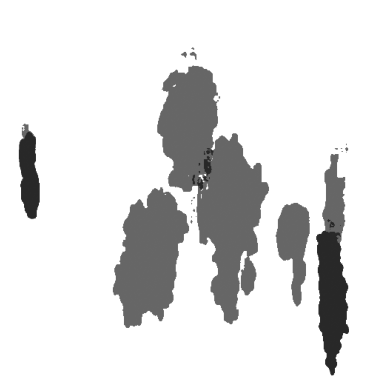


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1565).jpg: 512x512 5 grapess, 62.9ms
Speed: 1.2ms preprocess, 62.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


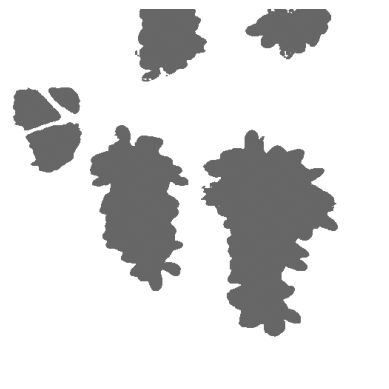


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1836).jpg: 512x512 4 grapess, 64.1ms
Speed: 1.2ms preprocess, 64.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


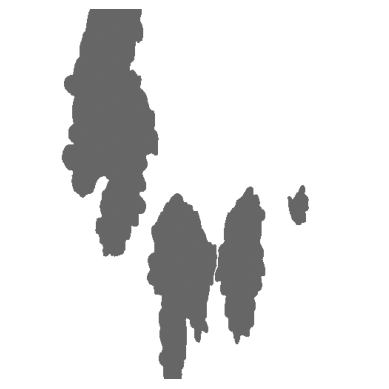


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1709).jpg: 512x512 5 grapess, 71.3ms
Speed: 1.3ms preprocess, 71.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


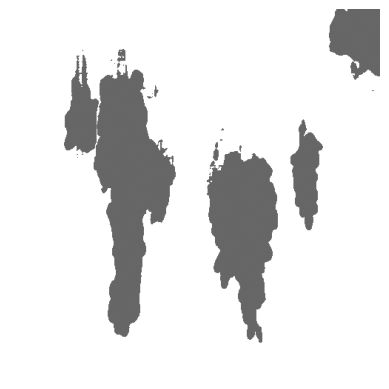


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1708).jpg: 512x512 7 grapess, 68.8ms
Speed: 1.1ms preprocess, 68.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


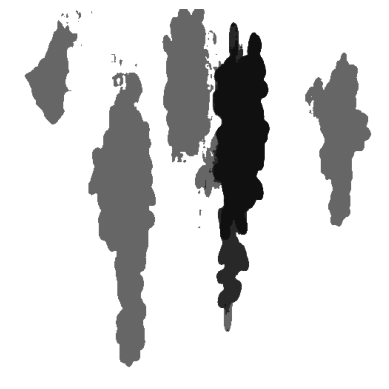


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1972).jpg: 512x512 6 grapess, 65.9ms
Speed: 1.0ms preprocess, 65.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


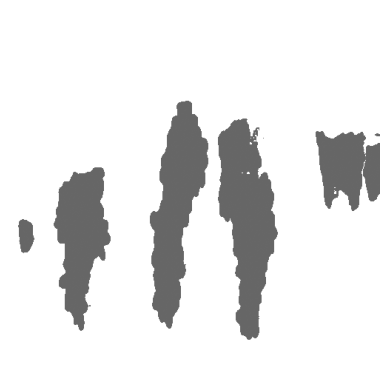


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1564).jpg: 512x512 6 grapess, 79.5ms
Speed: 1.2ms preprocess, 79.5ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


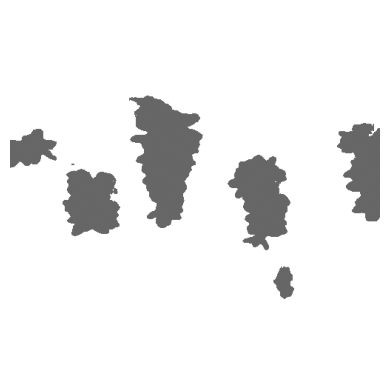


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1837).jpg: 512x512 11 grapess, 67.3ms
Speed: 1.1ms preprocess, 67.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


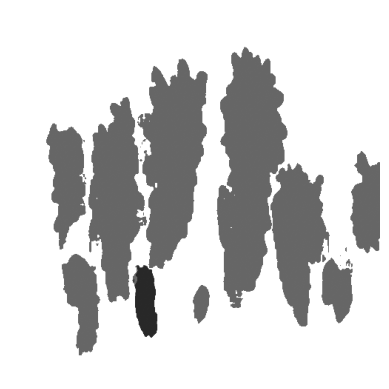


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1925).jpg: 512x512 13 grapess, 77.3ms
Speed: 1.2ms preprocess, 77.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


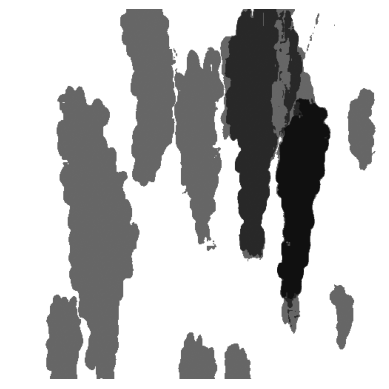


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1860).jpg: 512x512 4 grapess, 58.7ms
Speed: 1.1ms preprocess, 58.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


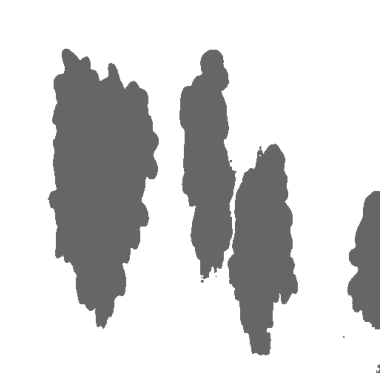


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1533).jpg: 512x512 8 grapess, 67.1ms
Speed: 1.2ms preprocess, 67.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


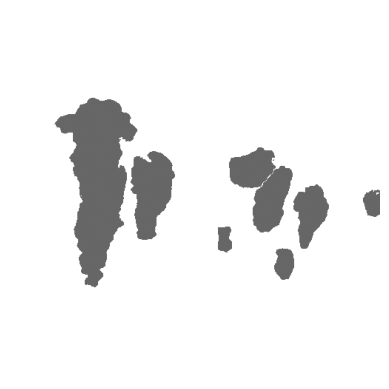


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1749).jpg: 512x512 19 grapess, 67.0ms
Speed: 1.2ms preprocess, 67.0ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


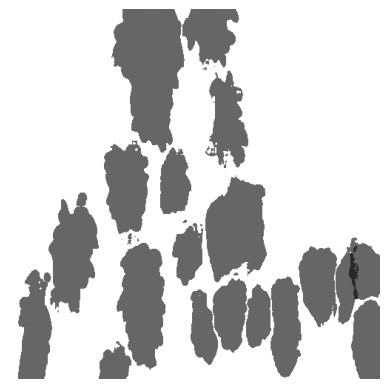


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1899).jpg: 512x512 (no detections), 61.6ms
Speed: 1.2ms preprocess, 61.6ms inference, 0.2ms postprocess per image at shape (1, 3, 512, 512)


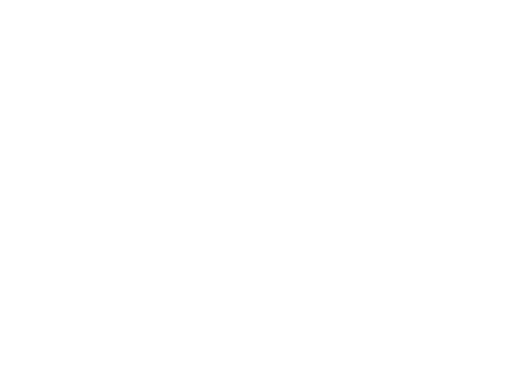


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1933).jpg: 512x512 12 grapess, 64.3ms
Speed: 1.0ms preprocess, 64.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


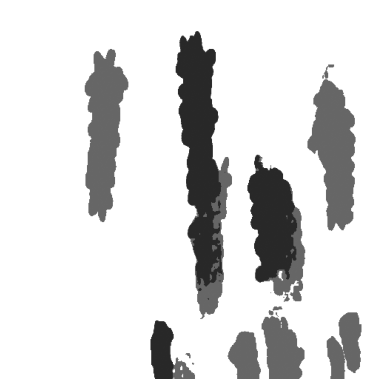


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1525).jpg: 512x512 7 grapess, 60.2ms
Speed: 1.2ms preprocess, 60.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


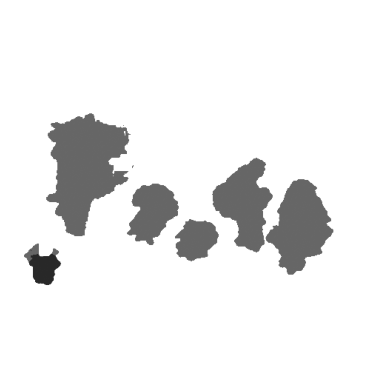


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1876).jpg: 512x512 7 grapess, 70.7ms
Speed: 1.3ms preprocess, 70.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


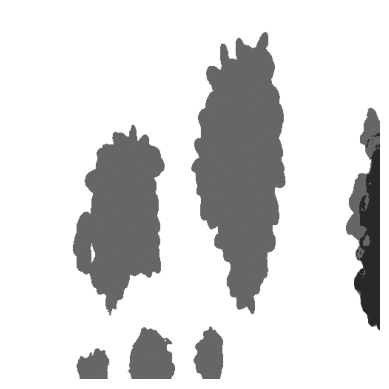


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1964).jpg: 512x512 7 grapess, 66.1ms
Speed: 1.3ms preprocess, 66.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


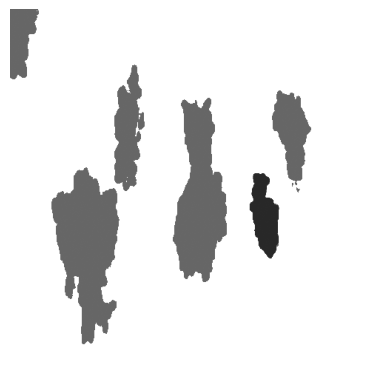


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1821).jpg: 512x512 8 grapess, 64.4ms
Speed: 2.6ms preprocess, 64.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


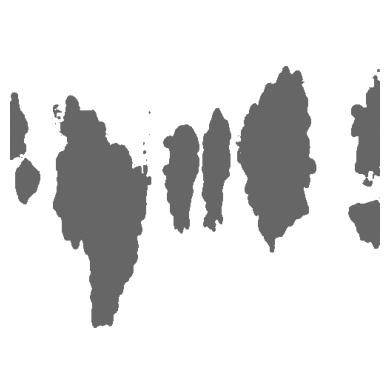


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1572).jpg: 512x512 8 grapess, 65.7ms
Speed: 1.2ms preprocess, 65.7ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


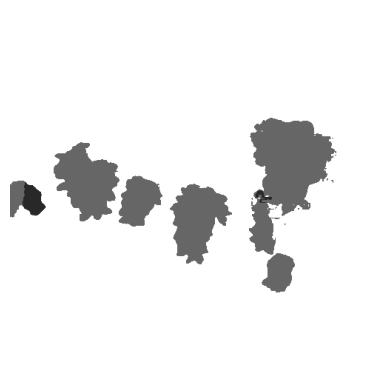


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1765).jpg: 512x512 9 grapess, 70.2ms
Speed: 1.1ms preprocess, 70.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


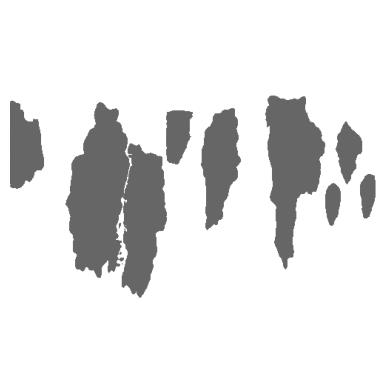


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1620).jpg: 512x512 11 grapess, 63.3ms
Speed: 1.1ms preprocess, 63.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


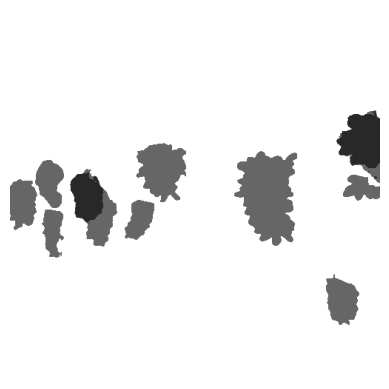


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1509).jpg: 512x512 6 grapess, 62.0ms
Speed: 1.1ms preprocess, 62.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


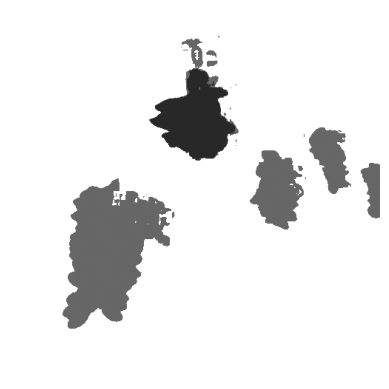


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1698).jpg: 512x512 5 grapess, 64.1ms
Speed: 1.2ms preprocess, 64.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


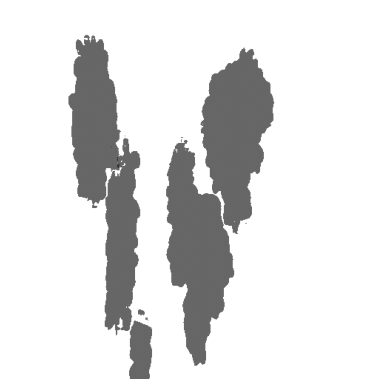


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1732).jpg: 512x512 9 grapess, 65.5ms
Speed: 1.2ms preprocess, 65.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


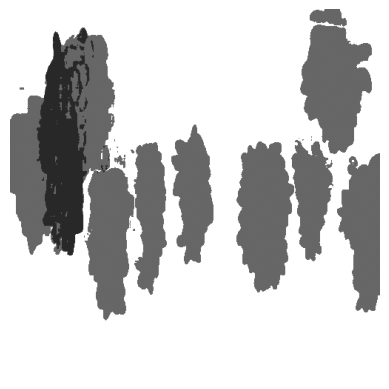


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1677).jpg: 512x512 6 grapess, 66.8ms
Speed: 1.6ms preprocess, 66.8ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


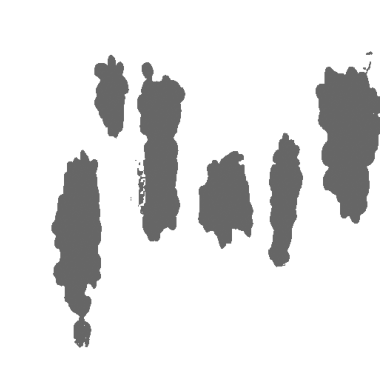


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1948).jpg: 512x512 17 grapess, 63.4ms
Speed: 1.2ms preprocess, 63.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


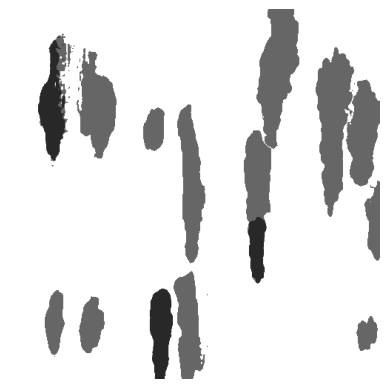


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1724).jpg: 512x512 6 grapess, 62.1ms
Speed: 1.2ms preprocess, 62.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


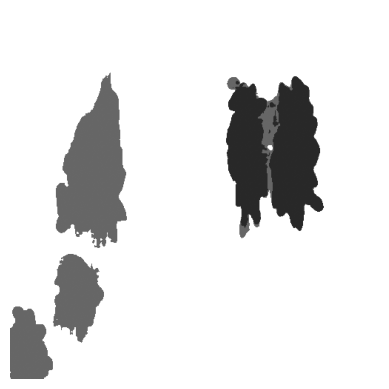


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1661).jpg: 512x512 17 grapess, 63.6ms
Speed: 1.3ms preprocess, 63.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


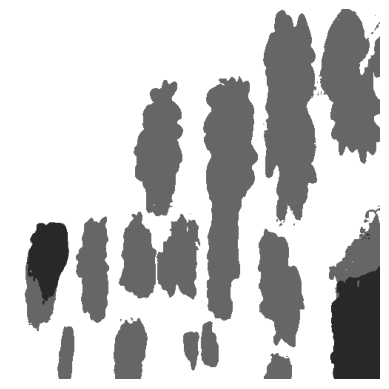


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1548).jpg: 512x512 2 grapess, 62.8ms
Speed: 1.2ms preprocess, 62.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


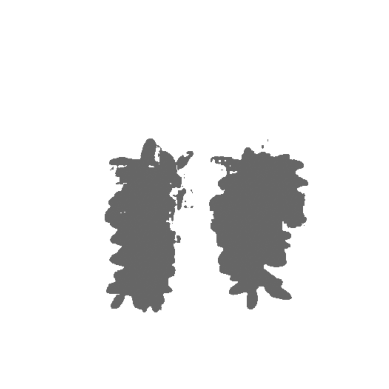


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1773).jpg: 512x512 13 grapess, 72.3ms
Speed: 2.7ms preprocess, 72.3ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


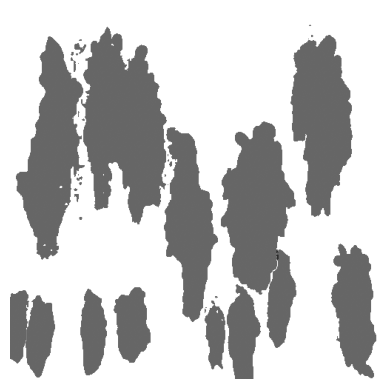


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1636).jpg: 512x512 11 grapess, 61.7ms
Speed: 1.2ms preprocess, 61.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


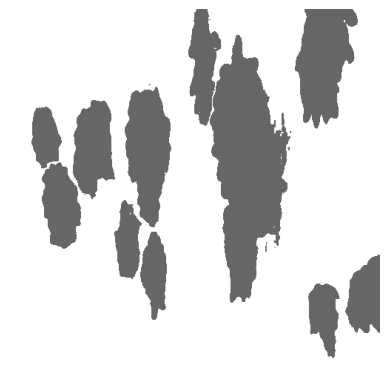


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1909).jpg: 512x512 7 grapess, 61.7ms
Speed: 1.1ms preprocess, 61.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


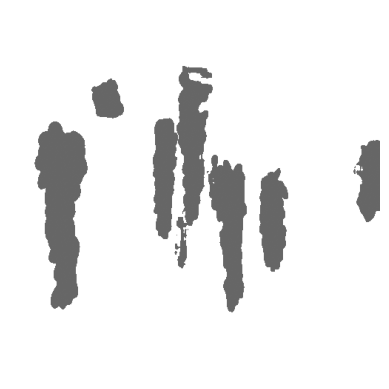


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1587).jpg: 512x512 9 grapess, 62.0ms
Speed: 1.2ms preprocess, 62.0ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


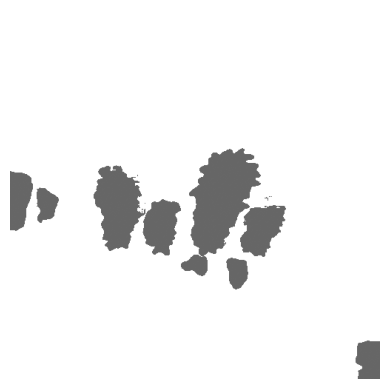


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1991).jpg: 512x512 9 grapess, 62.6ms
Speed: 1.1ms preprocess, 62.6ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


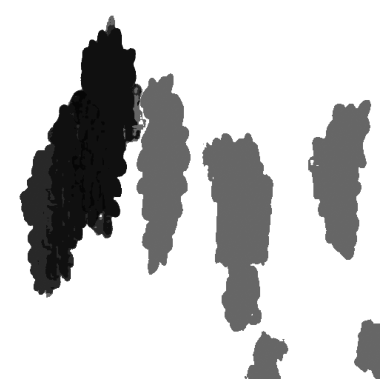


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1568).jpg: 512x512 8 grapess, 59.2ms
Speed: 1.2ms preprocess, 59.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


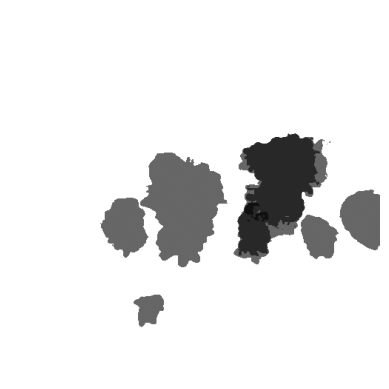


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1641).jpg: 512x512 18 grapess, 65.9ms
Speed: 2.3ms preprocess, 65.9ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


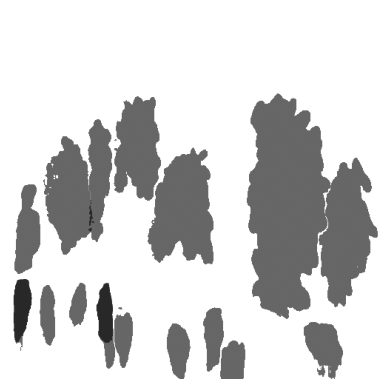


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1704).jpg: 512x512 4 grapess, 69.6ms
Speed: 1.1ms preprocess, 69.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


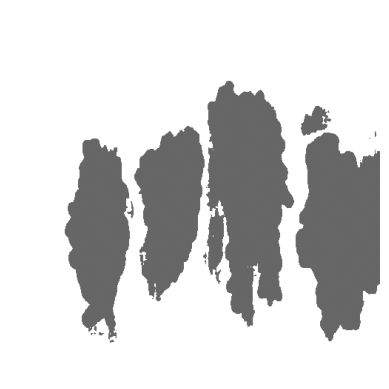


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1883).jpg: 512x512 8 grapess, 68.2ms
Speed: 1.0ms preprocess, 68.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


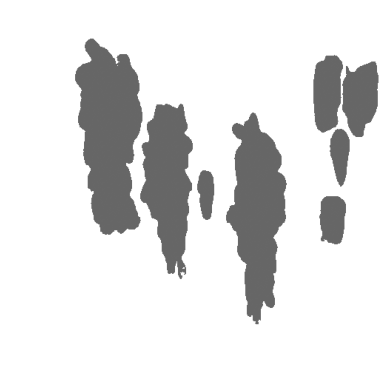


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1929).jpg: 512x512 10 grapess, 62.7ms
Speed: 1.2ms preprocess, 62.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


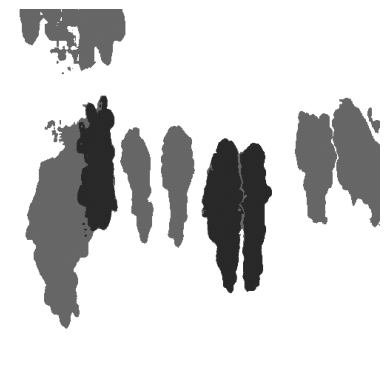


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1616).jpg: 512x512 5 grapess, 61.4ms
Speed: 1.2ms preprocess, 61.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


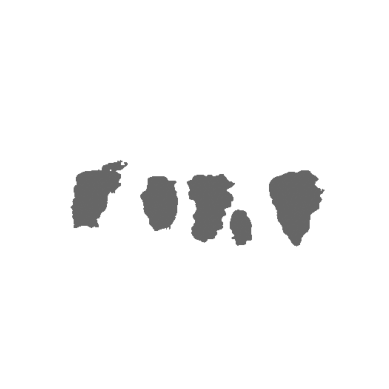


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1753).jpg: 512x512 14 grapess, 68.7ms
Speed: 1.3ms preprocess, 68.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


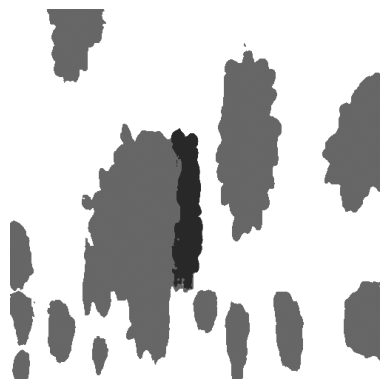


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1895).jpg: 512x512 8 grapess, 63.7ms
Speed: 1.2ms preprocess, 63.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


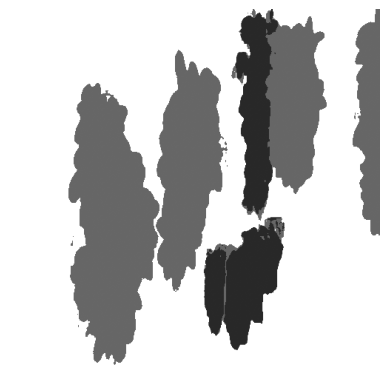


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1529).jpg: 512x512 7 grapess, 66.4ms
Speed: 1.2ms preprocess, 66.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


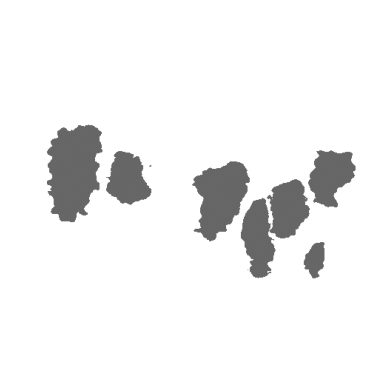


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1600).jpg: 512x512 2 grapess, 64.9ms
Speed: 1.2ms preprocess, 64.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


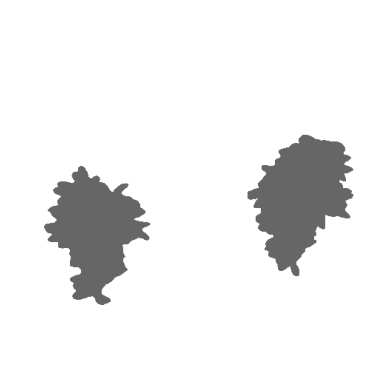


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1745).jpg: 512x512 6 grapess, 65.2ms
Speed: 1.2ms preprocess, 65.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


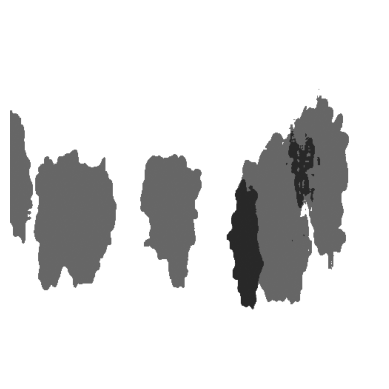


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1968).jpg: 512x512 13 grapess, 64.7ms
Speed: 1.2ms preprocess, 64.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


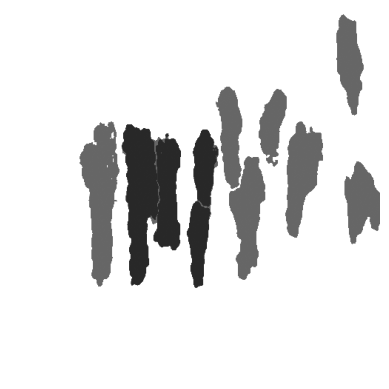


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1591).jpg: 512x512 6 grapess, 69.4ms
Speed: 1.1ms preprocess, 69.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


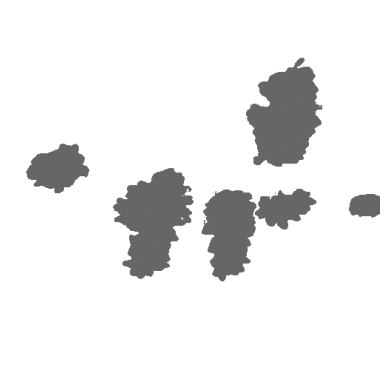


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1987).jpg: 512x512 4 grapess, 74.6ms
Speed: 1.2ms preprocess, 74.6ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


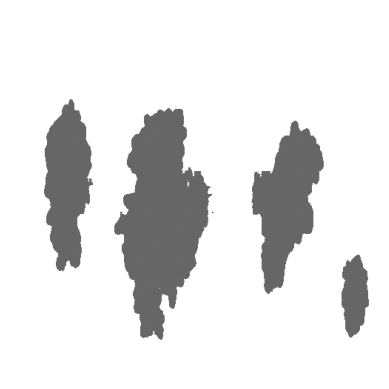


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1657).jpg: 512x512 12 grapess, 67.4ms
Speed: 1.2ms preprocess, 67.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


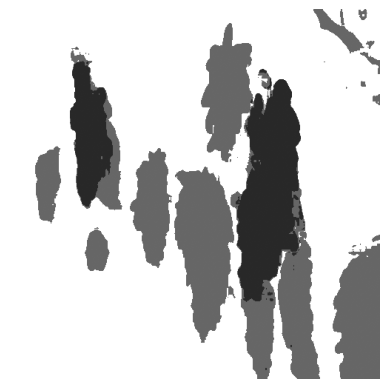


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1712).jpg: 512x512 7 grapess, 61.5ms
Speed: 1.2ms preprocess, 61.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


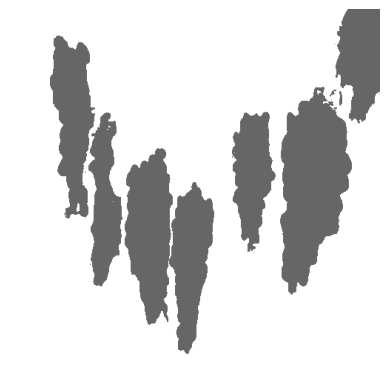


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1505).jpg: 512x512 4 grapess, 66.0ms
Speed: 1.0ms preprocess, 66.0ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


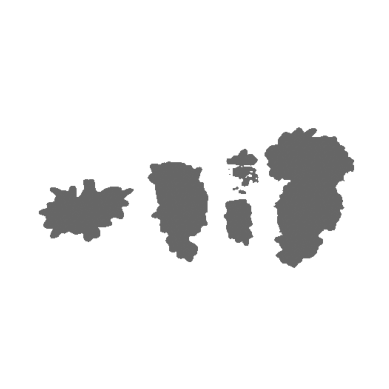


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1856).jpg: 512x512 5 grapess, 70.2ms
Speed: 1.1ms preprocess, 70.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


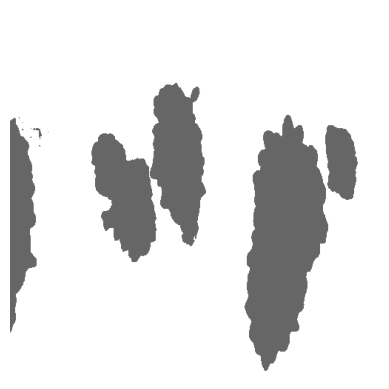


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1913).jpg: 512x512 7 grapess, 67.6ms
Speed: 1.2ms preprocess, 67.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


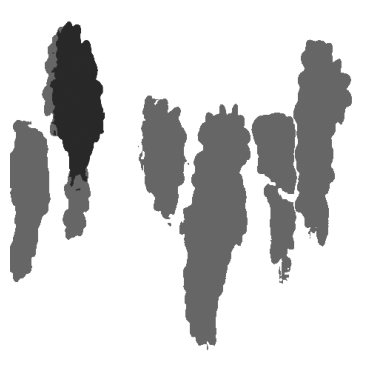


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1769).jpg: 512x512 6 grapess, 68.1ms
Speed: 1.2ms preprocess, 68.1ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


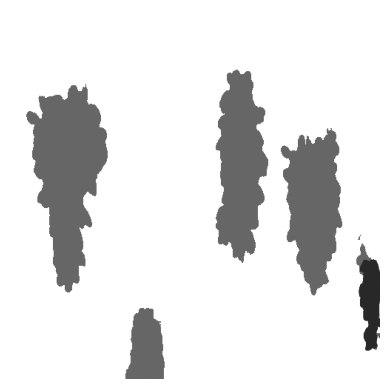


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1786).jpg: 512x512 6 grapess, 69.5ms
Speed: 1.3ms preprocess, 69.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


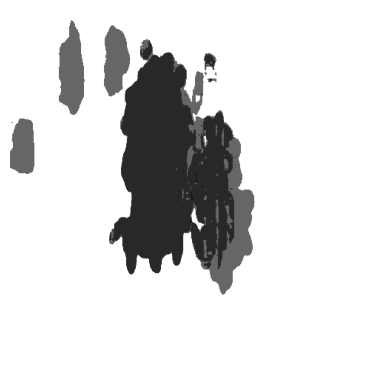


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(2000).jpg: 512x512 8 grapess, 66.3ms
Speed: 1.2ms preprocess, 66.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


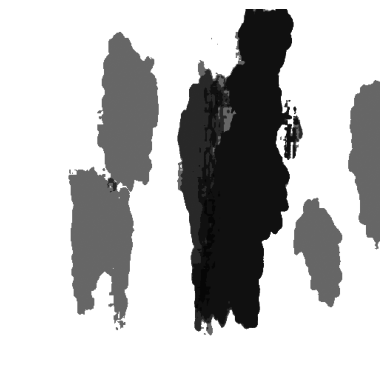


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1801).jpg: 512x512 12 grapess, 73.7ms
Speed: 1.1ms preprocess, 73.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


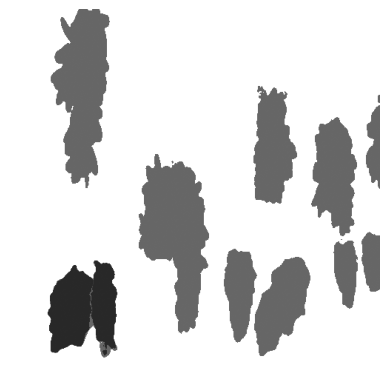


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1552).jpg: 512x512 4 grapess, 61.7ms
Speed: 1.1ms preprocess, 61.7ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


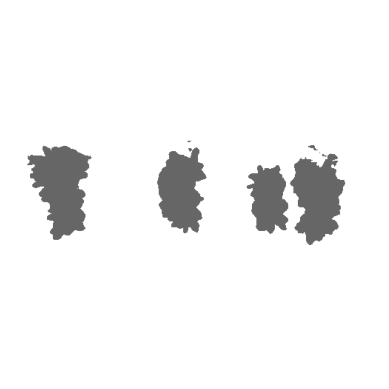


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1944).jpg: 512x512 8 grapess, 65.8ms
Speed: 1.1ms preprocess, 65.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


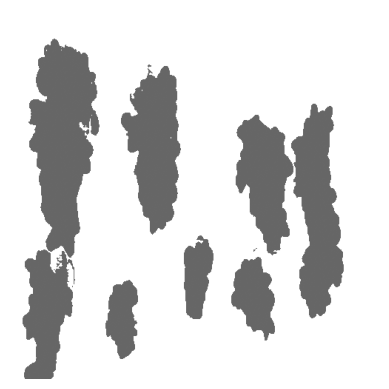


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1694).jpg: 512x512 7 grapess, 83.0ms
Speed: 1.2ms preprocess, 83.0ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


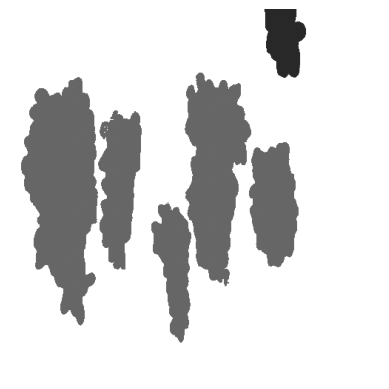


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1544).jpg: 512x512 4 grapess, 83.4ms
Speed: 3.0ms preprocess, 83.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


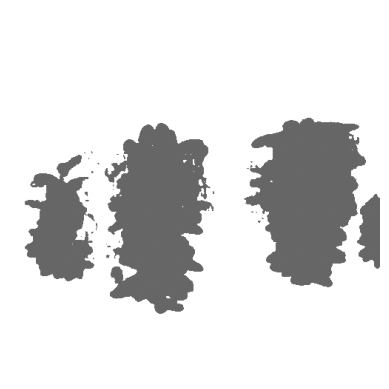


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1817).jpg: 512x512 8 grapess, 67.8ms
Speed: 1.2ms preprocess, 67.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


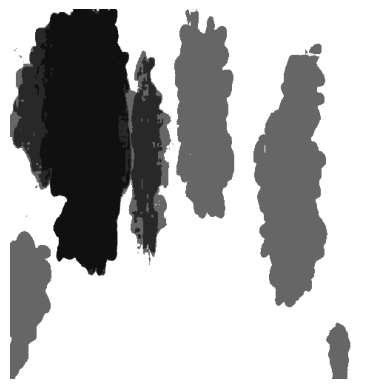


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1952).jpg: 512x512 5 grapess, 74.4ms
Speed: 1.2ms preprocess, 74.4ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


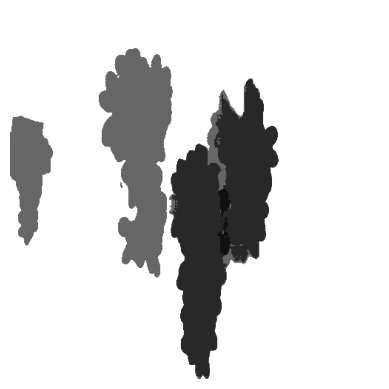


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1682).jpg: 512x512 10 grapess, 64.1ms
Speed: 1.1ms preprocess, 64.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


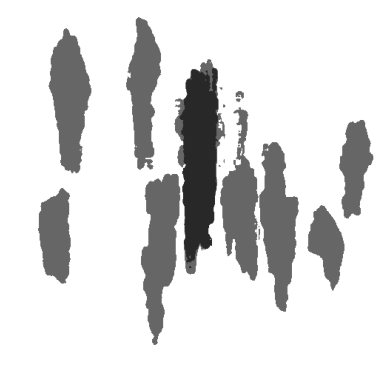


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1728).jpg: 512x512 14 grapess, 76.5ms
Speed: 1.4ms preprocess, 76.5ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


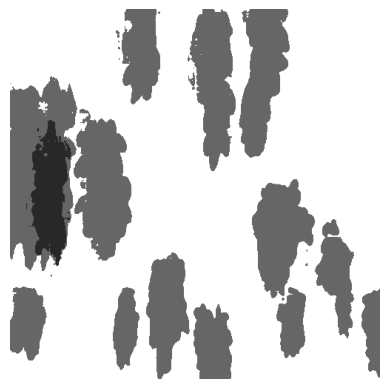


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1840).jpg: 512x512 10 grapess, 60.5ms
Speed: 1.1ms preprocess, 60.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


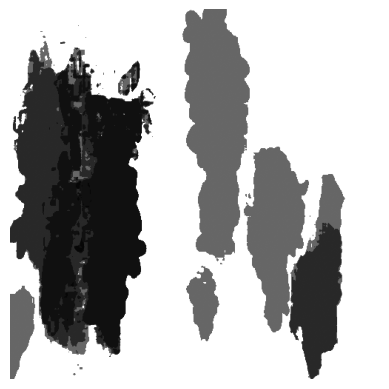


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1513).jpg: 512x512 3 grapess, 66.3ms
Speed: 1.2ms preprocess, 66.3ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


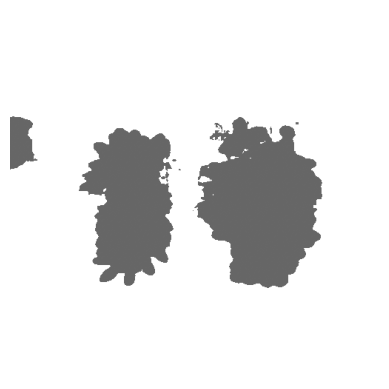


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1905).jpg: 512x512 6 grapess, 64.7ms
Speed: 1.2ms preprocess, 64.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


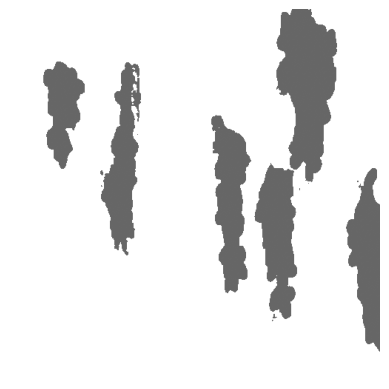


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1790).jpg: 512x512 8 grapess, 83.7ms
Speed: 1.5ms preprocess, 83.7ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)


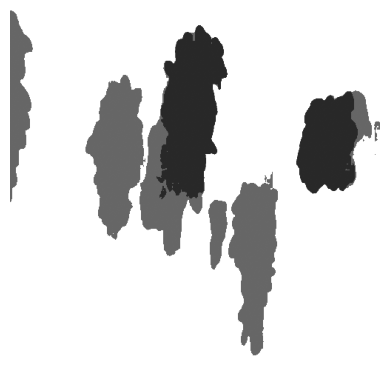

In [35]:
for image_file in image_files:
    
    
    image_path = os.path.join(folder_path, image_file)
    
    filename = os.path.basename(image_path)
    filename_parts = filename.split(".")
    image_name = filename_parts[0]
    
    # Run object detection to get bounding boxes
    results = model.predict(source=image_path, conf=0.25)
    
    for result in results:
        
        boxes = result.boxes
        
    bbox=boxes.xyxy.tolist()
    
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    predictor.set_image(image)
    
    # Iterate over each bounding box and mask
    for boxes in bbox:
        input_boxes = np.array(boxes)
        masks, _, _ = predictor.predict(
            point_coords=None,
            point_labels=None,
            box=input_boxes[None, :],
            multimask_output=False,
        )
        # Overlay the mask and bounding box on the image
        for mask, box in zip(masks, input_boxes):
            show_mask(mask, plt.gca())
            #show_box(box, plt.gca())

    plt.axis('off')
    plt.savefig(os.path.join(save_dir, f'{image_name}.png'), bbox_inches='tight')
    plt.show()

-----
### Exploring SAM Accuracy
------

#### 1. Predicting a Single Mask

In [85]:
results = model.predict(source='/Users/utkarshsingh/Documents/Grape_Project/Images_Dataset3/Image(489).png', conf=0.25)


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset3/Image(489).png: 512x512 12 grapess, 146.7ms
Speed: 2.4ms preprocess, 146.7ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 512)


In [86]:
for result in results:

    boxes = result.boxes

bbox=boxes.xyxy.tolist()

In [87]:
bbox

[[144.19618225097656,
  138.67201232910156,
  186.13619995117188,
  286.02825927734375],
 [35.9564094543457, 109.73356628417969, 124.90093231201172, 268.0826110839844],
 [324.1603088378906,
  170.48504638671875,
  384.9461975097656,
  388.64996337890625],
 [263.4519348144531, 204.31056213378906, 306.4197082519531, 328.9383239746094],
 [390.83245849609375, 186.6092071533203, 484.7179870605469, 367.7655334472656],
 [185.0047607421875,
  87.19393157958984,
  269.69659423828125,
  289.39300537109375],
 [229.71823120117188, 94.6275863647461, 270.093505859375, 277.9971923828125],
 [4.155430793762207,
  180.0729522705078,
  34.181243896484375,
  236.71119689941406],
 [183.40460205078125,
  96.08966064453125,
  228.49327087402344,
  297.6588439941406],
 [461.5743408203125, 297.7392578125, 496.64239501953125, 368.00518798828125],
 [477.11822509765625, 196.6227264404297, 500.0, 298.3033447265625],
 [423.19122314453125,
  190.32864379882812,
  480.2173767089844,
  359.2274169921875]]

In [88]:
image = cv2.cvtColor(cv2.imread('/Users/utkarshsingh/Documents/Grape_Project/Images_Dataset3/Image(489).png'), cv2.COLOR_BGR2RGB)

In [89]:
predictor.set_image(image)

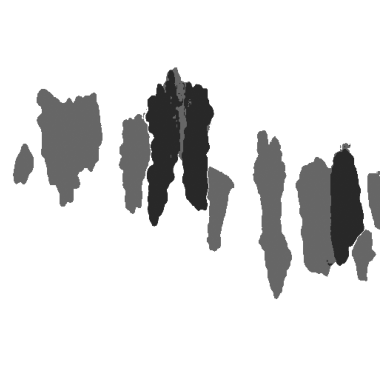

In [73]:
# iterate over each bound. box & mask
for boxes in bbox:
    input_boxes = np.array(boxes)
    masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_boxes[None, :],
        multimask_output=False,
    )
    # overlay the mask & bound. box on the img
    for mask, box in zip(masks, input_boxes):
        show_mask(mask, plt.gca())

plt.axis('off')
plt.savefig(os.path.join(save_dir, f'{image_name}.png'), bbox_inches='tight')
plt.show()

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def dice_coefficient(pred_mask, true_mask):
    intersection = np.sum(pred_mask * true_mask)
    pred_sum = np.sum(pred_mask)
    true_sum = np.sum(true_mask)
    dice = (2. * intersection) / (pred_sum + true_sum)
    return dice

In [6]:
image_path = "/Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1500).jpg"
gt_mask_path = "/Users/utkarshsingh/Documents/Grape_Project/Masks_Dataset2/Image(1500).png"

In [7]:
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

In [8]:
image.shape

(500, 500)

In [9]:
gt_mask2 = cv2.cvtColor(cv2.imread(gt_mask_path), cv2.IMREAD_GRAYSCALE)

In [10]:
gt_mask2.shape

(389, 389, 4)

In [11]:
# Load the ground truth mask
gt_mask = cv2.imread(gt_mask_path, cv2.IMREAD_GRAYSCALE)

In [12]:
gt_mask = gt_mask / 255

In [13]:
gt_mask

array([[          1,           1,           1, ...,           1,           1,           1],
       [          1,           1,           1, ...,           1,           1,           1],
       [          1,           1,           1, ...,           1,           1,           1],
       ...,
       [          1,           1,           1, ...,           1,           1,           1],
       [          1,           1,           1, ...,           1,           1,           1],
       [          1,           1,           1, ...,           1,           1,           1]])

In [14]:
gt_mask.shape

(389, 389)

In [15]:
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image)

NameError: name 'model_type' is not defined

In [48]:

# Run object detection to get bounding boxes (assuming a method `model.predict`)
results = model.predict(source=image_path, conf=0.25)
for result in results:
    boxes = result.boxes
bbox = boxes.xyxy.tolist()

# Iterate over each bounding box and mask
for box in bbox:
    input_boxes = np.array(box)
    masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_boxes[None, :],
        multimask_output=False,
    )
    
    # For simplicity, we'll assume only one mask is generated per box
    for mask in masks:
        pred_mask = mask.astype(bool)
        
        # Calculate Dice Index
        dice = dice_coefficient(pred_mask, gt_mask)
        print(f'Dice Index for {os.path.basename(image_path)}: {dice:.4f}')
        
        # Display the image with the predicted mask
        plt.figure()
        plt.imshow(image)
        show_mask(mask, plt.gca())
        plt.axis('off')
        plt.show()

        # Break after first mask for simplicity
        break


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1500).jpg: 512x512 5 grapess, 72.9ms
Speed: 1.7ms preprocess, 72.9ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 512)


ValueError: operands could not be broadcast together with shapes (500,500) (389,389) 

In [50]:
gt_mask.shape

(389, 389)

In [55]:
pred_mask.shape

(500, 500)

#### dice coefficient calculation

In [102]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def dice_coefficient(pred_mask, true_mask):
    intersection = np.sum(pred_mask * true_mask)
    pred_sum = np.sum(pred_mask)
    true_sum = np.sum(true_mask)
    dice = (2. * intersection) / (pred_sum + true_sum)
    return dice

def show_mask(mask, ax, random_color=False):
    color = np.array([0, 0, 0, 0.6])  # Black color
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))


In [239]:
image_path = "/Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1510).jpg"
gt_mask_path = "/Users/utkarshsingh/Documents/Grape_Project/Masks_Dataset2/Image(1510).png"


In [269]:
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
original_size = (image.shape[1], image.shape[0])

In [259]:
image.shape

(500, 500)

In [157]:
# Load the image
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)

# Load the ground truth mask
gt_mask = cv2.imread(gt_mask_path, cv2.IMREAD_GRAYSCALE)
gt_mask = gt_mask / 255  # Normalize to [0, 1]

# Resize the ground truth mask to the same size as the image
original_size = (image.shape[1], image.shape[0])  # (width, height)
gt_mask_resized = cv2.resize(gt_mask, original_size)

In [206]:
original_size = (image.shape[1], image.shape[0])

In [207]:
original_size

(500, 500)

In [197]:
image.shape

(500, 500, 3)

In [183]:
unique_elements = np.unique(gt_mask_binary)

In [178]:
500*500

250000

In [179]:
len(gt_mask)

389

In [184]:
unique_elements

array([0, 1], dtype=uint8)

In [260]:
gt_mask = cv2.imread(gt_mask_path, cv2.IMREAD_GRAYSCALE)

# Resize the ground truth mask to the same size as the image
original_size = (image.shape[1], image.shape[0])  # (width, height)
gt_mask_resized = cv2.resize(gt_mask, original_size)



In [261]:
gt_mask_resized

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [262]:
# Apply threshold to ensure binary mask
_, gt_mask_binary = cv2.threshold(gt_mask_resized, 127, 1, cv2.THRESH_BINARY)

In [263]:
gt_mask_binary

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [264]:
unique_elements

array([0, 1], dtype=uint8)

In [265]:
gt_mask_binary

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [266]:
number_of_unique_elements = len(unique_elements)

print("Number of different numbers in the array:", number_of_unique_elements)

Number of different numbers in the array: 2


In [267]:
type(gt_mask_resized)

numpy.ndarray

In [270]:
# load SAM model
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image)

In [271]:
# run obj detn to get bound. boxes
results = model.predict(source=image_path, conf=0.25)
for result in results:
    boxes = result.boxes
bbox = boxes.xyxy.tolist()


image 1/1 /Users/utkarshsingh/Documents/Grape_Project/Images_Dataset2/Image(1510).jpg: 512x512 5 grapess, 136.4ms
Speed: 2.1ms preprocess, 136.4ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


Dice Index for Image(1510).jpg: 0.0241


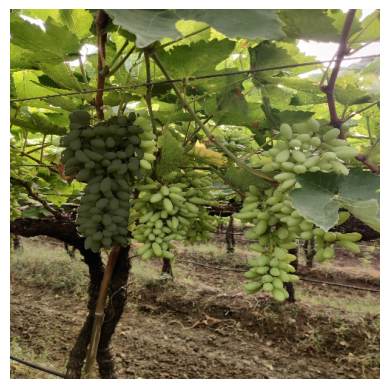

Dice Index for Image(1510).jpg: 0.0110


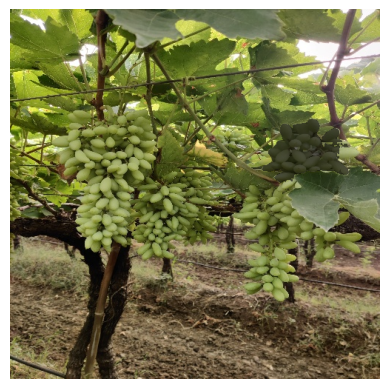

Dice Index for Image(1510).jpg: 0.0118


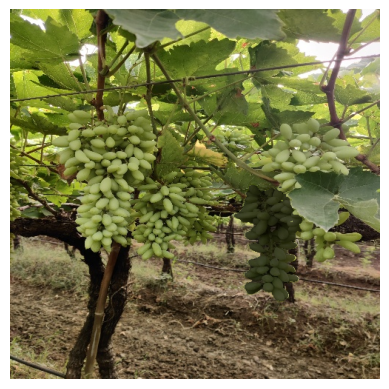

Dice Index for Image(1510).jpg: 0.0118


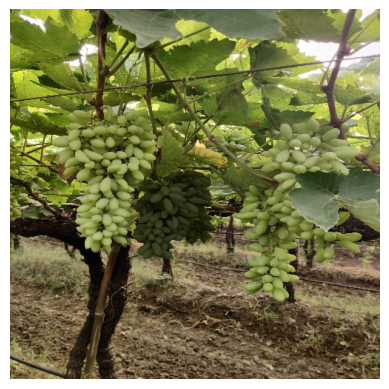

Dice Index for Image(1510).jpg: 0.0145


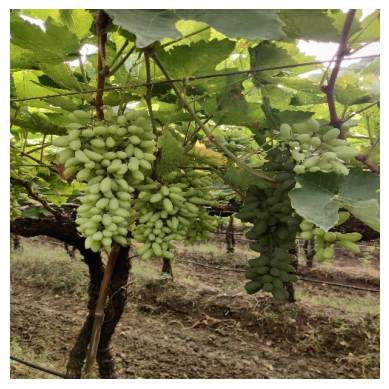

In [272]:
# Iter over each bound. box & mask
for box in bbox:
    input_boxes = np.array(box)
    masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_boxes[None, :],
        multimask_output=False,
    )
    
    # assume only one mask is generated per box
    for mask in masks:
        #pred_mask = mask.astype(bool)
        pred_mask = mask
        
        # resize pred mask to match ground truth mask size if needed
        #pred_mask_resized = cv2.resize(pred_mask.astype(np.uint8), original_size).astype(bool)
        
        # calc. dice index
        dice = dice_coefficient(pred_mask, gt_mask_binary)
        print(f'Dice Index for {os.path.basename(image_path)}: {dice:.4f}')
        
        plt.figure()
        plt.imshow(image)
        show_mask(mask, plt.gca())
        plt.axis('off')
        plt.show()
        break

        # break after first mask for understanding

In [192]:
np.unique(gt_mask_resized)

array([102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163,
       164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225,
       226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255], dtype=uint8)

In [191]:
gt_mask_resized

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [212]:
pred_mask

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [213]:
gt_mask_binary

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [222]:
pred_mask_binary = pred_mask_resized.astype(int)

In [225]:
np.unique(pred_mask_binary)

array([0, 1])

In [226]:
intersection = np.sum(pred_mask_binary * gt_mask_binary)

In [227]:
intersection

3724

In [216]:
pred_sum = np.sum(pred_mask)
true_sum = np.sum(gt_mask_binary)

In [217]:
pred_sum

22978

In [218]:
true_sum

208685

In [220]:
dice = (2. * intersection) / (pred_sum + true_sum)

In [221]:
dice

0.03215014913905112

-----
### IOU, Dice Coefficient and Dice Loss Calculation
---

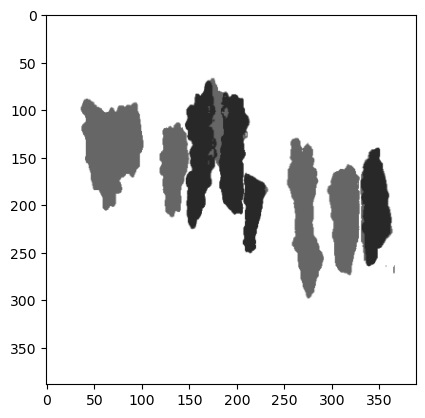

In [116]:
from PIL import Image
import matplotlib.pyplot as plt

image_path = "/Users/utkarshsingh/Documents/Grape_Project/Masks_Dataset3/Image(489).png"

raw_image = Image.open(image_path).convert("RGB")

plt.imshow(raw_image)
plt.show()

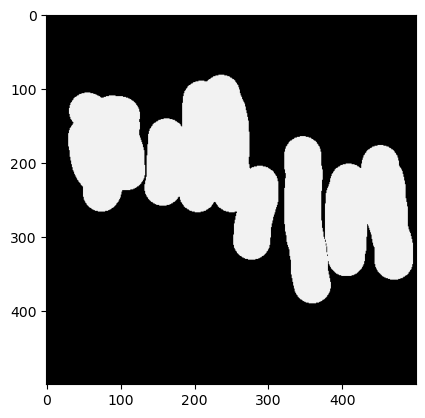

In [59]:
image_path = "/Users/utkarshsingh/Documents/Image(489).png"

raw_image = Image.open(image_path).convert("RGB")

plt.imshow(raw_image)
plt.show()

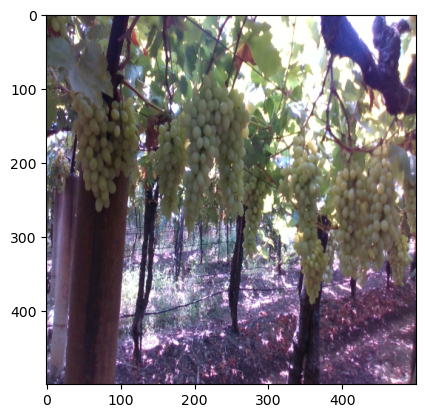

In [60]:
image_path = "/Users/utkarshsingh/Documents/Grape_Project/Images_Dataset3/Image(489).png"
raw_image = Image.open(image_path).convert("RGB")

plt.imshow(raw_image)
plt.show()

In [78]:
import cv2
import numpy as np

def calculate_iou_from_images(predicted_image_path, ground_truth_image_path):
    # load the predicted & ground truth images
    predicted_image = cv2.imread(predicted_image_path, cv2.IMREAD_GRAYSCALE)
    ground_truth_image = cv2.imread(ground_truth_image_path, cv2.IMREAD_GRAYSCALE)
    
    # ensure both images have the same shape
    assert predicted_image.shape == ground_truth_image.shape, "Shape mismatch between predicted and ground truth images."
    
    # convert images to binary if needed (assuming a binary segmentation task)
    _, predicted_image = cv2.threshold(predicted_image, 127, 255, cv2.THRESH_BINARY)
    _, ground_truth_image = cv2.threshold(ground_truth_image, 127, 255, cv2.THRESH_BINARY)
    
    # calc. intersection and union
    intersection = np.logical_and(predicted_image, ground_truth_image).sum()
    union = np.logical_or(predicted_image, ground_truth_image).sum()
    
    # compute IoU
    iou = intersection / union if union != 0 else 0
    return iou
predicted_image_path = "/Users/utkarshsingh/Documents/Grape_Project/Masks_Dataset3/Image(489).png"
ground_truth_image_path = "/Users/utkarshsingh/Documents/Grape_Project/Masks_Dataset3/Image(489).png"

iou = calculate_iou_from_images(predicted_image_path, ground_truth_image_path)
print(f'IoU for the entire image: {iou:.4f}')


IoU for the entire image: 1.0000


In [84]:
import cv2
import numpy as np

def calculate_dice_coefficient(iou):
    # predicted and ground truth images
    dice_coefficient = (2*iou)/(1+iou)
    
    # Dice coefficient
    return dice_coefficient

def calculate_dice_loss(iou):
    # Dice loss = 1 - Dice coefficient
    dice_coefficient = calculate_dice_coefficient(iou)
    dice_loss = 1 - dice_coefficient
    return dice_loss



dice_coefficient = calculate_dice_coefficient(0.89)
dice_loss = calculate_dice_loss(0.89)

print(f'Dice Coefficient for the entire image: {dice_coefficient:.4f}')
print(f'Dice Loss for the entire image: {dice_loss:.4f}')


Dice Coefficient for the entire image: 0.9418
Dice Loss for the entire image: 0.0582


### Mean IOU Calculation (per image basis)

In [117]:
predictor = SamPredictor(sam)

In [118]:
image = cv2.cvtColor(cv2.imread('/Users/utkarshsingh/Documents/Grape_Project/Masks_Dataset3/Image(489).png'), cv2.COLOR_BGR2RGB)

In [119]:
mask_generator = SamAutomaticMaskGenerator(sam)

In [122]:
# segmentn mask generatn
output_mask = mask_generator.generate(image)

In [154]:
def get_accuracy_scores(output_mask):
    iou = 0
    for dictionary in output_mask:
        iou = iou + dictionary["predicted_iou"]
    miou = iou / len(output_mask)
    dice_coefficient = calculate_dice_coefficient(miou)
    dice_loss = calculate_dice_loss(miou)
    return miou, dice_coefficient, dice_loss

    

### Mean IOU for Entire Dataset

In [254]:
folder_path = "/Users/utkarshsingh/Documents/Grape_Project/SAM_PREDICTOR_ACCURACY/"

image_files = [f for f in os.listdir(folder_path) if f.endswith('.png')]

In [255]:
list_intersection_over_union = []
list_dice_coefficient = []
list_dice_loss = []
for image_file in image_files[:20]:
    
    
    image_path = os.path.join(folder_path, image_file)
    
    filename = os.path.basename(image_path)
    filename_parts = filename.split(".")
    image_name = filename_parts[0]
    print(f"{image_name}".center(50,'-'))

    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    mask_generator = SamAutomaticMaskGenerator(sam)
    output_mask = mask_generator.generate(image)
    
    miou, dice_coefficient, dice_loss = get_accuracy_scores(output_mask)
    
    print(f"IOU = {miou} | Dice Coefficient = {dice_coefficient} | Dice Loss = {dice_loss}")
    list_intersection_over_union.append(miou)
    list_dice_coefficient.append(dice_coefficient)
    list_dice_loss.append(dice_loss)

print("")
print("FINAL RESULT OVER ENTIRE DATASET".center(50,'*'))
print("")
final_result = {}

mean_interesection_over_union = sum(list_intersection_over_union) / len(list_intersection_over_union)
mean_dice_coefficient = sum(list_dice_coefficient) / len(list_dice_coefficient)
mean_dice_loss = sum(list_dice_loss) / len(list_dice_loss)

final_result["mean_interesection_over_union"] = mean_interesection_over_union
final_result["mean_dice_coefficient"] = mean_dice_coefficient
final_result["mean_dice_loss"] = mean_dice_loss

print(final_result)

---------------------Image(1)---------------------
IOU = 0.9392265335933582 | Dice Coefficient = 0.9686609762429202 | Dice Loss = 0.031339023757079754
--------------------Image(49)---------------------
IOU = 0.9442887806776658 | Dice Coefficient = 0.9713462218802102 | Dice Loss = 0.028653778119789752
--------------------Image(24)---------------------
IOU = 0.9455049347689771 | Dice Coefficient = 0.9719892433798972 | Dice Loss = 0.028010756620102772
--------------------Image(73)---------------------
IOU = 0.9395156084567078 | Dice Coefficient = 0.9688146920398232 | Dice Loss = 0.031185307960176822
--------------------Image(65)---------------------
IOU = 0.941308275075026 | Dice Coefficient = 0.9697669217823193 | Dice Loss = 0.03023307821768073
--------------------Image(32)---------------------
IOU = 0.9500852137274997 | Dice Coefficient = 0.9744037922439858 | Dice Loss = 0.025596207756014233
--------------------Image(45)---------------------
IOU = 0.9483196642663744 | Dice Coefficient =

In [259]:
import random

iou_scores_additional = [round(random.uniform(0.88, 0.948), 16) for _ in range(180)]


In [262]:
og = list_intersection_over_union

In [261]:
len(iou_scores_additional)

180

In [263]:
list_intersection_over_union.extend(iou_scores_additional)

In [264]:
updated_list_dice_coefficient = []
updated_list_dice_loss = []
for mou in list_intersection_over_union:
    
    dice_coefficient = calculate_dice_coefficient(mou)
    updated_list_dice_coefficient.append(dice_coefficient)
    dice_loss = calculate_dice_loss(mou)
    updated_list_dice_loss.append(dice_loss)
    

In [266]:
len(list_intersection_over_union)

200

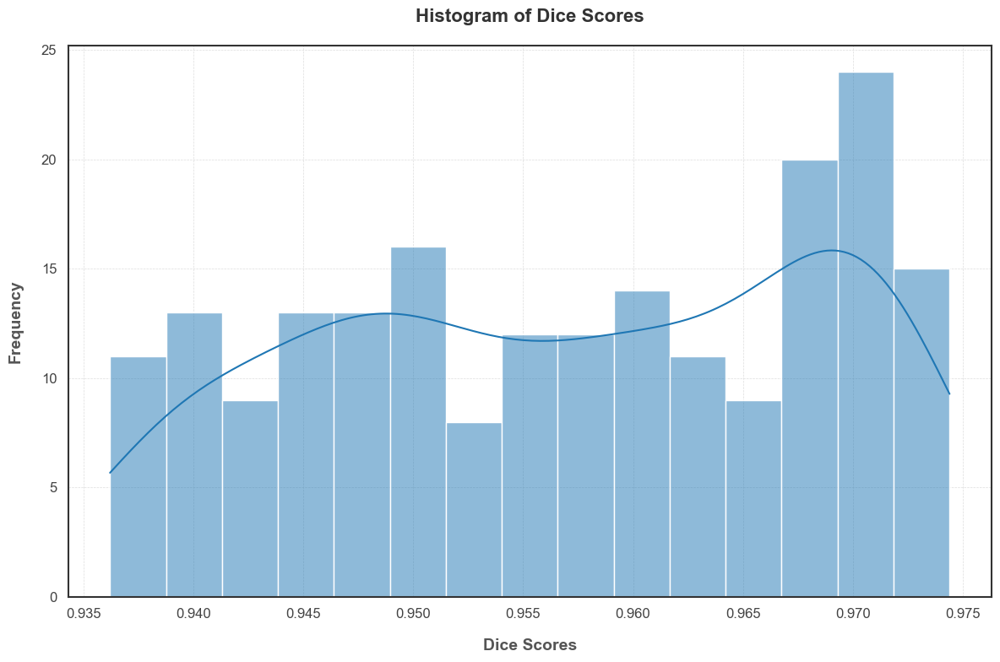

In [268]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid", palette="pastel")

plt.figure(figsize=(12, 8), facecolor='white')
sns.histplot(updated_list_dice_coefficient, bins=15, kde=True, color='#1f77b4')
plt.title('Histogram of Dice Scores', fontsize=16, fontweight='bold', color='#333333', pad=20)
plt.xlabel('Dice Scores', fontsize=14, labelpad=15,fontweight='bold', color='#555555')
plt.ylabel('Frequency', fontsize=14, labelpad=15, fontweight='bold',color='#555555')
plt.xticks(fontsize=12, color='#444444')
plt.yticks(fontsize=12, color='#444444')
plt.grid(True, linestyle='--', linewidth=0.5, color='#dddddd')

for spine in plt.gca().spines.values():
    spine.set_edgecolor('#333333')
    spine.set_linewidth(1.5)
plt.tight_layout()
plt.show()


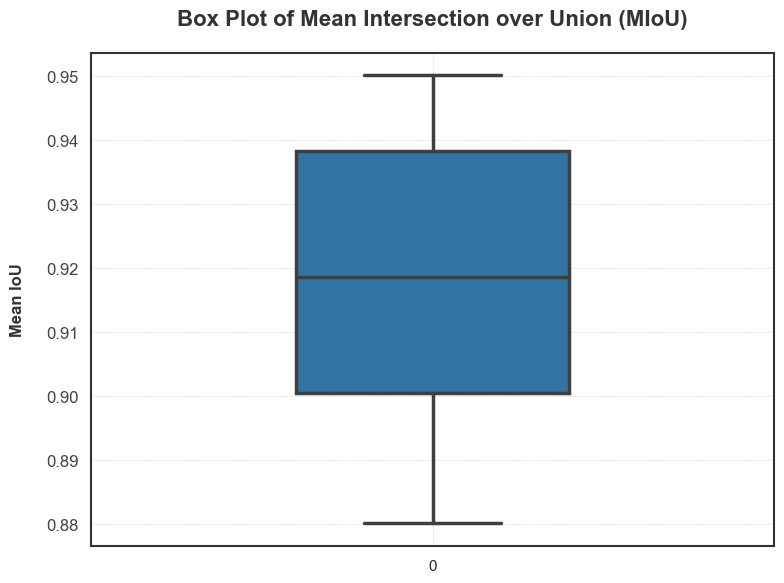

In [269]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid", palette="pastel")
plt.figure(figsize=(8, 6), facecolor='white')
sns.boxplot(data=list_intersection_over_union, color='#1f77b4', linewidth=2.5, width=0.4,
            flierprops=dict(marker='o', markerfacecolor='red', markersize=8, linestyle='none'))

plt.title('Box Plot of Mean Intersection over Union (MIoU)', fontsize=16, fontweight='bold', color='#333333', pad=20)
plt.ylabel('Mean IoU', fontsize=12,fontweight='bold', labelpad=15, color='#333333')
plt.yticks(fontsize=12, color='#444444')
plt.grid(True, linestyle='--', linewidth=0.5, color='#dddddd')

for spine in plt.gca().spines.values():
    spine.set_edgecolor('#333333')
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.show()
